# Handwritten Tabular Form — column-wise processing, **v5** (GOT-OCR-2.0)

Scanned or photographed Meenakshi Polymers forms (PDFs or images) are turned into one CSV row per handwritten
**record**. The page is cut by column, each column strip is split back into its printed rows, and every cell is
read by **GOT-OCR-2.0** in batches, so each value keeps the (row, column) it came from.

| # | Stage | What it does |
|---|-------|--------------|
| 0–9 | Setup → grid | render PDFs / load images (jpg, png, tif …) at 300 DPI, denoise / flatten / deskew, find the table, its rows and columns, name them from the template |
| 7b | **Form identification** | read the printed heading, score it against every template (file name = fallback only) |
| 8b | **Table Transformer fallback** *(v5)* | only when the OpenCV grid fails (phone photos): Microsoft Table Transformer finds the rows / columns, each boundary is snapped to the nearest printed line |
| 10 | Column crops | one padded crop per column, spanning the whole data area |
| 11 | Line removal | erase the printed grid from each column strip, keeping the strokes that cross it |
| 11b | **Cancel strokes** *(v5)* | find the long diagonal line drawn through unused rows and erase it |
| 12 | Debug views | the column strips, before and after |
| 13 | GOT-OCR-2.0 | loads the model; `got_generate_batch()` reads many cells in one call *(v5)* |
| 14 | **Column reader** *(v5)* | overlapping row bands with ink ownership: each band reaches past its printed lines, every ink shape belongs to exactly one row |
| 15 | Run + JSON | `columns_ocr_results_GOT.json` + `columns_ocr_entries_GOT.csv` — one entry per printed cell (the physical layer) |
| 16 | **Records** *(v5)* | printed rows grouped into records by the anchor column, ditto marks filled; `records_GOT.json` + `structured_GOT/<pdf>.csv` (the logical layer, every value with its `source_cells`) |
| 16b | Run report | `report/`: per-page and per-column scorecard, `review_cells.csv` of everything worth a human look |
| 17 | Save + download | zip the output folder |

**What changed in v5, and why** (measured on the 7 ledger forms before writing it):
* **Row bands overlap.** ~35% of filled cells had handwriting crossing into the row above or below, and v4's hard
  cut at the printed line clipped them (the tails then showed up as `I` / `111` in the next row). Each band now
  reaches `ROW_OVERLAP` of the row height past its lines, and ink owned by the neighbouring row is whited out.
  Overflow into the next *column* is rare (~5%, mostly already handled), so that part is unchanged.
* **Records, not printed rows.** On the supplier forms every record is written over two printed rows and only the
  first has a DATE. A row with no anchor value now continues the record above (up to `max_rows_per_record`).
* **Cancel strokes.** Unused rows are often struck through with one long diagonal line; it was being read as data.
* **Batched OCR.** Cells are still read one image each (so the row is known), but many per model call. The batch
  is sized to the GPU at run time (Stage 13, `auto_batch_size()`) rather than fixed: GPU memory scales linearly
  with it and the 1024x1024 vision encoder dominates, so a fixed 16 exhausted a 15 GB T4 before the first cell
  was read. GOT is loaded with SDPA attention, which never materialises the 384 MiB attention matrix per image,
  and a batch that still runs out of memory is halved *after* the handler exits, so the retry has memory to use.
* **GOT-OCR-2.0 only.** TrOCR and the two-engine comparison of v4 are gone.

**Pre-processing (Stage 6), revised**

* **Ink channel, not luminance.** `INK_CHANNEL = "min"` takes the darkest of B/G/R per pixel. Blue ballpoint
  reflects blue, so it is barely darker than paper in the blue channel (measured on this data: ink B=155 vs
  G=72, paper ~240). Luminance is already 0.587 green and gets most of that, the per-pixel minimum gets the
  rest - and handles red corrections and black print with the same line.
* **Perspective de-warp for photos** (`PHOTO_DEWARP`). A page shot at an angle has *converging* column lines,
  and `align_matrix()` is affine - rotation and shear cannot straighten a converging line. Stage 6 now finds
  the table's four corners and maps them onto a rectangle, composed with the affine step into ONE warp, so the
  page is still resampled only once. `table_quad()` deliberately avoids `line_masks()`: its 120 px axis-aligned
  opening kernel drops a tilted rule (a 7-degree test page lost 69% of its vertical mask), which is the very
  failure the de-warp exists to fix. Scans are untouched - the skew test finds nothing to correct.
* **Denoise strength per input class.** `DENOISE_H` 7 -> 4 for scans, 8 for photos. A ballpoint stroke at
  300 DPI is 4-8 px wide, inside the old smoothing radius; the QTY digits were paying for it.
* **`CLAHE_CLIP` 2.0 -> 1.5.** `flatten_illumination()` has already evened the page out, so a high clip limit
  mostly amplifies paper texture in *blank* cells - which `INK_GRAY_THRESH` / `MIN_INK_PIXELS` then count as
  ink, and an inked anchor cell is what starts a record. Over-contrast invents records.
* **Aspect-capped cell crops** (`PAD_ASPECT_MAX = 6.0`, Stage 14). GOT scales every input to a fixed square, so
  a 500x60 REMARKS cell was squashed ~8x vertically. Wider crops are white-padded to 6:1 - not to a square,
  which would leave the writing tiny once the square is scaled down.

Not changed, deliberately: the chain still denoises *before* the warp. Moving it after would be marginally
better on resampled pixels, but every downstream px constant (`INK_GRAY_THRESH`, `MIN_ENTRY_INK`,
`GRID_RESIDUE_PX` ...) was calibrated on the current order, and none of this is measured yet.

**Which form is it?** Stage 7b identifies every page from the heading PRINTED on it; the file name is only a
fallback and `TEMPLATE_BY_FILE` still forces a template. The daily MIS reports (`layout="matrix"`) and BS6
straight-pass sheets (`layout="blocked"`) are identified but not yet extracted — Stage 8 skips them with a note.

**Grid: OpenCV first, Table Transformer as fallback.** On the scans OpenCV places every printed line to a few px;
Table Transformer was measured 6–50 px off (rows are only 64–84 px tall), so it is not used there. On phone photos,
where OpenCV misses lines, Stage 8b uses it for the structure and snaps each boundary to a printed line.

**Known limits.** Phone photos (~150 DPI, perspective) are still the weakest input — check their
`04_rows_columns.png`, or pin the grid in `MANUAL_CONFIG`; Stage 5 flags low-resolution input. Confidence is a hint, not accuracy — measuring accuracy needs a
hand-labelled sample.

In [ ]:
# ============================================================================
# STAGE 0 — SETUP
# Installs only what is missing (Colab already ships torch, transformers, OpenCV,
# pandas and matplotlib; PyMuPDF is the one usually needed).
#
# NOTE ON TOKENIZERS: GOT-OCR-2.0's Qwen-based tokenizer can need
# `sentencepiece` / `tiktoken` installed to build their FAST tokenizer, and transformers only checks for these
# once, at import time. If this cell has to install either of them for the first time, RESTART THE RUNTIME /
# KERNEL and re-run from the top - otherwise Stage 13 fails with:
#     "Couldn't instantiate the backend tokenizer ... You need to have sentencepiece or tiktoken installed"
# even though the package is now on disk, because transformers already cached the "not available" answer.
# ============================================================================
import importlib.util, importlib.metadata, subprocess, sys
from packaging.version import Version

def ensure(pip_name, module=None):
    """pip-install `pip_name` if `module` cannot be imported. Returns True if it had to be installed."""
    if importlib.util.find_spec(module or pip_name) is None:
        print(f"installing {pip_name} ...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pip_name])
        return True
    return False

_newly_installed = []

# transformers is pinned (not just ensure()d) to a range that supports GOT-OCR-2.0 (added 4.49) but stays
# below 5.0, where a TokenizersBackend regression makes fast-tokenizer loading wrongly demand
# sentencepiece/tiktoken even for byte-level BPE tokenizers - breaking Stage 13 with
# "Couldn't instantiate the backend tokenizer ... sentencepiece or tiktoken" even when both are installed.
_TRANSFORMERS_MIN, _TRANSFORMERS_MAX = Version("4.49"), Version("5.0")
try:
    _cur_transformers = Version(importlib.metadata.version("transformers"))
except importlib.metadata.PackageNotFoundError:
    _cur_transformers = None
if _cur_transformers is None or not (_TRANSFORMERS_MIN <= _cur_transformers < _TRANSFORMERS_MAX):
    print(f"pinning transformers to >=4.49,<5.0 (was {_cur_transformers}) ...")
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "transformers>=4.49,<5.0"])
    _newly_installed.append("transformers")

for pip_name, module in [("pymupdf", "pymupdf"), ("opencv-python-headless", "cv2"),
                         ("torch", "torch"),
                         ("pandas", "pandas"), ("matplotlib", "matplotlib"), ("pillow", "PIL"),
                         ("sentencepiece", "sentencepiece"), ("tiktoken", "tiktoken"), ("tabulate", "tabulate"),
                         ("timm", "timm")]:                  # timm: Table Transformer fallback (Stage 8b)
    if ensure(pip_name, module):
        _newly_installed.append(pip_name)
print("setup OK")
if _newly_installed:
    print(f"\nJust installed: {', '.join(_newly_installed)}")
    print("If any of these is sentencepiece/tiktoken, RESTART THE RUNTIME now and re-run from this cell -")
    print("transformers caches tokenizer-backend availability at import time, so a same-session install of")
    print("either package is invisible to it until the process restarts.")

pinning transformers to >=4.49,<5.0 (was 5.17.0) ...
installing pymupdf ...
setup OK

Just installed: transformers, pymupdf
If any of these is sentencepiece/tiktoken, RESTART THE RUNTIME now and re-run from this cell -
transformers caches tokenizer-backend availability at import time, so a same-session install of
either package is invisible to it until the process restarts.


In [ ]:
# ============================================================================
# STAGE 1 — CONFIG + SMALL UTILITIES
# Everything you may want to tune lives here.
# ============================================================================
import os, re, gc, json, glob, math, time, shutil, warnings
from dataclasses import dataclass, field
from datetime import datetime
from typing import Optional

import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

warnings.filterwarnings("ignore")

# ---- CUDA allocator ------------------------------------------------------------
# The OCR batches (Stage 13/14) allocate and free large, differently sized activation blocks, which fragments
# the GPU heap: an allocation then fails for want of one CONTIGUOUS slab while plenty of memory is free overall.
# Expandable segments let the allocator grow an existing block instead. The setting is read once, when the CUDA
# allocator first initialises, so it has to be set here - before anything touches the GPU (Stage 7b loads GOT).
os.environ.setdefault("PYTORCH_CUDA_ALLOC_CONF", "expandable_segments:True")

IN_COLAB = "google.colab" in sys.modules

# ---- permanent storage (Colab) -------------------------------------------------
# Colab's own disk (/content) is wiped when the runtime ends, so on Colab the uploads AND every
# output file live in this Google Drive folder instead - they are still there after a restart.
DRIVE_ROOT = "/content/drive/MyDrive/MeenakshiPublic"

def mount_drive():
    """Mount Google Drive once (Colab only). Safe to call again - it is a no-op when already mounted."""
    if not IN_COLAB:
        return
    from google.colab import drive                      # only available inside Colab
    if not os.path.isdir("/content/drive/MyDrive"):
        drive.mount("/content/drive")

mount_drive()                                           # needed before the makedirs further down

# ---- where the PDFs / images come from -------------------------------------------------
INPUT_MODE     = "drive" if IN_COLAB else "local"      # "drive" | "upload" | "local"
DRIVE_PDF_DIR  = f"{DRIVE_ROOT}/Datasetpdf"             # used when INPUT_MODE == "drive"
LOCAL_PDF_DIR  = "Dataset"                              # used when INPUT_MODE == "local"
UPLOAD_DIR     = f"{DRIVE_ROOT}/uploads" if IN_COLAB else "uploads"      # used when INPUT_MODE == "upload"
ONLY_FILES     = []                                     # e.g. ["WELD"] to process only matching file names
AUTO_TEMPLATE  = True                                   # identify EVERY page from the heading printed on it
                                                        # (Stage 7b); the file name is only the fallback.
                                                        # False = file name only (the pre-v4.21 behaviour)
OUTPUT_DIR     = f"{DRIVE_ROOT}/ocr_output_v5.1_column" if IN_COLAB else "ocr_output_v5.1"   # crops / debug / JSON / CSV
COPY_OUTPUT_TO_DRIVE = None                             # not needed on Colab any more: OUTPUT_DIR is already on Drive

# ---- rendering / pre-processing ----------------------------------------------
GOT_MODEL_ID   = "stepfun-ai/GOT-OCR-2.0-hf"        # the OCR model (Stage 7b reads the heading with it, Stage 14 the cells)

PDF_BACKEND    = "pymupdf"      # "pymupdf" | "pdf2image" (needs poppler; installed automatically on Colab)
DPI            = 300            # requirement: 300 DPI page images
IMAGE_EXTS     = (".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp", ".webp")   # image files are read as well as PDFs
INPUT_EXTS     = (".pdf",) + IMAGE_EXTS
IMAGE_PAGE_SHORT_IN = 8.27      # an image has no physical size: unless it carries a believable DPI tag (scanner
                                # output), its SHORT side is taken to be A4's 8.27 in and the image is scaled to
                                # 8.27 * DPI px on that side, so every px setting below stays valid
MIN_SOURCE_DPI = 200            # warn when the source (scan, phone photo, image) holds less detail than this -
                                # upscaling to DPI adds pixels, not detail
INK_CHANNEL    = "min"          # how the colour page becomes ONE channel, before anything else:
                                #   "min"  - per pixel, the darkest of B/G/R. Coloured ink is far darker in the
                                #            channels it absorbs (measured on this data: blue pen reads G=72 / B=155
                                #            against paper ~240), while black print and white paper are unchanged.
                                #            Robust to whatever pen was used, including red corrections.
                                #   "gray" - the ITU luminance cvtColor() used before (0.587 of it is already green,
                                #            so it captures most of the blue-ink gain, but not all)
                                #   "b" | "g" | "r" - one fixed channel
DENOISE_H      = 4              # fastNlMeans strength for SCANS (was 7). A ballpoint stroke at 300 DPI is only
                                # ~4-8 px wide, well inside the smoothing radius, so 7 was thinning thin strokes;
                                # the digits in the narrow QTY columns are where that shows up first.
DENOISE_H_PHOTO = 8             # ... a photo carries real sensor noise and needs more (see PHOTO_MAX_DPI)
CLAHE_CLIP     = 1.5            # contrast enhancement strength (was 2.0). flatten_illumination() has already
                                # evened out the page, so CLAHE's remaining job is only to darken faint pen; a high
                                # clip limit mostly amplifies paper texture inside BLANK cells, and that texture is
                                # then counted by INK_GRAY_THRESH / MIN_INK_PIXELS - i.e. it invents records.
CLAHE_TILES    = 8              # tileGridSize is a tile COUNT: raise it for smaller, more local tiles, lower it
                                # for larger, more global ones.
MAX_DESKEW_DEG = 5.0            # ignore |skew| larger than this (would mean a bad estimate)

# ---- photo geometry (Stage 6): perspective, which an affine deskew cannot fix -------------------
PHOTO_DEWARP   = True           # on a page shot at an angle the printed column lines CONVERGE. align_matrix() is
                                # affine (rotation + shear) and cannot straighten that, which is the real reason
                                # the OpenCV grid detector fails on photos and Stage 8b needs Table Transformer.
                                # Stage 6 now maps the table's four corners onto a rectangle first.
PHOTO_MAX_DPI  = MIN_SOURCE_DPI # a source below this is treated as a photo (dewarp + DENOISE_H_PHOTO)
DEWARP_MIN_AREA = 0.10          # the grid blob must cover this fraction of the page to be trusted as the table
DEWARP_MIN_SKEW = 0.02          # opposite edges must differ by at least this (2%) - below it there is no
                                # perspective to correct and warping would only resample the page for nothing
DEWARP_MAX_SKEW = 0.45          # ... and above it the quadrilateral is not a believable table: leave the page
                                # alone and let Stage 8b / MANUAL_CONFIG deal with it

# ---- table / grid detection ---------------------------------------------------
LINE_KERNEL_IN = 0.40           # min length (inches) of a printed line for the morphological line masks
ROW_COVERAGE   = 0.50           # a y-position is a row line if it is inked over >= 50% of the table width
COL_COVERAGE   = 0.50           # (starting value; the detector sweeps it down until the column count matches)

# ---- crop geometry  (IMPORTANT R&D REQUIREMENT) --------------------------------
PADDING        = 10             # px added left/right of every column crop so strokes crossing the grid are not cut
                                # (this is the MINIMUM; see CROP_MAX_OVERFLOW below)
CROP_MAX_OVERFLOW = 40          # px a crop may grow beyond the printed cell to catch handwriting that overflows the
                                # column. The QTY columns are only ~67 px wide at 300 DPI, so a 4-digit number
                                # written in one routinely spills over the printed line and used to be cut in half.
CROP_GUTTER_PX    = 6           # px of white that ends the overflow — the gap that separates this entry from the
                                # neighbouring column's handwriting
CROP_INK_EPS      = 1           # ink pixels in a column below this counts as white
CROP_EDGE_MARGIN  = 3           # px kept beyond the last inked column
V_PADDING      = 10             # px added above/below (handwriting also crosses horizontal lines; lower it if
                                # the neighbouring record bleeds into tight rows)
V_PADDING_TOP   = 2             # px above the FIRST data row when header text sits right above it (the minimum)
V_PADDING_FIRST = 14            # px the FIRST data row may grow upwards when there is room. Handwriting on the
                                # first line often rises above the header/body boundary and used to be chopped by
                                # it; the crop now stops just below any header text found in the gap, so the
                                # printed column names are still not pulled in.
LAST_COL_MODE  = "page"         # last column right edge:
                                #   "page"  -> extend all the way to the right edge of the page image (default)
                                #   "table" -> table_right + PADDING (the strict formula)

# ---- line removal / ink tests -------------------------------------------------
LINE_REMOVAL_MODE = "guided"    # "guided": morphological lines, but only near the known grid positions
                                # "morph" : morphological lines anywhere in the crop (also erases handwritten underlines)
LINE_KERNEL_FRAC  = 0.55        # a run must span this fraction of the crop to count as a printed grid line
LINE_RUN_CAP_PX   = 60          # ... but never has to be longer than this, so the short line stub in the very wide
                                # last column is still recognised as a line
LINE_GUIDE_TOL    = 8           # px: how far from its expected position a printed line is searched for in a crop
LINE_HALF_PX      = 5           # px: half-thickness of the band around each printed line that MAY be erased
LINE_CROSS_PX     = 8           # px searched above/below (and left/right of) a printed line for the CONTINUATION
                                # of a pen stroke. Only a real crossing - ink on BOTH sides - is protected from
                                # the erase. Text merely resting ON a line has ink on one side only, so the line
                                # under it is still removed. Raise if letters break, lower if lines survive.
LINE_INPAINT_RAD  = 2           # px: cv2.inpaint radius used to fill the erased line pixels
INK_GRAY_THRESH   = 150         # gray level below which a pixel counts as pen ink (after flatten + CLAHE)
MIN_INK_PIXELS    = 120         # fewer ink pixels than this in a cell -> treated as empty
MIN_ANCHOR_INK    = 150         # ink needed in the anchor column to start a new record

# ---- debugging ----------------------------------------------------------------
SHOW_DEBUG     = True           # display intermediate images inline
SAVE_DEBUG     = True           # also save them to OUTPUT_DIR/debug/<page>/
VIEW_PAGES     = None           # None = show all pages; or e.g. ["SUPPLIER REJECTION REPORT_p1"]

os.makedirs(OUTPUT_DIR, exist_ok=True)


# ---- utilities used by several stages ------------------------------------------
def safe_name(s):
    return re.sub(r"[^A-Za-z0-9]+", "_", str(s)).strip("_")

def to_bgr(img):
    return cv2.cvtColor(img, cv2.COLOR_GRAY2BGR) if img.ndim == 2 else img

def show(img, title="", figsize=(9, 12), max_side=None):
    """Display a BGR / gray image inline (nothing happens if SHOW_DEBUG is False)."""
    if not SHOW_DEBUG:
        return
    plt.figure(figsize=figsize)
    if img.ndim == 2:
        plt.imshow(img, cmap="gray", vmin=0, vmax=255)
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title, fontsize=11)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

def save_debug(page, name, img):
    """Write a debug image to OUTPUT_DIR/debug/<page uid>/<name>."""
    if not SAVE_DEBUG:
        return None
    d = os.path.join(OUTPUT_DIR, "debug", page.uid)
    os.makedirs(os.path.dirname(os.path.join(d, name)), exist_ok=True)
    path = os.path.join(d, name)
    cv2.imwrite(path, img)
    return path

def group_peaks(profile, thr, min_gap=6):
    """Centres (intensity-weighted) of runs where profile >= thr; runs closer than min_gap px merge."""
    idx = np.flatnonzero(profile >= thr)
    if idx.size == 0:
        return []
    groups = np.split(idx, np.flatnonzero(np.diff(idx) > min_gap) + 1)
    return [float((profile[g] * g).sum() / profile[g].sum()) for g in groups]

def viewed(page):
    return VIEW_PAGES is None or page.uid in VIEW_PAGES

def load_pretrained(loader, model_id, **kw):
    """`loader.from_pretrained(model_id, **kw)`, turned into an actionable message on the classic
    "Couldn't instantiate the backend tokenizer ... sentencepiece or tiktoken" failure - which almost always
    means the package installed fine (Stage 0) but the CURRENT process never saw it. transformers checks once,
    at import time, so the fix is a runtime/kernel restart, not another pip install."""
    try:
        return loader.from_pretrained(model_id, **kw)
    except ValueError as e:
        if "sentencepiece or tiktoken" in str(e):
            raise RuntimeError(
                f"Could not load the tokenizer for {model_id}: sentencepiece/tiktoken are installed (Stage 0) "
                "but this process started before that install and never picked it up. RESTART THE RUNTIME / "
                "KERNEL, then re-run the notebook from the top - no code change needed.") from e
        raise

print("Config loaded. Input mode:", INPUT_MODE, "| DPI:", DPI, "| padding:", PADDING, "| last column:", LAST_COL_MODE)
print("Uploads ->", UPLOAD_DIR)
print("Output  ->", OUTPUT_DIR, "(permanent Drive storage)" if IN_COLAB else "(local folder)")

Mounted at /content/drive
Config loaded. Input mode: drive | DPI: 300 | padding: 10 | last column: page
Uploads -> /content/drive/MyDrive/MeenakshiPublic/uploads
Output  -> /content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column (permanent Drive storage)


In [ ]:
# ============================================================================
# STAGE 2 — FORM TEMPLATES  (configurable column / header names per form)
#
#   title               : phrases PRINTED in the form's heading. Stage 7b reads the heading off the page and scores
#                         every template on these - this is what identifies the form, not the file name. List every
#                         phrase that sets the form apart: forms that share a title (the press-shop and weld-shop
#                         LINE REJECTION REPORTs) need their sub-title too.
#   match               : upper-case fragments looked for in the PDF file name. Only a FALLBACK now, used when the
#                         heading cannot be read or matches nothing.
#   columns             : header names, LEFT -> RIGHT.  The OCR result is stored under these names. Stage 7b also
#                         matches them against the printed column-name row, which settles forms with similar titles.
#   layout              : "ledger" (default) - one record per printed row under a single header row. The only layout
#                         Stages 8-17 can extract today.
#                         "matrix"  - printed row labels x part columns with subtotal rows (daily MIS reports).
#                         "blocked" - several parameter rows per part under a two-level date header (straight-pass
#                         sheets). Both are IDENTIFIED, then skipped by Stage 8 with a warning until extraction exists.
#   anchor              : column that is filled on the FIRST printed row of every record
#                         (DATE / S.NO).  A new record starts wherever the anchor cell has ink.  None = one record per inked row.
#   max_rows_per_record : how many printed grid rows one handwritten record may span (wrapped text)
#   printed_columns     : columns whose values are PRE-PRINTED on the form (Stage 16 does not count them as writing)
#
# To support a new form, add an entry here.  To force a template for a file, use TEMPLATE_BY_FILE.
# ============================================================================
TEMPLATES = {
    "supplier_lot_rejection_summary": dict(
        title=["SUPPLIER LOT REJECTION SUMMARY"],
        match=["LOT REJECTION"],
        columns=["DATE", "PART NAME", "SUPPLIER NAME", "LOT QTY", "REW QTY", "REJ QTY", "OK QTY",
                 "PROBLEM DESCRIPTION", "ACTION", "RETURN STATUS", "CAPA STATUS", "REMARKS"],
        anchor="DATE", max_rows_per_record=2),
    "weld_shop_rejection_report": dict(
        title=["LINE REJECTION REPORT", "WELDSHOP"],
        match=["WELD SHOP", "WELDSHOP"],
        columns=["S.NO", "ITEM CODE", "MATERIAL PARTICULARS", "UNIT", "REJECTION QTY", "VENDOR NAME", "REASON / REMARKS"],
        anchor="S.NO", max_rows_per_record=2),
    "press_shop_rejection_report": dict(
        title=["LINE REJECTION REPORT", "PRESS SHOP"],
        match=["PRESS SHOP", "PRESSSHOP"],
        columns=["S.NO", "ITEM CODE", "MATERIAL PARTICULARS", "UNIT", "REJECTION QTY", "VENDOR NAME", "REASON / REMARKS"],
        anchor="S.NO", max_rows_per_record=2),
    "scrap_note": dict(
        title=["SCRAP NOTE"],
        match=["SCRAP NOTE", "SCRAP"],
        columns=["S.NO", "ITEM CODE", "ITEM NAME", "UNIT", "REJECTION QTY", "VENDOR NAME", "REASON / REMARKS"],
        anchor=None, max_rows_per_record=1,         # S.No is PRE-PRINTED on this form: it cannot mark a new record
        printed_columns=["S.NO"]),
    "supplier_rework_report": dict(
        title=["SUPPLIER REWORK REPORT"],
        match=["REWORK"],
        columns=["DATE", "PART NAME", "SUPPLIER NAME", "LOT QTY", "REWORK QTY", "OK QTY", "PROBLEM DESCRIPTION", "REMARKS"],
        anchor="DATE", max_rows_per_record=2),
    "supplier_segregation_report": dict(
        title=["SUPPLIER SEGREGATION REPORT"],
        match=["SEGREGATION"],
        columns=["DATE", "PART NAME", "SUPPLIER NAME", "LOT QTY", "SEGREGATION QTY", "OK QTY", "PROBLEM DESCRIPTION", "REMARKS"],
        anchor="DATE", max_rows_per_record=2),
    "supplier_rejection_report": dict(
        title=["SUPPLIER REJECTION REPORT"],
        match=["SUPPLIER REJECTION"],
        columns=["DATE", "PART NAME", "SUPPLIER NAME", "LOT QTY", "REJECTION QTY", "OK QTY", "PROBLEM DESCRIPTION", "REMARKS"],
        anchor="DATE", max_rows_per_record=2),
    # ---- identified only: Stage 8 skips these until matrix / blocked extraction is written ----------------------
    "daily_mis_plating": dict(
        title=["DAILY MIS REPORT"], layout="matrix",
        match=["MIS PLATING"],
        columns=["SR.NO", "DEFECT", "REASON", "CR AAEL", "CR AAD", "ENGINE GUARD", "PEDAL BRAKE", "PGC", "HANDLE",
                 "TOTAL", "RENICKEL", "RECHROME", "BUFFF", "OK", "B GRADE", "SCRAP", "TOTAL (2)"],
        anchor=None, max_rows_per_record=1),
    "daily_mis_powder_coating": dict(
        title=["DAILY MIS REPORT"], layout="matrix",
        match=["PCOATING", "POWDER COATING"],
        columns=["SR.NO", "DEFECT", "REASON", "SG-AAH", "SG-AAE", "SW (AAH)", "SP-AAE", "SG (AACY)", "SW (AACY)",
                 "EG-KVH", "CROSS PIPE-AAEL", "HANDLE ABZA", "EG-ABZA", "PB-ABZ", "PGC-ACK", "PB-ACK",
                 "HANDLE AACK", "SIDE STAND", "SG-AAEL", "TOTAL"],
        anchor=None, max_rows_per_record=1),
    "bs6_straight_pass_monitoring": dict(
        title=["STRAIGHT PASS MONITORING SHEET", "BS6 MODEL COMPONENT"], layout="blocked",
        match=["ST PASS", "STRAIGHT PASS"],
        columns=["SNO", "PART NAME", "PART NO", "MODEL", "PARAMETER"],    # + a date x (A, B, TOTAL) group per day
        anchor="SNO", max_rows_per_record=9),
}

# Force a template for a specific file (file name -> template key), e.g. scans with generic names.
# This beats both the page heading and the file name.
TEMPLATE_BY_FILE = {
    # "scan_0042.pdf": "supplier_rework_report",
}

def pick_template(pdf_path):
    """Template from the FILE NAME (TEMPLATE_BY_FILE first). Stage 7b's page heading overrides it."""
    name = os.path.basename(pdf_path)
    if name in TEMPLATE_BY_FILE:
        return TEMPLATE_BY_FILE[name]
    norm = re.sub(r"\s+", " ", re.sub(r"[_\-\.]+", " ", os.path.splitext(name)[0])).upper()
    for key, t in TEMPLATES.items():
        if any(m in norm for m in t["match"]):
            return key
    return None

def layout_of(template):
    return template.get("layout", "ledger")

print("Templates:", {k: f"{len(v['columns'])} cols, {layout_of(v)}" for k, v in TEMPLATES.items()})

Templates: {'supplier_lot_rejection_summary': '12 cols, ledger', 'weld_shop_rejection_report': '7 cols, ledger', 'press_shop_rejection_report': '7 cols, ledger', 'scrap_note': '7 cols, ledger', 'supplier_rework_report': '8 cols, ledger', 'supplier_segregation_report': '8 cols, ledger', 'supplier_rejection_report': '8 cols, ledger', 'daily_mis_plating': '17 cols, matrix', 'daily_mis_powder_coating': '20 cols, matrix', 'bs6_straight_pass_monitoring': '5 cols, blocked'}


In [ ]:
# ============================================================================
# STAGE 3 — MANUAL CONFIGURATION  (use this when automatic grid detection fails)
#
# Keyed by PDF *stem* (file name without .pdf, checked first) or by template key.
# Coordinates are pixels of the ALIGNED 300-DPI page — the same numbers printed in the Stage 9 log and
# drawn on the "row/column boundaries" debug image, so you can read them off and correct them.
#
#   col_x        : N+1 x-positions (every vertical line, left border ... right border)
#                  or N x-positions (left edges only; the table's right edge is then used as the last boundary)
#   header_names : optional, overrides the template's column names for that page
#   body_top     : y of the line that separates the header row from the first data row
#   body_bottom  : y of the last data-row line (top of the signature/footer row)
#   row_y        : optional explicit list of every horizontal line in the data area
#                  (if you only give body_top/body_bottom + row_pitch, lines are generated at that pitch)
#   row_pitch    : optional uniform row height in px
#   anchor / max_rows_per_record : optional overrides of the template's record-grouping settings
#
# Example (values are illustrative — leave MANUAL_CONFIG empty unless auto-detection misbehaves):
#   "SUPPLIER LOT REJECTION SUMMARY": dict(
#       col_x=[205, 309, 529, 706, 773, 841, 909, 975, 1655, 1889, 2023, 2111, 2229],
#       body_top=354, body_bottom=2004, row_pitch=64),
# ============================================================================
MANUAL_CONFIG = {
    "HandwrittenReport": dict(
        col_x=[60, 210, 537, 1085, 1255, 1521, 1902, 2360],
        header_names=["S.NO", "ITEM CODE", "ITEM NAME", "UNIT", "REJECTION QTY", "VENDOR NAME", "REASON / REMARKS"],
        body_top=593, body_bottom=3197, row_pitch=186),
}


In [ ]:
# ============================================================================
# STAGE 4 — LOAD INPUT PDFs AND IMAGES   (Google Drive folder | file upload | local folder)
# Every file whose extension is in INPUT_EXTS (Stage 1) is taken: .pdf plus jpg / png / tif / bmp / webp.
# ============================================================================
def load_pdf_paths():
    if INPUT_MODE == "drive":
        mount_drive()                                        # already mounted in Stage 1; no-op here
        folder = DRIVE_PDF_DIR
    elif INPUT_MODE == "upload":
        from google.colab import files
        mount_drive()                                        # UPLOAD_DIR is on Drive, so the PDFs are kept
        os.makedirs(UPLOAD_DIR, exist_ok=True)
        print("Select the PDF / image files to upload ...")
        for fname, data in files.upload().items():           # opens the browser file picker
            with open(os.path.join(UPLOAD_DIR, fname), "wb") as f:
                f.write(data)
        folder = UPLOAD_DIR
    else:
        folder = LOCAL_PDF_DIR
    paths = sorted({os.path.normcase(p): p for p in glob.glob(os.path.join(folder, "*")) if p.lower().endswith(INPUT_EXTS)}.values())
    if ONLY_FILES:
        paths = [p for p in paths if any(s.upper() in os.path.basename(p).upper() for s in ONLY_FILES)]
    return paths

PDF_PATHS = load_pdf_paths()
print(f"{len(PDF_PATHS)} file(s) found (file-name guess; Stage 7b confirms or corrects it from the page heading):")
for p in PDF_PATHS:
    key = pick_template(p)
    fallback = "no match - identified from the page" if AUTO_TEMPLATE else "NO MATCH (will be skipped)"
    print(f"  {os.path.basename(p):45s} -> {key or fallback}")

4 file(s) found (file-name guess; Stage 7b confirms or corrects it from the page heading):
  HandwrittenReport.pdf                         -> no match - identified from the page
  SUPPLIER LOT REJECTION SUMMARY.pdf            -> supplier_lot_rejection_summary
  SUPPLIER REWORK REPORT.pdf                    -> supplier_rework_report
  SUPPLIER SEGREGATION REPORT.pdf               -> supplier_segregation_report


rendered HandwrittenReport p1 (PDF, source ~150 DPI): 2480x3509 px @ 300 DPI  |  template: to be identified from the page (Stage 7b)
   WARNING low-resolution source (~150 DPI < 200): grid detection and OCR will be weaker - rescan at 300 DPI or use a scanning app
rendered SUPPLIER LOT REJECTION SUMMARY p1 (PDF, source ~300 DPI): 2480x3505 px @ 300 DPI  |  template: supplier_lot_rejection_summary
rendered SUPPLIER REWORK REPORT p1 (PDF, source ~300 DPI): 2480x3505 px @ 300 DPI  |  template: supplier_rework_report
rendered SUPPLIER SEGREGATION REPORT p1 (PDF, source ~300 DPI): 2480x3505 px @ 300 DPI  |  template: supplier_segregation_report


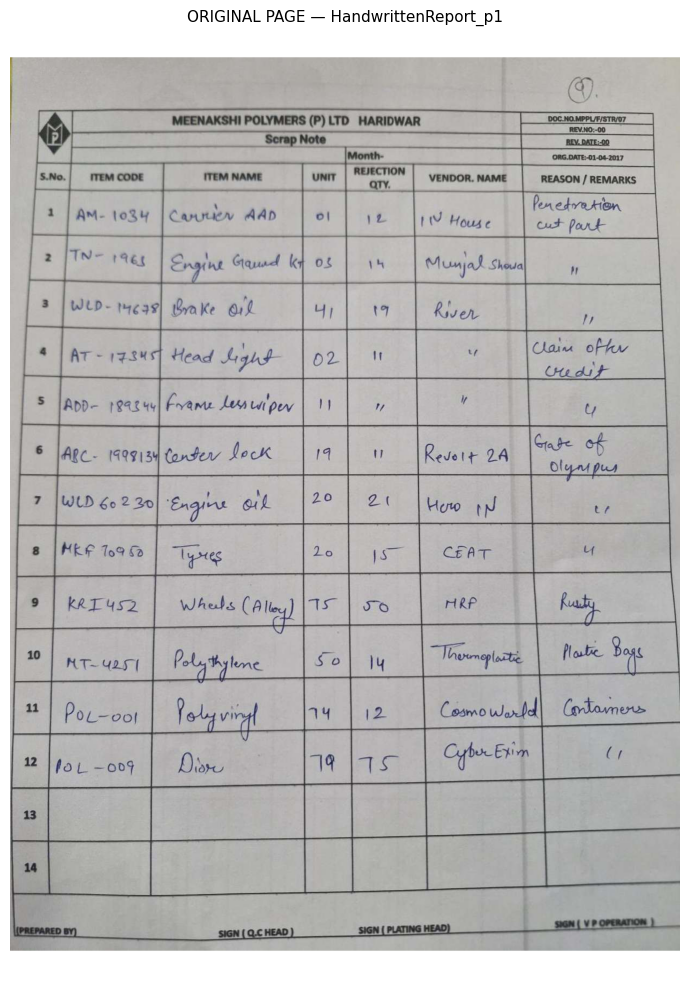

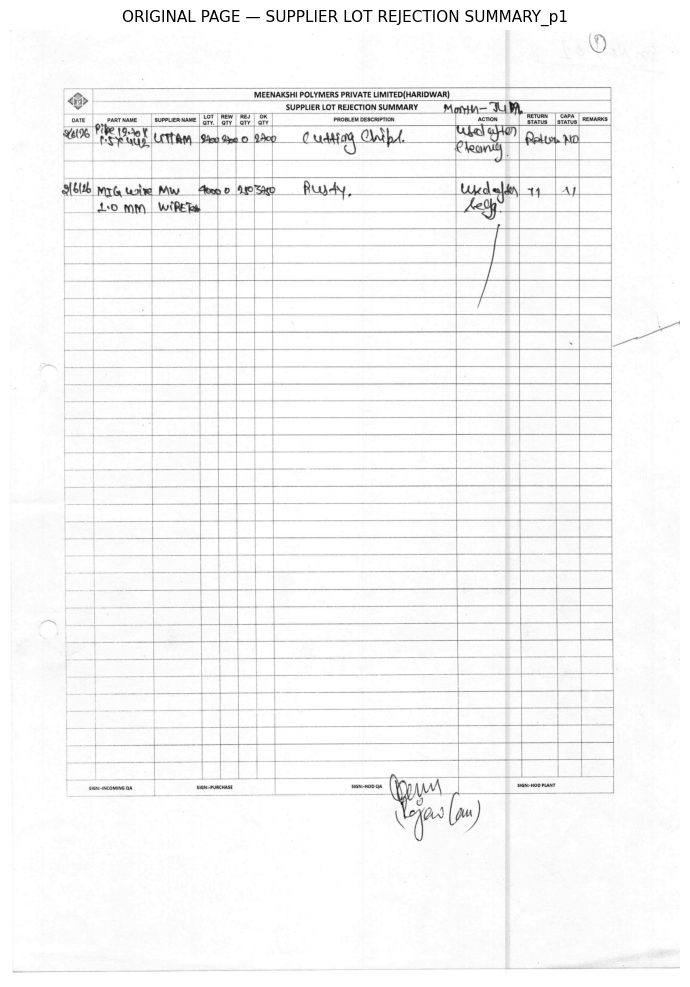

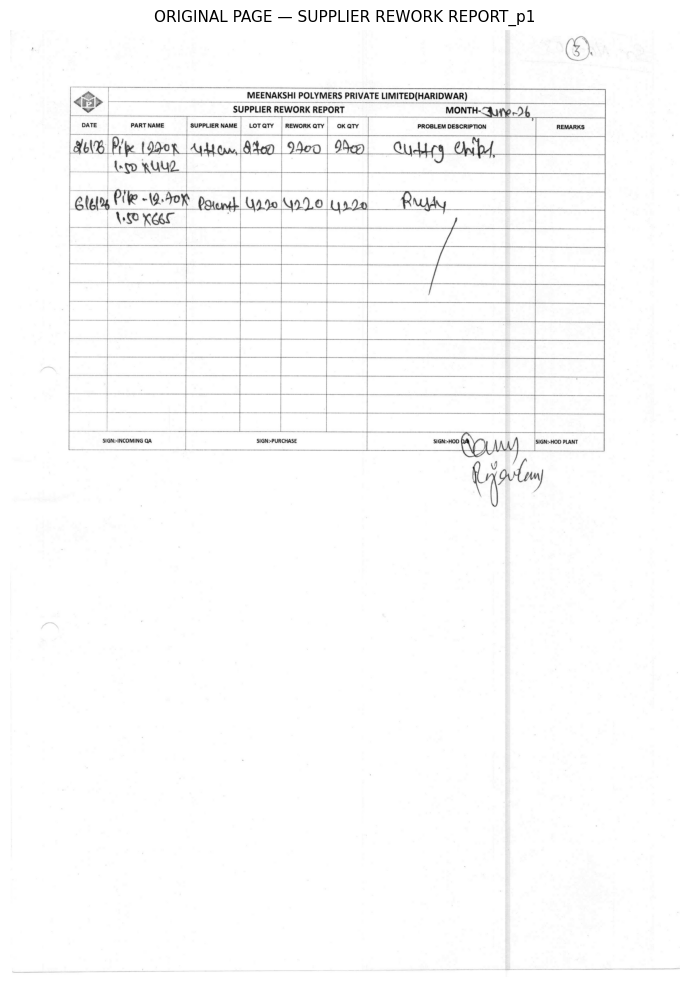

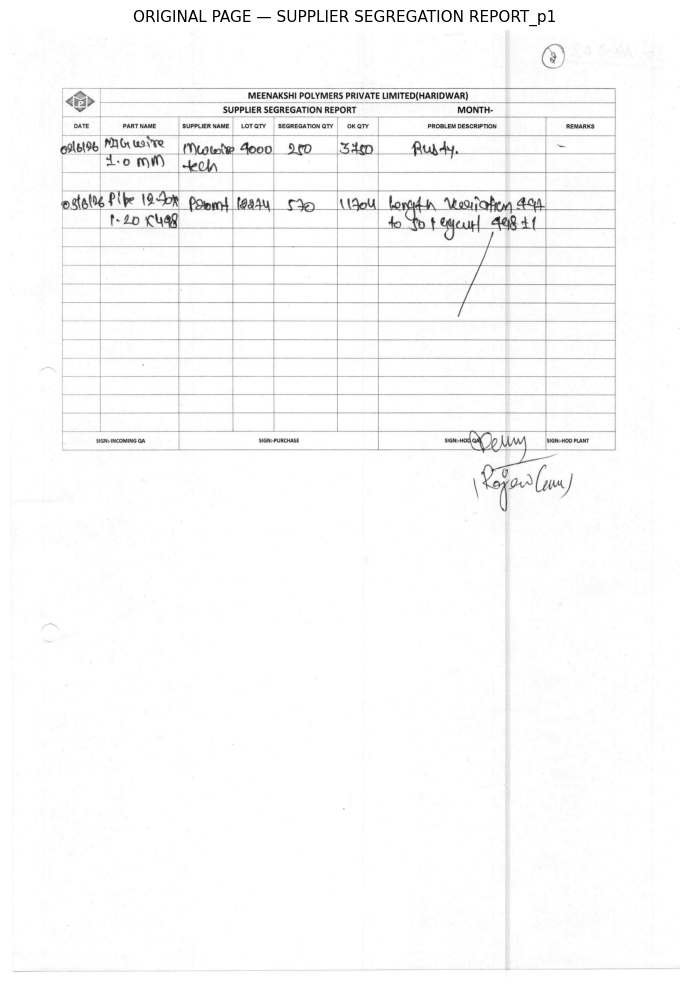

In [ ]:
# ============================================================================
# STAGE 5 — PDF / IMAGE  ->  300 DPI IMAGES
# PDFs  : PyMuPDF rasterises each page at exactly DPI dots-per-inch (page size in points / 72 * DPI).
#         pdf2image (poppler) is kept as a fallback backend.
# Images: jpg / png / tif / bmp / webp. Phone rotation (EXIF orientation) is applied, every frame of a multi-page
#         TIFF becomes a page, and the image is scaled to DPI: by its own DPI tag when that is believable (150-1200,
#         i.e. scanner output), otherwise by taking its short side as A4's 8.27 in (IMAGE_PAGE_SHORT_IN).
# Either way the detail actually present in the source is estimated, and a page below MIN_SOURCE_DPI is flagged -
# a 150 DPI phone photo rendered at 300 DPI is still a 150 DPI photo.
# ============================================================================
try:
    import pymupdf
except ImportError:                       # older PyMuPDF releases expose the module as "fitz"
    import fitz as pymupdf


@dataclass
class Page:
    """Everything we learn about one page (of a PDF or an image file), filled in stage by stage."""
    pdf: str                              # source file name (PDF or image)
    page_no: int                          # 1-based page number
    uid: str                              # unique id used for debug folders, e.g. "WELD SHOP REJECTION REPORT_p1"
    template_key: str
    template: dict
    original: np.ndarray                  # BGR page image at DPI (untouched)
    src_dpi: Optional[float] = None       # resolution the source really held (None = vector PDF page); below
                                          # PHOTO_MAX_DPI the page is treated as a photo by Stage 6
    dewarped: bool = False                # True when Stage 6 corrected perspective (photos)
    angle: float = 0.0                    # deskew rotation applied (degrees)
    aligned: Optional[np.ndarray] = None  # BGR, deskewed
    flat: Optional[np.ndarray] = None     # gray, denoised + illumination-flattened + deskewed (no CLAHE)
    gray: Optional[np.ndarray] = None     # gray, + CLAHE contrast — this is what the crops are cut from
    bw: Optional[np.ndarray] = None       # binary (ink = 255) used for grid detection
    hmask: Optional[np.ndarray] = None    # horizontal-line mask
    vmask: Optional[np.ndarray] = None    # vertical-line mask
    table_bbox: Optional[tuple] = None    # (x1, y1, x2, y2)
    detect: dict = field(default_factory=dict)   # raw detection results (rows, cols, thresholds ...)
    grid: dict = field(default_factory=dict)     # resolved grid: col_x, col_names, row_y ...
    records: list = field(default_factory=list)  # grouped records
    warnings: list = field(default_factory=list)
    result: dict = field(default_factory=dict)


def render_pdf(path, dpi=DPI):
    """Return [(BGR page image, source DPI or None)] for every page of a PDF.

    Source DPI is the resolution of the largest image embedded in the page (a scanned or photographed page is one
    big image); None for a vector PDF, or with the pdf2image backend.
    """
    if PDF_BACKEND == "pdf2image":
        if IN_COLAB:
            subprocess.run(["apt-get", "-qq", "install", "-y", "poppler-utils"], check=False)
        ensure("pdf2image")
        from pdf2image import convert_from_path
        return [(cv2.cvtColor(np.array(im.convert("RGB")), cv2.COLOR_RGB2BGR), None)
                for im in convert_from_path(path, dpi=dpi)]
    pages = []
    with pymupdf.open(path) as doc:
        for pg in doc:
            pix = pg.get_pixmap(dpi=dpi, colorspace=pymupdf.csRGB, alpha=False)
            arr = np.frombuffer(pix.samples, np.uint8).reshape(pix.height, pix.width, 3)
            src_dpi = None
            infos = [i for i in pg.get_image_info() if i["bbox"][2] - i["bbox"][0] > 0]
            if infos:
                big = max(infos, key=lambda i: i["width"] * i["height"])
                src_dpi = big["width"] / ((big["bbox"][2] - big["bbox"][0]) / 72.0)
            pages.append((cv2.cvtColor(arr, cv2.COLOR_RGB2BGR), src_dpi))
    return pages


def render_image(path, dpi=DPI):
    """Return [(BGR page image, source DPI)] for an image file - one entry per frame of a multi-page TIFF."""
    from PIL import ImageOps, ImageSequence
    pages = []
    with Image.open(path) as im:
        tag = im.info.get("dpi")
        tag = float(tag[0]) if isinstance(tag, tuple) and tag and tag[0] else None
        for frame in ImageSequence.Iterator(im):
            rgb = ImageOps.exif_transpose(frame).convert("RGB")    # phone photos store rotation as a flag
            w, h = rgb.size
            if tag and 150 <= tag <= 1200:                          # scanner output: its DPI tag is real
                src_dpi = tag
            else:                                                   # phone photo / screenshot: tag is 72 or 96 or absent
                src_dpi = min(w, h) / IMAGE_PAGE_SHORT_IN
            arr = cv2.cvtColor(np.array(rgb), cv2.COLOR_RGB2BGR)
            scale = dpi / src_dpi
            if abs(scale - 1.0) > 0.01:
                arr = cv2.resize(arr, None, fx=scale, fy=scale,
                                 interpolation=cv2.INTER_CUBIC if scale > 1 else cv2.INTER_AREA)
            pages.append((arr, src_dpi))
    return pages


def render_file(path, dpi=DPI):
    """PDF or image file -> [(BGR page image at `dpi`, source DPI or None)]."""
    return render_image(path, dpi) if path.lower().endswith(IMAGE_EXTS) else render_pdf(path, dpi)


PAGES = []
for path in PDF_PATHS:
    key = pick_template(path)
    if key is None and not AUTO_TEMPLATE:
        print(f"skip {os.path.basename(path)}: no template matches (add one in Stage 2)")
        continue
    stem = os.path.splitext(os.path.basename(path))[0]
    kind = "image" if path.lower().endswith(IMAGE_EXTS) else "PDF"
    for i, (img, src_dpi) in enumerate(render_file(path), start=1):
        page = Page(pdf=os.path.basename(path), page_no=i, uid=f"{stem}_p{i}", template_key=key,
                    template=TEMPLATES[key] if key else {}, original=img, src_dpi=src_dpi)
        PAGES.append(page)
        how = f"template: {key}" if key else "template: to be identified from the page (Stage 7b)"
        src = f"source ~{src_dpi:.0f} DPI" if src_dpi else "vector page"
        print(f"rendered {stem} p{i} ({kind}, {src}): {img.shape[1]}x{img.shape[0]} px @ {DPI} DPI  |  {how}")
        if src_dpi and src_dpi < MIN_SOURCE_DPI:
            msg = (f"low-resolution source (~{src_dpi:.0f} DPI < {MIN_SOURCE_DPI}): grid detection and OCR "
                   f"will be weaker - rescan at 300 DPI or use a scanning app")
            page.warnings.append(msg)
            print(f"   WARNING {msg}")

for pg in PAGES:
    if viewed(pg):
        show(pg.original, f"ORIGINAL PAGE — {pg.uid}", figsize=(7, 10))
        save_debug(pg, "01_original.jpg", pg.original)


HandwrittenReport_p1: rotated +0.08 deg, sheared +0.48 deg | denoise h=8 | photo, corrected 7.6% perspective


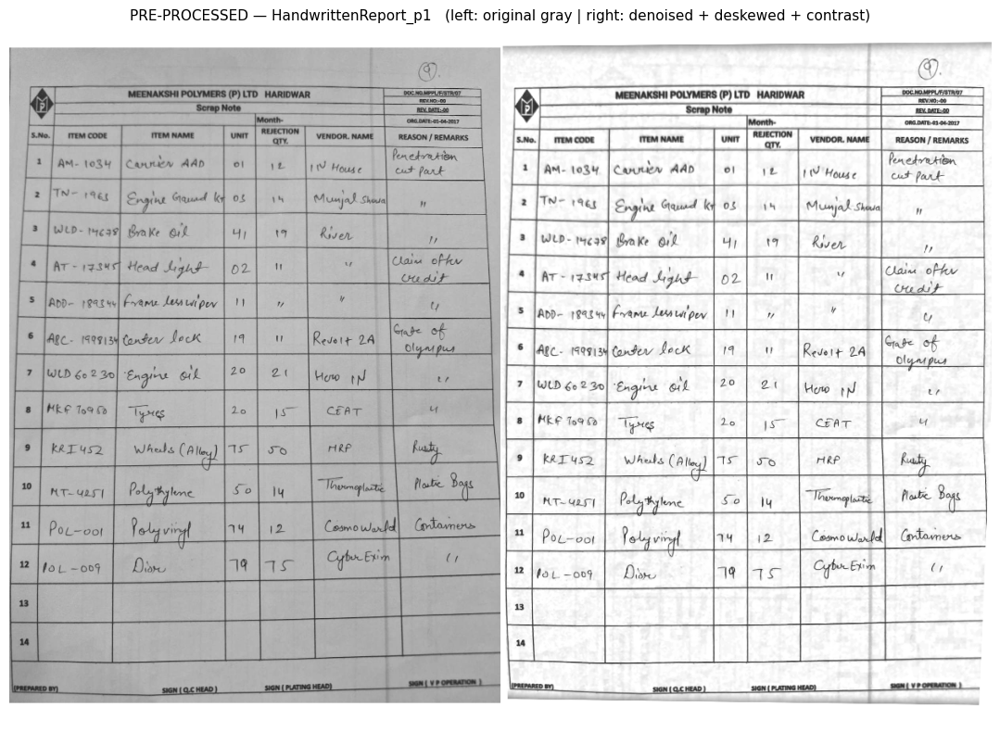

SUPPLIER LOT REJECTION SUMMARY_p1: rotated -0.17 deg, sheared +0.07 deg | denoise h=4 | scan


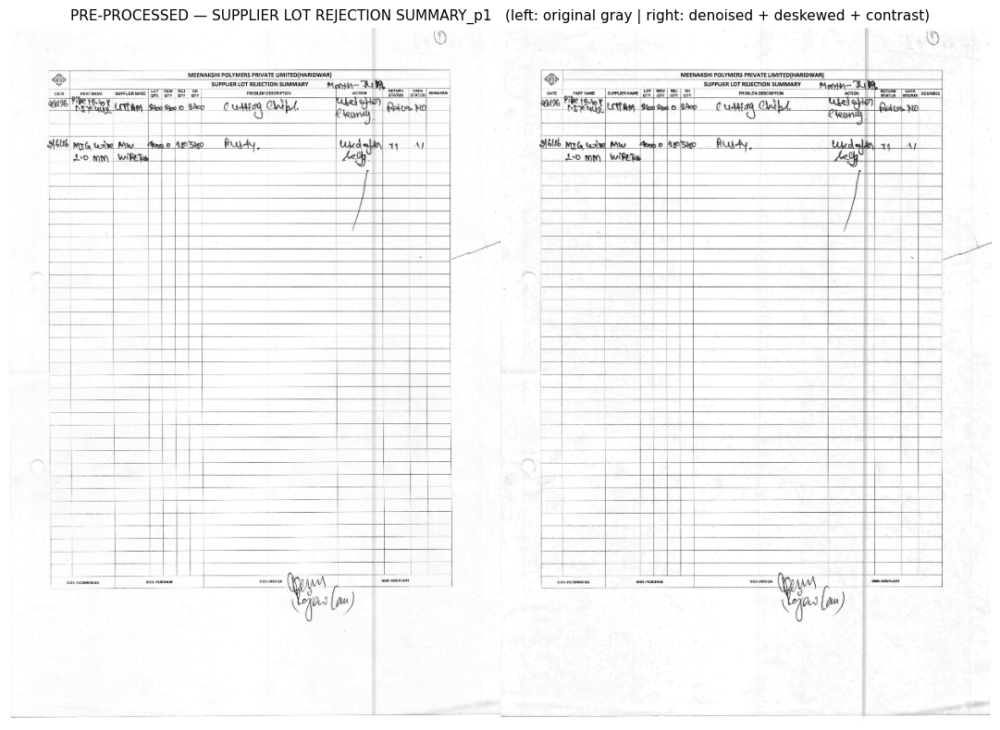

SUPPLIER REWORK REPORT_p1: rotated +0.20 deg, sheared +0.17 deg | denoise h=4 | scan


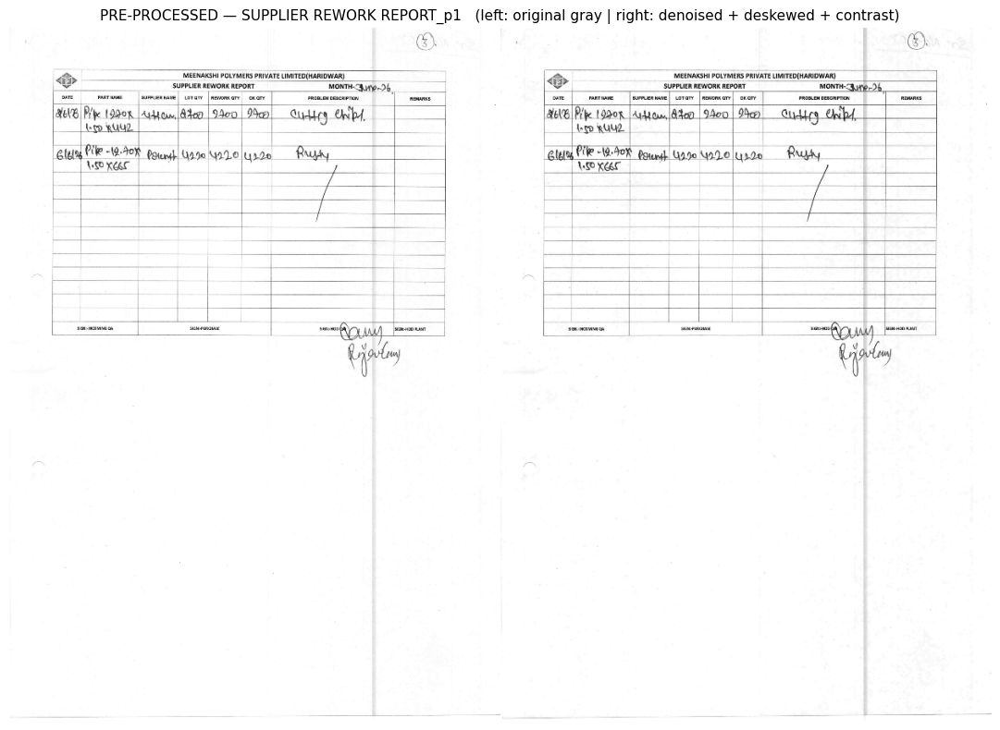

SUPPLIER SEGREGATION REPORT_p1: rotated -0.05 deg, sheared -0.08 deg | denoise h=4 | scan


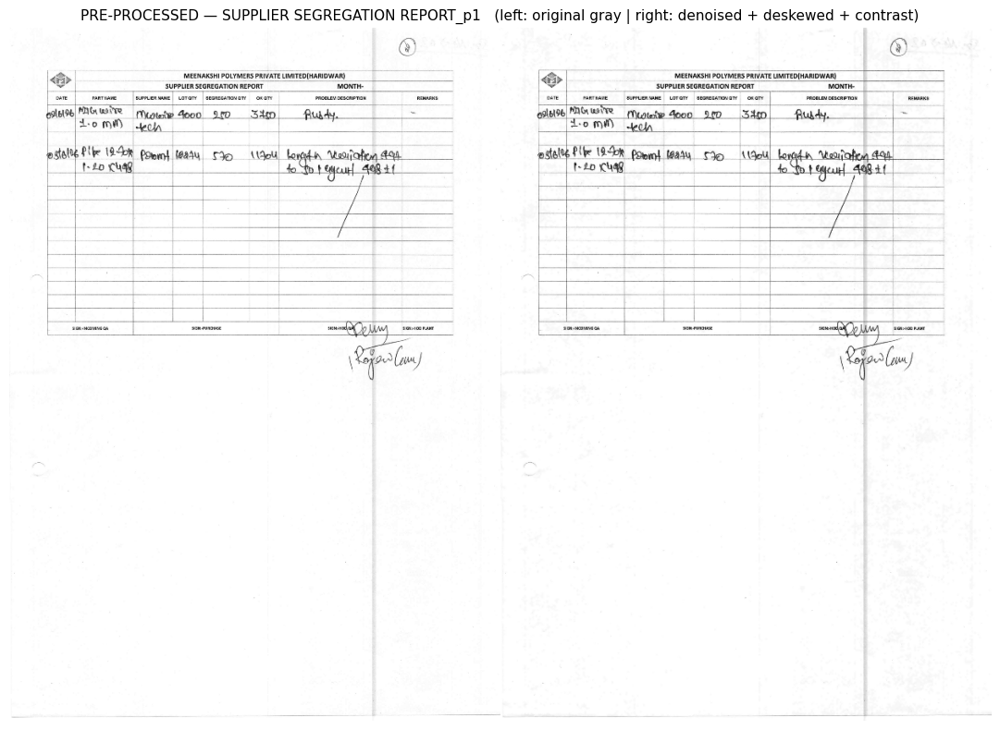

In [ ]:
# ============================================================================
# STAGE 6 — PRE-PROCESSING
#   1. ink channel        (INK_CHANNEL: per-pixel darkest of B/G/R, so coloured pen is as dark as it can be -
#                          luminance grey throws part of that away)
#   2. denoise            (fast non-local means - removes scanner speckle but keeps pen strokes; the strength is
#                          chosen per input class, because a scan needs far less of it than a phone photo)
#   3. flatten lighting   (divide by an estimate of the paper background -> even white page, no shadows/bands)
#   3b. DEWARP (photos)   (the table's four corners -> a rectangle. A page shot at an angle has CONVERGING column
#                          lines; the affine step below cannot fix that, only a homography can. Scans are left
#                          alone - the skew test in perspective_matrix() finds nothing to correct.)
#   4. deskew / de-shear  (rotation from the long horizontal lines + shear from the vertical lines, applied as ONE
#                          affine warp so scans of photocopied forms end up with truly level rows and upright columns)
#   5. contrast (CLAHE)   (local contrast enhancement so faint pen strokes become dark)
# 3b and 4 are composed into ONE matrix, so the page is still resampled only once.
# Grid detection uses `flat`; the crops that go to OCR are cut from `gray` (= flat + CLAHE).
# ============================================================================
def to_ink_channel(bgr):
    """The colour page as ONE channel, chosen so the ink is as dark as it can be (INK_CHANNEL, Stage 1).

    Blue ballpoint absorbs green and red and reflects blue, so in the BLUE channel it is barely darker than the
    paper. Luminance (cvtColor) is 0.587 green and therefore already most of the way there, but the per-pixel
    minimum takes the best channel for EVERY pixel - blue pen, red corrections and black print at once - without
    having to know which pen was used. Slightly coloured paper comes out darker overall, which does not matter:
    flatten_illumination() renormalises the background on the very next line.
    """
    if bgr.ndim == 2:
        return bgr
    if INK_CHANNEL == "min":
        return bgr.min(axis=2)
    if INK_CHANNEL in ("b", "g", "r"):
        return bgr[:, :, "bgr".index(INK_CHANNEL)]
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)


def flatten_illumination(gray):
    """Divide by the paper background. The background is estimated on a 1/4-size copy (fast) with a
    morphological closing that erases thin dark things (pen strokes, printed lines) and keeps the paper."""
    small = cv2.resize(gray, None, fx=0.25, fy=0.25, interpolation=cv2.INTER_AREA)
    bg = cv2.morphologyEx(small, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15)))
    bg = cv2.GaussianBlur(bg, (0, 0), 6)
    bg = cv2.resize(bg, (gray.shape[1], gray.shape[0]), interpolation=cv2.INTER_LINEAR)
    return cv2.divide(gray, np.maximum(bg, 1), scale=255)


def line_masks(gray, dpi=DPI):
    """Binary ink image + masks of long horizontal / vertical strokes (the printed grid)."""
    bw = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 35, 15)
    k = int(LINE_KERNEL_IN * dpi)                       # a printed line is much longer than any pen stroke
    h = cv2.morphologyEx(bw, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (k, 1)))
    v = cv2.morphologyEx(bw, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, k)))
    return bw, h, v


def _rot_matrix(angle, w, h):
    """3x3 rotation about the page centre; positive angle = counter-clockwise."""
    return np.vstack([cv2.getRotationMatrix2D((w / 2, h / 2), angle, 1.0), [0, 0, 1]])


def _shear_matrix(tilt, w, h):
    """3x3 horizontal shear about the middle row: x' = x - tan(tilt) * (y - h/2). Straightens verticals that lean right by `tilt`."""
    t = math.tan(math.radians(tilt))
    return np.array([[1, -t, t * h / 2], [0, 1, 0], [0, 0, 1.0]])


def _sharpness(mask, M, axis):
    """Sum of squared projection: largest when all line pixels stack into a few sharp peaks (= perfectly straight lines)."""
    h, w = mask.shape
    p = cv2.warpAffine(mask, M[:2], (w, h), flags=cv2.INTER_NEAREST).sum(axis=axis).astype(np.float64)
    return float((p * p).sum())


def _maximise(fn, lo, hi):
    """Coarse-to-fine 1-D search for the angle that maximises fn."""
    best = 0.0
    for step in (0.2, 0.05, 0.01):
        best = max(np.arange(lo, hi + 1e-9, step), key=fn)
        lo, hi = best - step, best + step
    return float(best)


def align_matrix(flat0):
    """Affine transform that levels the printed rows (rotation) and makes the printed columns upright (shear).
    Both angles are found by projection-profile search on a half-size line mask: the right angle is the one where
    the row (or column) profile is sharpest. Returns (3x3 matrix, rotation deg, shear deg)."""
    small = cv2.resize(flat0, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
    h, w = small.shape
    bw = cv2.adaptiveThreshold(small, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 25, 8)
    hm = cv2.morphologyEx(bw, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (40, 1)))
    vm = cv2.morphologyEx(bw, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, 20)))
    rot = _maximise(lambda a: _sharpness(hm, _rot_matrix(a, w, h), axis=1), -MAX_DESKEW_DEG, MAX_DESKEW_DEG)
    R = _rot_matrix(rot, w, h)
    shear = _maximise(lambda t: _sharpness(vm, _shear_matrix(t, w, h) @ R, axis=0), -1.0, 1.0)
    H, W = flat0.shape
    return _shear_matrix(shear, W, H) @ _rot_matrix(rot, W, H), rot, shear


def is_photo(page):
    """True for input that was photographed rather than scanned (Stage 5 measured the source resolution)."""
    return page.src_dpi is not None and page.src_dpi < PHOTO_MAX_DPI


def table_quad(flat0):
    """The four corners of the printed table, ordered TL, TR, BR, BL - or None if they cannot be trusted.

    Deliberately does NOT use line_masks(): its opening kernels are axis-aligned and `LINE_KERNEL_IN * DPI` long
    (120 px at 300 DPI), so a line tilted by a few degrees falls straight out of them - measured on a 7-degree
    test page, the vertical mask lost 69% of its pixels. That is the whole reason the grid detector fails on
    photos, so using it to FIND the perspective would be circular.

    Orientation-free instead: the printed rules cross each other, so on a binarised page the whole table is ONE
    connected component whatever angle it sits at. Take the component covering the largest area of the page, hull
    it, and reduce the hull to a quadrilateral.
    """
    bw = cv2.adaptiveThreshold(flat0, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 35, 15)
    grid = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))   # bridge gaps in a faint rule
    n, lab, stats, _ = cv2.connectedComponentsWithStats(grid)
    if n < 2:
        return None
    # by the area its BOUNDING BOX covers, not by pixel count: the table is made of thin lines, so it is never the
    # heaviest component, but it is always the widest-reaching one
    boxes = stats[1:, cv2.CC_STAT_WIDTH].astype(np.int64) * stats[1:, cv2.CC_STAT_HEIGHT]
    k = 1 + int(np.argmax(boxes))
    if boxes[k - 1] < DEWARP_MIN_AREA * flat0.size:
        return None
    hull = cv2.convexHull(cv2.findNonZero((lab == k).astype(np.uint8)))
    peri = cv2.arcLength(hull, True)
    quad = None
    for eps in (0.01, 0.02, 0.03, 0.04, 0.06):          # loosen until the hull reduces to 4 corners
        approx = cv2.approxPolyDP(hull, eps * peri, True)
        if len(approx) == 4:
            quad = approx
            break
        if len(approx) < 4:
            break                                        # already too coarse; looser will not bring it back
    if quad is None:
        return None                                      # not a clean quadrilateral - do not guess
    q = quad.reshape(4, 2).astype(np.float32)
    s, d = q.sum(axis=1), q[:, 1] - q[:, 0]              # TL has the smallest x+y, BR the largest; TR smallest y-x
    return np.array([q[np.argmin(s)], q[np.argmin(d)], q[np.argmax(s)], q[np.argmax(d)]], np.float32)


def perspective_matrix(flat0):
    """(3x3 homography, why) mapping the table's quadrilateral onto an upright rectangle; (None, why) when there
    is nothing to correct or the corners are not believable.

    The target rectangle keeps the table's centre and its MEAN edge lengths, so the page lands where it already
    was and nothing is pushed out of frame.
    """
    q = table_quad(flat0)
    if q is None:
        return None, "table corners not found"
    widths = [float(np.linalg.norm(q[1] - q[0])), float(np.linalg.norm(q[2] - q[3]))]
    heights = [float(np.linalg.norm(q[3] - q[0])), float(np.linalg.norm(q[2] - q[1]))]
    if min(widths) <= 1 or min(heights) <= 1:
        return None, "degenerate quadrilateral"
    skew = max(abs(widths[0] - widths[1]) / max(widths), abs(heights[0] - heights[1]) / max(heights))
    if skew < DEWARP_MIN_SKEW:
        return None, f"no perspective to correct (opposite edges differ by {skew:.1%})"
    if skew > DEWARP_MAX_SKEW:
        return None, f"quadrilateral too distorted to trust ({skew:.1%}) - check 04_rows_columns.png"
    W, H = float(np.mean(widths)), float(np.mean(heights))
    cx, cy = float(q[:, 0].mean()), float(q[:, 1].mean())
    x1, y1 = cx - W / 2, cy - H / 2
    dst = np.array([[x1, y1], [x1 + W, y1], [x1 + W, y1 + H], [x1, y1 + H]], np.float32)
    return cv2.getPerspectiveTransform(q, dst), f"corrected {skew:.1%} perspective"


def warp(img, M, border):
    """Apply a 3x3 transform. An affine matrix keeps the cheaper warpAffine path; a homography (last row not
    [0, 0, 1]) needs warpPerspective."""
    h, w = img.shape[:2]
    if abs(M[2, 0]) > 1e-12 or abs(M[2, 1]) > 1e-12 or abs(M[2, 2] - 1.0) > 1e-9:
        return cv2.warpPerspective(img, M, (w, h), flags=cv2.INTER_CUBIC,
                                   borderMode=cv2.BORDER_CONSTANT, borderValue=border)
    return cv2.warpAffine(img, M[:2], (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_CONSTANT, borderValue=border)


def preprocess(page):
    photo = is_photo(page)
    ink0 = to_ink_channel(page.original)                                              # 1. ink channel
    h_den = DENOISE_H_PHOTO if photo else DENOISE_H                                   # 2. denoise, per input class
    den = cv2.fastNlMeansDenoising(ink0, None, h=h_den, templateWindowSize=5, searchWindowSize=11)
    flat0 = flatten_illumination(den)                                                 # 3. even lighting

    P, why = (perspective_matrix(flat0) if (PHOTO_DEWARP and photo) else (None, "scan - not a photo"))
    if P is not None:                                                                 # 3b. dewarp (photos only)
        flat0 = warp(flat0, P, 255)
        page.dewarped = True
    elif photo:
        page.warnings.append(f"perspective not corrected: {why}")

    A, rot, shear = align_matrix(flat0)                                               # 4. deskew + de-shear
    M = A if P is None else A @ P                                                     # ... one resampling for both
    flat = warp(flat0, A, 255)                                                        # flat0 is already dewarped
    page.aligned = warp(page.original, M, (255, 255, 255))
    page.angle = rot
    page.flat = flat
    page.gray = cv2.createCLAHE(clipLimit=CLAHE_CLIP,
                                tileGridSize=(CLAHE_TILES, CLAHE_TILES)).apply(flat)  # 5. contrast
    page.bw, page.hmask, page.vmask = line_masks(flat)
    how = f"photo, {why}" if photo else "scan"
    print(f"{page.uid}: rotated {rot:+.2f} deg, sheared {shear:+.2f} deg | denoise h={h_den} | {how}")


for pg in PAGES:
    t0 = time.time()
    preprocess(pg)
    if viewed(pg):
        show(np.hstack([cv2.resize(cv2.cvtColor(cv2.cvtColor(pg.original, cv2.COLOR_BGR2GRAY), cv2.COLOR_GRAY2BGR), None, fx=0.25, fy=0.25),
                        cv2.resize(to_bgr(pg.gray), None, fx=0.25, fy=0.25)]),
             f"PRE-PROCESSED — {pg.uid}   (left: original gray | right: denoised + deskewed + contrast)", figsize=(12, 8))
        save_debug(pg, "02_preprocessed.png", pg.gray)


HandwrittenReport_p1: table bbox = (22, 286, 2460, 3236)


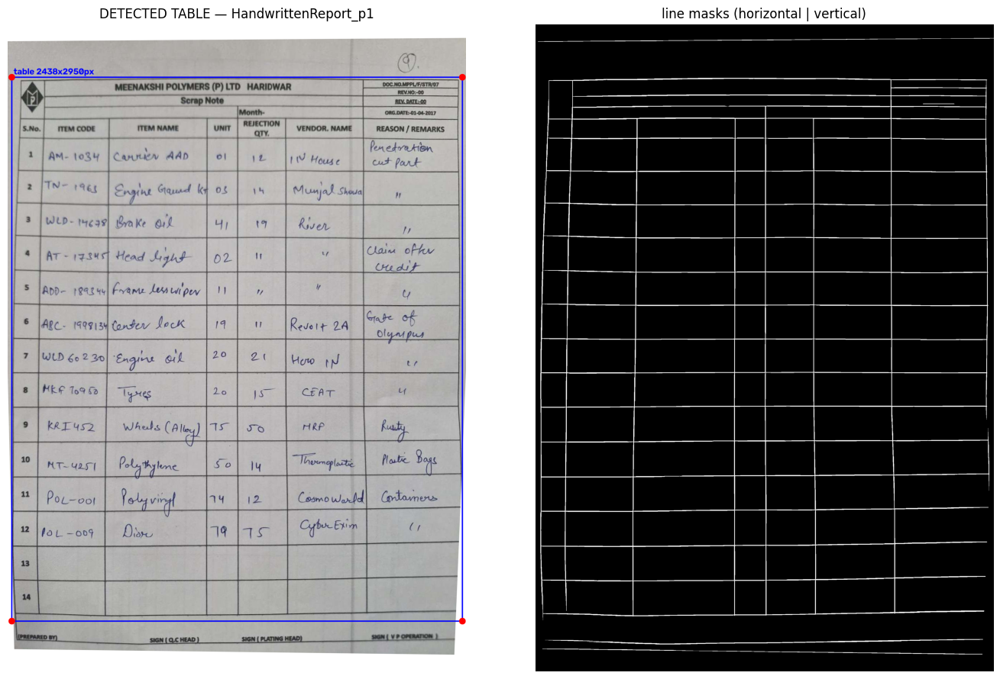

SUPPLIER LOT REJECTION SUMMARY_p1: table bbox = (198, 210, 2237, 2839)


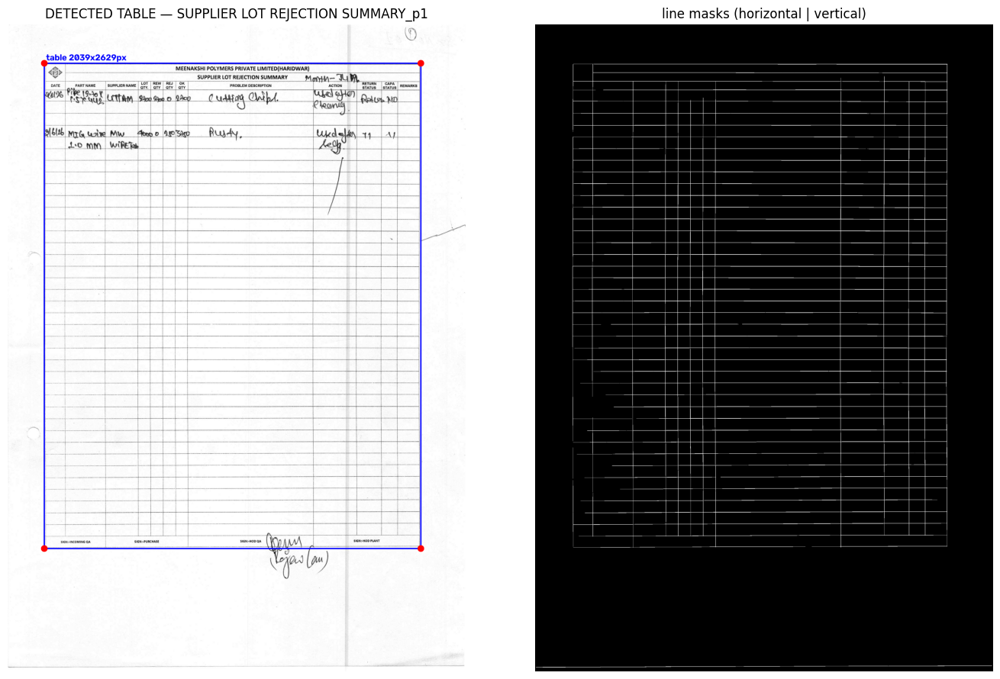

SUPPLIER REWORK REPORT_p1: table bbox = (213, 210, 2210, 1564)


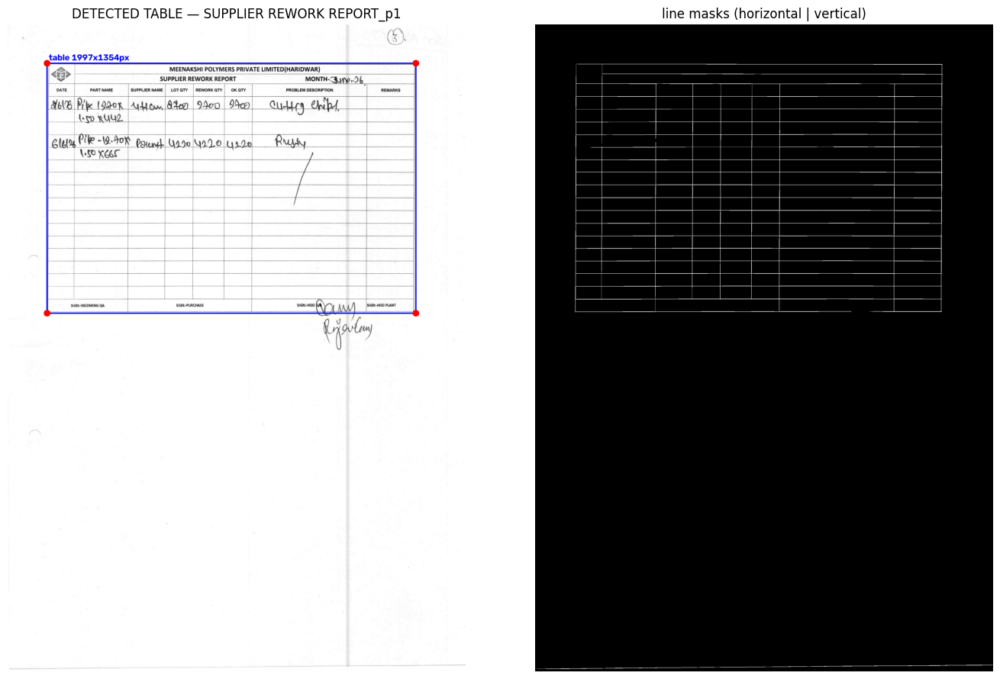

SUPPLIER SEGREGATION REPORT_p1: table bbox = (188, 210, 2246, 1562)


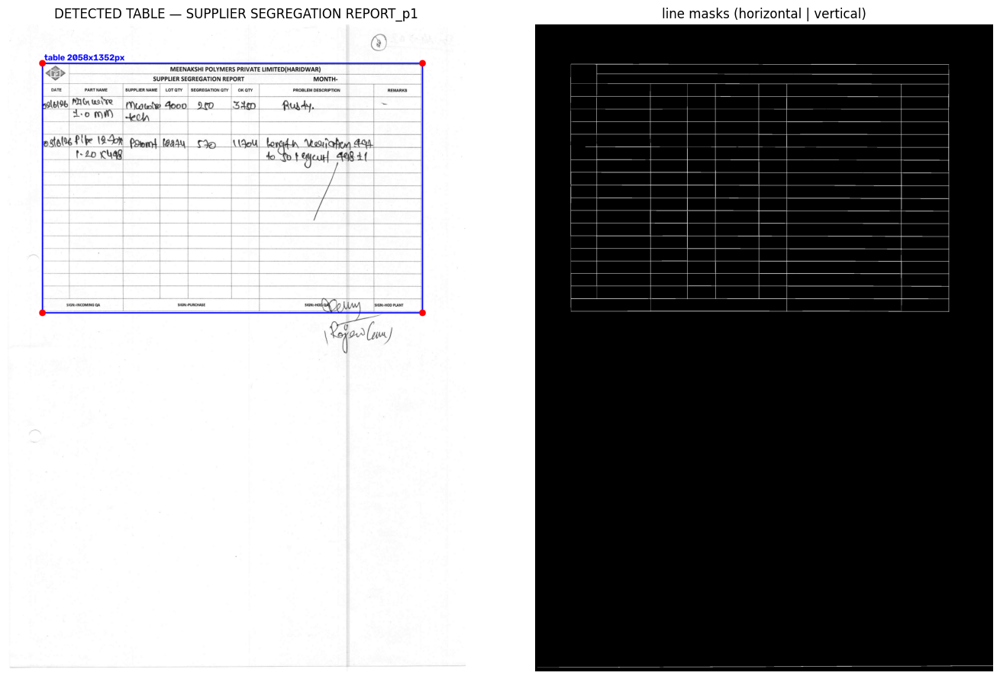

In [ ]:
# ============================================================================
# STAGE 7 — TABLE DETECTION / ALIGNMENT
# The printed grid lines (horizontal | vertical masks from Stage 6) are merged; the biggest connected blob is the
# table. Its bounding box gives the table's left/top/right/bottom. (The page is already rotation-aligned by Stage 6.)
# ============================================================================
def detect_table(page):
    grid_mask = cv2.dilate(cv2.bitwise_or(page.hmask, page.vmask), np.ones((9, 9), np.uint8))
    n, _, stats, _ = cv2.connectedComponentsWithStats(grid_mask)
    if n < 2:
        raise RuntimeError("no table-like structure found")
    k = 1 + int(np.argmax(stats[1:, cv2.CC_STAT_AREA]))
    x, y, w, h = stats[k, :4]
    return (int(x), int(y), int(x + w), int(y + h))


def draw_table(page):
    vis = page.aligned.copy()
    x1, y1, x2, y2 = page.table_bbox
    cv2.rectangle(vis, (x1, y1), (x2, y2), (255, 0, 0), 6)
    for (cx, cy) in [(x1, y1), (x2, y1), (x1, y2), (x2, y2)]:
        cv2.circle(vis, (cx, cy), 18, (0, 0, 255), -1)
    cv2.putText(vis, f"table {x2-x1}x{y2-y1}px", (x1 + 10, max(40, y1 - 15)), cv2.FONT_HERSHEY_SIMPLEX, 1.6, (255, 0, 0), 4)
    return vis


# (used by Stage 7b to find the heading block and by Stage 8 for the data rows)
def row_line_positions(page, x1, x2, y1, y2, n_chunks=16, pct=35, min_cover=0.20):
    """y-positions of the printed horizontal lines between y1 and y2. Two independent signals must agree:
      (a) morphological : fraction of the table width covered by the long-horizontal-run mask (>= min_cover). Text rows
                          are ~0, good lines ~0.6, faint scanned lines still ~0.3.
      (b) darkness      : (255 - flattened gray) of the table width, split into n_chunks slabs; the pct-th percentile
                          ACROSS slabs is high only where a stroke crosses most of the width (a printed line), so
                          handwriting confined to a few cells and header text do not qualify.
    Requiring both is robust to faint / slightly curved lines (a) and to bold header text (b)."""
    y1, y2 = max(y1, 0), min(y2, page.flat.shape[0])
    band = page.hmask[y1:y2, x1:x2] > 0
    cover = band.sum(1) / band.shape[1]
    cover = np.maximum.reduce([np.roll(cover, s) for s in (-2, -1, 0, 1, 2)])          # tolerate 1-2 px of line drift
    reg = 255.0 - page.flat[y1:y2, x1:x2].astype(np.float32)
    dark = np.percentile(np.stack([c.mean(axis=1) for c in np.array_split(reg, n_chunks, axis=1)]), pct, axis=0)
    dark = np.convolve(dark, np.ones(3) / 3, mode="same")
    dark = np.maximum.reduce([np.roll(dark, s) for s in (-2, -1, 0, 1, 2)])
    lines = [p for p in group_peaks(cover, min_cover, min_gap=6) if dark[int(round(p))] >= 10.0]
    return [p + y1 for p in lines], min_cover


for pg in PAGES:
    try:
        pg.table_bbox = detect_table(pg)
    except Exception as e:
        pg.warnings.append(f"table detection failed: {e}")
        print(f"{pg.uid}: TABLE NOT FOUND — {e}")
        continue
    print(f"{pg.uid}: table bbox = {pg.table_bbox}")
    vis = draw_table(pg)
    save_debug(pg, "03_table_detected.png", vis)
    save_debug(pg, "03b_line_masks.png", cv2.bitwise_or(pg.hmask, pg.vmask))
    if viewed(pg) and SHOW_DEBUG:
        fig, ax = plt.subplots(1, 2, figsize=(14, 9))
        ax[0].imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)); ax[0].set_title(f"DETECTED TABLE — {pg.uid}")
        ax[1].imshow(cv2.bitwise_or(pg.hmask, pg.vmask), cmap="gray"); ax[1].set_title("line masks (horizontal | vertical)")
        for a in ax: a.axis("off")
        plt.tight_layout(); plt.show()

In [ ]:
# ============================================================================
# STAGE 7b — IDENTIFY THE FORM FROM ITS PRINTED HEADING  (every page; the file name is only a fallback)
# The file name is a poor key: "HandwrittenReport.pdf" / "riteshTest.pdf" say nothing, and a wrongly named file
# silently gets the wrong columns. The heading PRINTED on the form is reliable, and GOT reads printed text well.
#
#   1. FIND THE HEADING by the grid's structure, not by a fixed fraction of the page. Going down the table's
#      horizontal lines, the column-name row is the first band crossed by many vertical lines (one per column);
#      the title rows above it are crossed only by the logo / doc-no box borders. The heading crop runs from a little
#      above the table (some titles sit just outside the grid) down to the bottom of that column-name row.
#   2. READ it with GOT in one call (padded to a square, so GOT's square resize does not stretch the text).
#   3. SCORE every template: 5 per printed `title` phrase found, 1 per column name found, 3 if the number of
#      vertical lines in the column-name row fits the template. Matching is fuzzy and ignores spaces, so OCR slips
#      ("Scrap Nate", "WELD SHOP" vs "WELDSHOP") still count.
#   4. DECIDE: the best template wins when at least one of its title phrases was found and it beats the runner-up.
#      If no title matched at all, the titles get one looser second look (accepted only when it singles out one
#      template that also leads on the column names). Otherwise the file-name template (Stage 2 `match` / TEMPLATE_BY_FILE) is used; failing that the page keeps
#      template = {} and Stage 8 skips it with a warning, rather than forcing it into the wrong form.
# TEMPLATE_BY_FILE always wins - it is the manual override.
# ============================================================================
import difflib

HEADING_ABOVE_FRAC = 0.04     # fraction of the page height searched ABOVE the table for a title printed outside it
HEADING_MIN_COLS   = 5        # a band crossed by at least this many vertical lines is the column-name row
HEADING_FUZZY      = 0.85     # difflib ratio at which a printed phrase counts as found despite OCR slips
HEADING_FUZZY_LOOSE = 0.75    # second chance for the TITLE only, when nothing matched strictly (see identify_template)


def ensure_got():
    """Load GOT-OCR-2.0 once, into module globals. Safe to call again - Stage 14 calls it too."""
    global got_processor, got_model, device
    if "got_model" in globals() and got_model is not None:
        return
    import torch as _torch
    from transformers import AutoProcessor, AutoModelForImageTextToText
    globals()["torch"] = _torch
    device = "cuda" if _torch.cuda.is_available() else "cpu"
    if device == "cpu":
        print("WARNING: no GPU — GOT-OCR-2.0 will be slow on CPU.")
    print("Loading GOT-OCR-2.0 ...")
    got_processor = load_pretrained(AutoProcessor, GOT_MODEL_ID)
    kw = dict(device_map="auto", dtype=_torch.float16 if device == "cuda" else _torch.float32)
    # ATTENTION BACKEND - the single biggest lever on GPU memory here. GOT's vision tower is a SAM-style ViT over
    # a 1024x1024 input: 64x64 = 4096 patch tokens, and its global-attention blocks score every token against
    # every other one. Materialised ("eager"), that one matrix is 12 heads x 4096 x 4096 x 2 bytes = 384 MiB PER
    # IMAGE, which is what made a batch of 16 impossible on a 15 GB GPU. SDPA computes the same result without
    # ever holding the matrix, so ask for it and fall back only if this transformers / torch build refuses.
    try:
        got_model = AutoModelForImageTextToText.from_pretrained(GOT_MODEL_ID, attn_implementation="sdpa", **kw)
        attn = "sdpa"
    except (ValueError, ImportError, RuntimeError) as e:
        print(f"SDPA attention unavailable ({type(e).__name__}: {str(e).splitlines()[0]}); using eager - "
              "~384 MiB of attention per image, so the batch will be sized right down.")
        got_model = AutoModelForImageTextToText.from_pretrained(GOT_MODEL_ID, **kw)
        attn = "eager"
    got_model.eval()
    globals()["GOT_ATTN"] = getattr(got_model.config, "_attn_implementation", attn) or attn
    print(f"GOT-OCR-2.0 loaded on {device} | attention: {GOT_ATTN}")


def got_generate(img, max_new_tokens, no_repeat_ngram=0):
    """Run GOT on one grayscale image -> (text, mean per-token probability). The one place generate() is called."""
    ensure_got()
    image = Image.fromarray(img).convert("RGB")
    inputs = got_processor(image, return_tensors="pt")
    inputs = {k: v.to(got_model.device) if hasattr(v, "to") else v for k, v in inputs.items()}
    with torch.inference_mode():
        out = got_model.generate(**inputs, do_sample=False, tokenizer=got_processor.tokenizer,
                                 stop_strings="<|im_end|>", max_new_tokens=max_new_tokens,
                                 no_repeat_ngram_size=no_repeat_ngram or 0,
                                 output_scores=True, return_dict_in_generate=True)
    new_ids = out.sequences[0][inputs["input_ids"].shape[1]:]
    text = got_processor.decode(new_ids, skip_special_tokens=True).strip()
    special = set(got_processor.tokenizer.all_special_ids)
    probs = [torch.softmax(step[0], dim=-1)[t].item() for step, t in zip(out.scores, new_ids)
             if t.item() not in special]
    return text, (float(np.mean(probs)) if probs else None)


def split_heading(page):
    """(y of the heading's bottom, number of vertical lines in the grid), from the grid alone.

    Counts the vertical lines crossing every band between the horizontal lines in the top part of the table. The
    data rows below the heading are crossed by all of them; so is the column-name row, which is therefore the FIRST
    band reaching that full count (one line of slack: a header cell can hide one). Rows above it - the title, the
    MONTH row - are crossed by only a few, e.g. 4 and 6 of the 8 on the line-rejection forms.
    (None, None) if the grid has no band with HEADING_MIN_COLS or more lines.
    """
    x1, y1, x2, y2 = page.table_bbox
    lines, _ = row_line_positions(page, x1 + 20, x2 - 20, max(y1 - 10, 0), y1 + int(0.35 * (y2 - y1)))
    bands = []
    for a, b in zip(lines, lines[1:]):
        if b - a < 25:                                      # a double rule, not a row
            continue
        band = page.vmask[int(a) + 6: int(b) - 6, x1:x2] > 0
        bands.append((b, len(group_peaks(band.mean(axis=0), 0.7))))
    full = max((n for _, n in bands), default=0)
    if full < HEADING_MIN_COLS:
        return None, None
    bottom = next(b for b, n in bands if n >= full - 1)
    return int(round(bottom)), full


def heading_crop(page):
    """(gray image of the heading block, vertical lines in the column-name row or None)."""
    H = page.gray.shape[0]
    x1, y1, x2, y2 = page.table_bbox
    bottom, n_lines = split_heading(page)
    if bottom is None:                                      # no column-name row found: the old fixed-fraction band
        bottom = min(y1 + int(0.22 * (y2 - y1)), y2)
    top = max(y1 - int(HEADING_ABOVE_FRAC * H), 0)
    return page.gray[top: bottom + 4, x1:x2], n_lines


def pad_square(gray):
    """White-pad to a square. GOT resizes every input to a fixed square, which would stretch a wide, short heading
    band many times over vertically; padded, it is only scaled - like the full pages GOT was trained on."""
    h, w = gray.shape[:2]
    side = max(h, w)
    top, left = (side - h) // 2, (side - w) // 2
    return cv2.copyMakeBorder(gray, top, side - h - top, left, side - w - left, cv2.BORDER_CONSTANT, value=255)


def read_form_heading(page):
    """(printed heading text, vertical lines in its column-name row)."""
    band, n_lines = heading_crop(page)
    if band.size == 0:
        return "", n_lines
    if SAVE_DEBUG:
        save_debug(page, "03c_heading.png", band)
    text, _ = got_generate(pad_square(band), 384)
    return text, n_lines


def _norm_words(s):
    return re.sub(r"\s+", " ", re.sub(r"[^A-Z0-9 ]+", " ", str(s).upper())).strip()


def _squash(s):
    """Upper-case letters and digits only: spacing and punctuation differ between print and OCR, the words do not."""
    return re.sub(r"[^A-Z0-9]+", "", str(s).upper())


def fuzzy_in(phrase, text, thr=HEADING_FUZZY):
    """True if `phrase` occurs in `text`, allowing a few OCR character slips (best sliding-window difflib ratio)."""
    p, t = _squash(phrase), _squash(text)
    if len(p) < 3 or not t:
        return False
    if p in t:
        return True
    if len(p) < 6:                                          # short names (PGC, UNIT): exact only, or they match noise
        return False
    k = len(p)
    return any(difflib.SequenceMatcher(None, p, t[i: i + k], autojunk=False).ratio() >= thr
               for i in range(max(1, len(t) - k + 1)))


def template_score(heading, template, n_lines=None):
    """(score, title phrases found) of one template against the heading text."""
    titles = sum(fuzzy_in(p, heading) for p in template.get("title", []))
    cols = sum(fuzzy_in(c, heading) for c in dict.fromkeys(template["columns"]))
    fits = n_lines is not None and n_lines == len(template["columns"]) + 1
    return 5 * titles + cols + 3 * fits, titles


def identify_template(page):
    """(template key, why). Key is None when neither the heading nor the file name identifies the form."""
    if page.pdf in TEMPLATE_BY_FILE:
        return TEMPLATE_BY_FILE[page.pdf], "TEMPLATE_BY_FILE override"
    heading, n_lines = read_form_heading(page)
    page.heading, page.heading_lines = heading, n_lines          # kept for inspection (Stage 8 resets page.detect)
    ranked = sorted(((*template_score(heading, t, n_lines), k) for k, t in TEMPLATES.items()), reverse=True)
    (best, titles, key), runner = ranked[0], (ranked[1][0] if len(ranked) > 1 else 0)
    short = re.sub(r"\s+", " ", heading)[:70]
    if titles and best > runner:
        return key, f"heading {short!r} -> score {best} vs next {runner}"
    if not titles:
        # No title phrase at the strict threshold - one more look, tolerating a worse OCR slip ("S rep Note" for
        # "Scrap Note"). Accepted only when exactly ONE template's title matches that loosely and that template is
        # also (jointly) the best on the column names, so a loose match can never overrule the rest of the heading.
        loose = [k for k, t in TEMPLATES.items()
                 if any(fuzzy_in(p, heading, HEADING_FUZZY_LOOSE) for p in t.get("title", []))]
        score_of = {k: s for s, _, k in ranked}
        if len(loose) == 1 and score_of[loose[0]] == best:
            return loose[0], f"heading {short!r} -> loose title match, score {best} vs next {runner} - worth a check"
    by_name = pick_template(page.pdf)
    if by_name:
        return by_name, f"heading inconclusive ({short!r}, best {best} vs {runner}); used the file name"
    return None, f"heading {short!r} matched no template (best {best} vs {runner}), file name neither"


for pg in PAGES:
    if pg.table_bbox is None:
        continue
    if not AUTO_TEMPLATE:                                   # file-name identification only (the pre-v4.21 behaviour)
        continue
    key, why = identify_template(pg)
    if key and pg.template_key and key != pg.template_key:
        print(f"{pg.uid}: NOTE the page says {key}, the file name says {pg.template_key} - using the page")
    if key:
        pg.template_key, pg.template = key, TEMPLATES[key]
        extra = "" if layout_of(pg.template) == "ledger" else f"  [{layout_of(pg.template)} layout: extraction not supported yet]"
        print(f"{pg.uid}: {key}  ({why}){extra}")
    else:
        pg.template_key, pg.template = None, {}
        pg.warnings.append(f"form not identified: {why}")
        print(f"{pg.uid}: COULD NOT IDENTIFY THE FORM ({why})\n"
              f"    -> add its printed title to a template in Stage 2, or pin it with TEMPLATE_BY_FILE[{pg.pdf!r}]")

Loading GOT-OCR-2.0 ...


preprocessor_config.json:   0%|          | 0.00/439 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/18.7M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/213 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/608 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.12G [00:00<?, ?B/s]

SDPA attention unavailable (ValueError: GotOcr2ForConditionalGeneration does not support an attention implementation through torch.nn.functional.scaled_dot_product_attention yet. Please request the support for this architecture: https://github.com/huggingface/transformers/issues/28005. If you believe this error is a bug, please open an issue in Transformers GitHub repository and load your model with the argument `attn_implementation="eager"` meanwhile. Example: `model = AutoModel.from_pretrained("openai/whisper-tiny", attn_implementation="eager")`); using eager - ~384 MiB of attention per image, so the batch will be sized right down.


generation_config.json:   0%|          | 0.00/74.0 [00:00<?, ?B/s]

GOT-OCR-2.0 loaded on cuda | attention: eager
HandwrittenReport_p1: scrap_note  (heading 'MEE NAK SHI POLYMERS( P) LTD HARI DWAR DOC: NO. MP PL/ F/ STR/ 07 REVS' -> score 15 vs next 9)
SUPPLIER LOT REJECTION SUMMARY_p1: supplier_lot_rejection_summary  (heading 'MEENAKSHI POLYMERS PRIVATE LIMITED(HARIDWAR) SUPPLIER LOT REJECTION SU' -> score 14 vs next 5)
SUPPLIER REWORK REPORT_p1: supplier_rework_report  (heading 'MEENAKSHI POLYMERS PRIVATE LIMITED(HARIDWAR) SUPPLIER REWORK REPORT MO' -> score 16 vs next 10)
SUPPLIER SEGREGATION REPORT_p1: supplier_segregation_report  (heading 'MEEN AKS HI POLYMER S PRIVATE LIMITED( HARI DWAR) SUPPLIER SEGREGATION' -> score 16 vs next 10)


In [ ]:
# ============================================================================
# STAGE 8 — DETECT HORIZONTAL ROWS AND VERTICAL COLUMNS
# Projection profiles: for every x we measure what fraction of the table body is covered by the vertical-line mask
# (and for every y the fraction of the table width covered by the horizontal-line mask). Real grid lines are
# ~55-65 % covered, handwriting/noise is < 25 %.
#   * columns : the coverage threshold is swept downward until we get exactly N+1 vertical lines (N = names in template)
#   * rows    : darkness profile of the table width (robust to faint / curved scanned lines); the header/body split is the
#               bottom of the first row band that every column line crosses, the data area ends where the column lines end
#   * missing faint row lines are re-inserted when a gap is (almost) an integer multiple of the row pitch
# ============================================================================
def get_manual(page):
    """Manual override dict for this page (PDF stem wins over template key)."""
    stem = os.path.splitext(page.pdf)[0]
    return MANUAL_CONFIG.get(stem) or MANUAL_CONFIG.get(page.template_key) or {}


def detect_columns(page, n_expected):
    x1, y1, x2, y2 = page.table_bbox
    H = y2 - y1
    band = page.vmask[y1 + int(0.25 * H): y1 + int(0.85 * H), max(x1 - 5, 0): x2 + 6] > 0   # middle of the body
    cover = band.sum(0) / band.shape[0]
    off = max(x1 - 5, 0)
    best = None
    for thr in np.arange(0.80, 0.14, -0.05):
        pk = [p + off for p in group_peaks(cover, thr)]
        if len(pk) == n_expected + 1:
            return pk, float(thr)
        if best is None or abs(len(pk) - (n_expected + 1)) < abs(len(best[0]) - (n_expected + 1)):
            best = (pk, float(thr))
    return best


def line_vertical_extent(page, xs):
    """Top / bottom y of each vertical line (uses the vertical mask in a +-5 px window around x)."""
    x1, y1, x2, y2 = page.table_bbox
    tops, bottoms = [], []
    for x in xs:
        xi = int(round(x))
        ys = np.flatnonzero((page.vmask[y1: y2 + 1, max(xi - 5, 0): xi + 6] > 0).any(axis=1))
        tops.append(y1 + int(ys[0]) if ys.size else y1)
        bottoms.append(y1 + int(ys[-1]) if ys.size else y2)
    return tops, bottoms


def band_has_all_cols(page, ya, yb, cols, min_frac=0.85):
    """True if (almost) every column line crosses the horizontal band ya..yb — used to find the header-name row.
    A +-8 px window and min_frac < 1 tolerate a line that is a few px off or lost in one header cell."""
    ya, yb = int(ya) + 6, int(yb) - 6
    if yb <= ya:
        return False
    ok = 0
    for x in cols:
        xi = int(round(x))
        ok += (page.vmask[ya:yb, max(xi - 8, 0): xi + 9] > 0).any(axis=1).mean() >= 0.7
    return ok >= min_frac * len(cols)


def fill_missing_rows(lines):
    """Insert lines where a gap is ~k x the median pitch (k = 2..4) — a faint / broken printed line."""
    if len(lines) < 4:
        return lines
    pitch = float(np.median(np.diff(lines)))
    out = [lines[0]]
    for a, b in zip(lines[:-1], lines[1:]):
        k = int(round((b - a) / pitch))
        if k >= 2 and abs((b - a) - k * pitch) < 0.18 * pitch:
            out += [a + (b - a) * j / k for j in range(1, k)]
        out.append(b)
    return out


def detect_rows_and_cols(page):
    man = get_manual(page)
    names = man.get("header_names") or page.template["columns"]
    n = len(names)
    cols, thr = detect_columns(page, n)
    x1, y1, x2, y2 = page.table_bbox
    d = dict(cols=cols, col_thr=thr, n_expected=n)

    # where the column lines end -> bottom of the data area (top of the signature / footer row)
    interior = cols[1:-1] if len(cols) > 2 else cols
    _, bottoms = line_vertical_extent(page, interior)
    body_end = float(np.median(bottoms))

    # all horizontal grid lines across the width spanned by the columns
    rows_all, rthr = row_line_positions(page, int(min(cols)) + 8, int(max(cols)) - 8, y1 - 6, y2 + 7)

    # header-name row = first band crossed by ALL column lines; the data area starts at its bottom line
    body_top = None
    for a, b_ in zip(rows_all[:-1], rows_all[1:]):
        if b_ - a > 25 and band_has_all_cols(page, a, b_, cols):
            body_top = b_
            d["names_band"] = (a, b_)
            break
    body = [r for r in rows_all if body_top is not None and body_top - 6 <= r <= body_end + 15]
    body = fill_missing_rows(body)
    if len(body) >= 4:                                     # faint tail: continue at the median pitch down to the footer line
        pitch = float(np.median(np.diff(body)))
        while body_end - body[-1] > 0.6 * pitch:
            body.append(body[-1] + pitch)
        if abs(body[-1] - body_end) < 0.4 * pitch:
            body[-1] = body_end
    d.update(body_end=body_end, rows_all=rows_all, row_thr=rthr, body_top=body_top, body_rows=body)
    page.detect = d
    return d


for pg in PAGES:
    if pg.table_bbox is None or not pg.template:
        continue
    if layout_of(pg.template) != "ledger":
        msg = f"{pg.template_key} is a {layout_of(pg.template)!r} layout - identified, but not extracted yet"
        pg.warnings.append(msg)
        print(f"{pg.uid}: SKIPPED - {msg}")
        continue
    d = detect_rows_and_cols(pg)
    print(f"{pg.uid}: {len(d['cols'])} vertical lines (expected {d['n_expected'] + 1}, coverage thr {d['col_thr']:.2f}) | "
          f"header-name row {d.get('names_band')}, body_top={d['body_top']}, {max(len(d['body_rows']) - 1, 0)} body rows")

HandwrittenReport_p1: 8 vertical lines (expected 8, coverage thr 0.35) | header-name row (1343.1392314138634, 1522.8330874604849), body_top=1522.8330874604849, 7 body rows
SUPPLIER LOT REJECTION SUMMARY_p1: 13 vertical lines (expected 13, coverage thr 0.60) | header-name row (416.1277267940424, 481.7396094141212), body_top=481.7396094141212, 36 body rows
SUPPLIER REWORK REPORT_p1: 9 vertical lines (expected 9, coverage thr 0.65) | header-name row (321.08283400809717, 389.75680231158196), body_top=389.75680231158196, 16 body rows
SUPPLIER SEGREGATION REPORT_p1: 9 vertical lines (expected 9, coverage thr 0.80) | header-name row (321.3308278313865, 390.29955058240853), body_top=390.29955058240853, 16 body rows


In [ ]:
# ============================================================================
# STAGE 8b — TABLE TRANSFORMER FALLBACK  (only for pages where the OpenCV grid failed)
# On scans the OpenCV grid of Stage 8 is exact (every printed line found, to a few px) and this stage does nothing.
# On phone photos the printed lines are blurred, curved and broken (e.g. riteshTest: 4 of 8 column lines found), so
# Stage 9 would fail. There, Microsoft's Table Transformer (structure recognition) is asked where the rows and columns
# are. It finds the table's STRUCTURE reliably but not the exact line positions - measured 6-50 px off on these forms,
# which is too much for 64-84 px rows - so every boundary it returns is then SNAPPED to the nearest faint printed
# line found in the page itself, and kept as-is only where no line can be seen.
#
# Runs when: AUTO_TATR_FALLBACK is on, the page is a "ledger" form, MANUAL_CONFIG gives no col_x for it, and Stage 8
# did not find exactly N+1 column lines or a header/body boundary. Its result is used only if Table Transformer finds
# exactly the template's N columns; otherwise the page stays unresolved and Stage 9 reports it as before.
# The model (~115 MB, needs `timm`) is loaded the first time it is needed, so scans never load it.
# ============================================================================
AUTO_TATR_FALLBACK = True
TATR_MODEL_ID      = "microsoft/table-transformer-structure-recognition"
TATR_THRESHOLD     = 0.5        # detection score for rows / columns / the column header
TATR_PAD           = 30         # px of page around the table given to the model
SNAP_RADIUS        = 30         # px a boundary may move to reach a printed line
SNAP_MIN_CONTRAST  = 25.0       # darkness above a slice's median for "a line is here"
SNAP_SLABS         = 12         # slices along each line, each searched separately (photographed lines slant)


def ensure_tatr():
    """Load Table Transformer once, into module globals."""
    global tatr_processor, tatr_model
    if "tatr_model" in globals() and tatr_model is not None:
        return
    ensure("timm")
    from transformers import AutoImageProcessor, TableTransformerForObjectDetection
    print(f"Loading {TATR_MODEL_ID} ...")
    tatr_processor = AutoImageProcessor.from_pretrained(TATR_MODEL_ID)
    tatr_model = TableTransformerForObjectDetection.from_pretrained(TATR_MODEL_ID).eval()


def tatr_structure(page):
    """{label: [box ...]} in page coordinates for the table crop, e.g. 'table row', 'table column'."""
    import torch as _torch
    ensure_tatr()
    H, W = page.aligned.shape[:2]
    x1, y1, x2, y2 = page.table_bbox
    cx1, cy1, cx2, cy2 = max(x1 - TATR_PAD, 0), max(y1 - TATR_PAD, 0), min(x2 + TATR_PAD, W), min(y2 + TATR_PAD, H)
    crop = Image.fromarray(cv2.cvtColor(page.aligned[cy1:cy2, cx1:cx2], cv2.COLOR_BGR2RGB))
    scale = 1000.0 / max(crop.size)                         # the structure model works on tables of <= 1000 px
    small = crop.resize((round(crop.size[0] * scale), round(crop.size[1] * scale)), Image.BILINEAR)
    inputs = tatr_processor(images=small, do_resize=False, return_tensors="pt")
    with _torch.inference_mode():
        out = tatr_model(**inputs)
    det = tatr_processor.post_process_object_detection(out, threshold=TATR_THRESHOLD, target_sizes=[crop.size[::-1]])[0]
    found = {}
    for s, l, b in zip(det["scores"], det["labels"], det["boxes"]):
        box = [float(b[0]) + cx1, float(b[1]) + cy1, float(b[2]) + cx1, float(b[3]) + cy1]
        found.setdefault(tatr_model.config.id2label[int(l)], []).append((float(s), box))
    return found


def _dedupe(items, lo, hi):
    """Drop near-duplicate boxes (> 50% overlap along the axis), keep the higher score; sort along the axis."""
    kept = []
    for s, b in sorted(items, key=lambda t: -t[0]):
        if all(min(b[hi], k[hi]) - max(b[lo], k[lo]) < 0.5 * min(b[hi] - b[lo], k[hi] - k[lo]) for k in kept):
            kept.append(b)
    return sorted(kept, key=lambda b: b[lo] + b[hi])


def snap(page, pos, axis, span, radius):
    """(boundary moved onto the printed line near it, True) - or (pos, False) when no line is clearly visible.

    A photographed line is slanted and curved, so it does not sit at one position along the whole table. It is
    therefore looked for separately in SNAP_SLABS slices along its length (darkest position within `radius` of the
    boundary, if it stands SNAP_MIN_CONTRAST above that slice's median); the median of the slices that see it wins.
    Handwriting only darkens a few slices, so it cannot pull the boundary. axis="x": a column line (vertical),
    span = its y-range; axis="y": a row line, span = its x-range.
    """
    H, W = page.flat.shape
    lo, hi = int(round(pos)) - radius, int(round(pos)) + radius + 1
    a, b = int(max(span[0], 0)), int(min(span[1], H if axis == "x" else W))
    lo, hi = max(lo, 0), min(hi, W if axis == "x" else H)
    if hi - lo < 3 or b - a < SNAP_SLABS:
        return float(pos), False
    reg = 255.0 - (page.flat[a:b, lo:hi] if axis == "x" else page.flat[lo:hi, a:b].T).astype(np.float32)
    hits = []
    for slab in np.array_split(reg, SNAP_SLABS, axis=0):          # slices along the line
        prof = slab.mean(axis=0)
        j = int(np.argmax(prof))
        if prof[j] - float(np.median(prof)) >= SNAP_MIN_CONTRAST:
            hits.append(j)
    if len(hits) < SNAP_SLABS / 2:
        return float(pos), False
    return float(lo + np.median(hits)), True


def tatr_grid(page, n_cols):
    """Stage-8-style detection dict built from Table Transformer + line snapping, or (None, reason)."""
    found = tatr_structure(page)
    cols = _dedupe(found.get("table column", []), 0, 2)
    rows = _dedupe(found.get("table row", []), 1, 3)
    heads = [b for _, b in found.get("table column header", [])]
    if len(cols) != n_cols:
        return None, f"Table Transformer found {len(cols)} columns, the template has {n_cols}"
    if not heads:
        return None, "Table Transformer found no column-header row"
    head_bottom = max(b[3] for b in heads)
    body = [b for b in rows if (b[1] + b[3]) / 2 > head_bottom]
    if len(body) < 2:
        return None, f"only {len(body)} data rows found below the header"

    # raw boundaries: outer edges, and the middle of each gap/overlap between neighbouring boxes
    col_x = [cols[0][0]] + [(a[2] + b[0]) / 2 for a, b in zip(cols, cols[1:])] + [cols[-1][2]]
    row_y = [head_bottom] + [(a[3] + b[1]) / 2 for a, b in zip(body, body[1:])] + [body[-1][3]]

    # snap every boundary to the printed line near it
    radius_x = int(min(SNAP_RADIUS, 0.4 * min(np.diff(col_x))))
    radius_y = int(min(SNAP_RADIUS, 0.4 * min(np.diff(row_y))))
    sx = [snap(page, x, "x", (row_y[0], row_y[-1]), radius_x) for x in col_x]
    sy = [snap(page, y, "y", (col_x[0], col_x[-1]), radius_y) for y in row_y]
    col_x, row_y = [v for v, _ in sx], [v for v, _ in sy]
    snapped = (sum(ok for _, ok in sx), len(sx), sum(ok for _, ok in sy), len(sy))
    if any(b <= a for a, b in zip(col_x, col_x[1:])) or any(b <= a for a, b in zip(row_y, row_y[1:])):
        return None, "boundaries crossed after snapping"
    d = dict(cols=col_x, col_thr=None, n_expected=n_cols, body_top=row_y[0], body_end=row_y[-1],
             body_rows=row_y, rows_all=row_y, row_thr=None, source="table-transformer",
             snapped=snapped, names_band=None)
    return d, (f"{n_cols} columns, {len(row_y) - 1} rows; snapped to a printed line: "
               f"{snapped[0]}/{snapped[1]} column and {snapped[2]}/{snapped[3]} row boundaries")


def grid_needs_fallback(page):
    d = page.detect
    return (bool(d) and not get_manual(page).get("col_x")
            and (len(d["cols"]) != d["n_expected"] + 1 or d["body_top"] is None or len(d["body_rows"]) < 3))


for pg in PAGES:
    if not AUTO_TATR_FALLBACK or not pg.detect or not grid_needs_fallback(pg):
        continue
    print(f"{pg.uid}: OpenCV grid incomplete ({len(pg.detect['cols'])} vertical lines for "
          f"{pg.detect['n_expected']} columns) -> Table Transformer fallback")
    try:
        d, why = tatr_grid(pg, pg.detect["n_expected"])
    except Exception as e:
        d, why = None, f"{type(e).__name__}: {e}"
    if d is None:
        pg.warnings.append(f"Table Transformer fallback failed: {why}")
        print(f"   failed: {why}")
        continue
    pg.detect = d
    pg.warnings.append(f"grid from Table Transformer ({why}) - check 04_rows_columns.png")
    print(f"   OK: {why}")

HandwrittenReport_p1: 7 columns (manual), 14 body rows (manual pitch), median row pitch 186px, body y 593..3197
   col_x = [60, 210, 537, 1085, 1255, 1521, 1902, 2360]
   names = ['S.NO', 'ITEM CODE', 'ITEM NAME', 'UNIT', 'REJECTION QTY', 'VENDOR NAME', 'REASON / REMARKS']


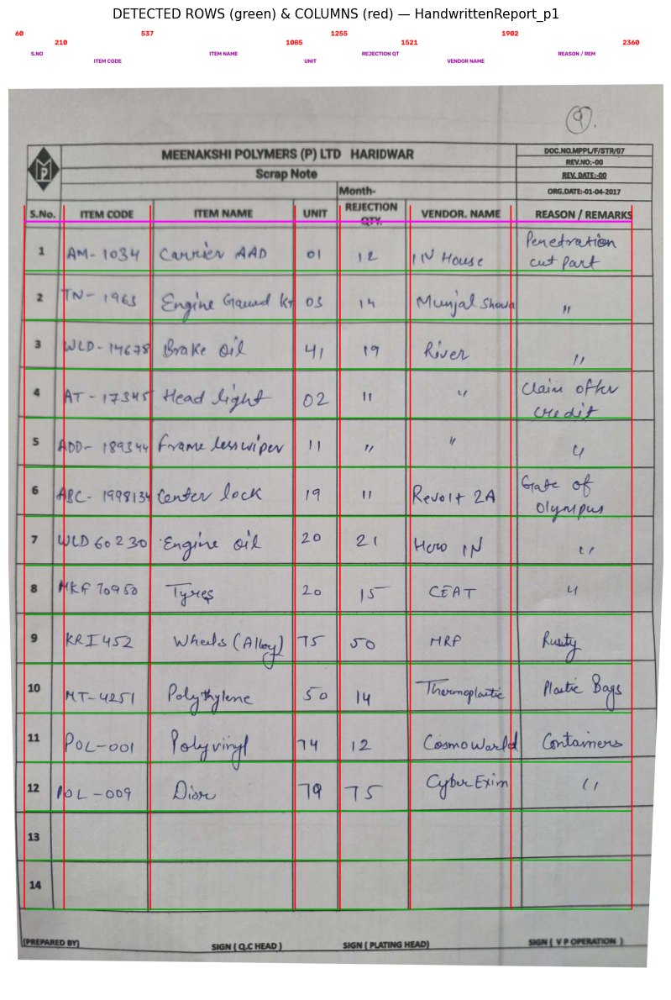

SUPPLIER LOT REJECTION SUMMARY_p1: 12 columns (auto), 36 body rows (auto), median row pitch 64px, body y 482..2772
   col_x = [203, 310, 528, 705, 772, 839, 907, 974, 1653, 1888, 2022, 2109, 2227]
   names = ['DATE', 'PART NAME', 'SUPPLIER NAME', 'LOT QTY', 'REW QTY', 'REJ QTY', 'OK QTY', 'PROBLEM DESCRIPTION', 'ACTION', 'RETURN STATUS', 'CAPA STATUS', 'REMARKS']


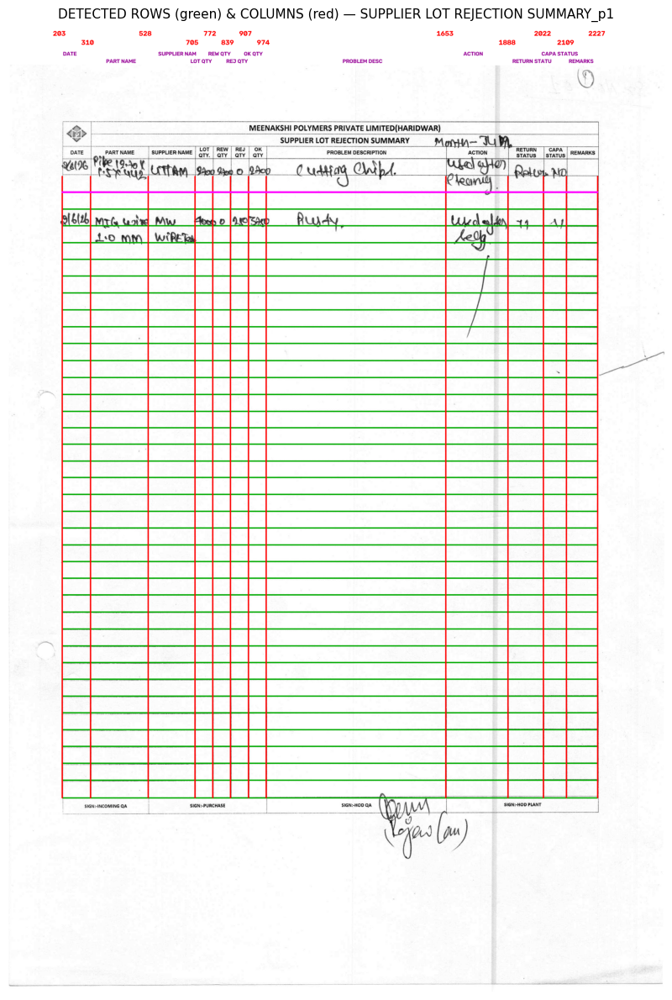

SUPPLIER REWORK REPORT_p1: 8 columns (auto), 16 body rows (auto), median row pitch 68px, body y 390..1490
   col_x = [219, 360, 652, 852, 1003, 1172, 1323, 1944, 2200]
   names = ['DATE', 'PART NAME', 'SUPPLIER NAME', 'LOT QTY', 'REWORK QTY', 'OK QTY', 'PROBLEM DESCRIPTION', 'REMARKS']


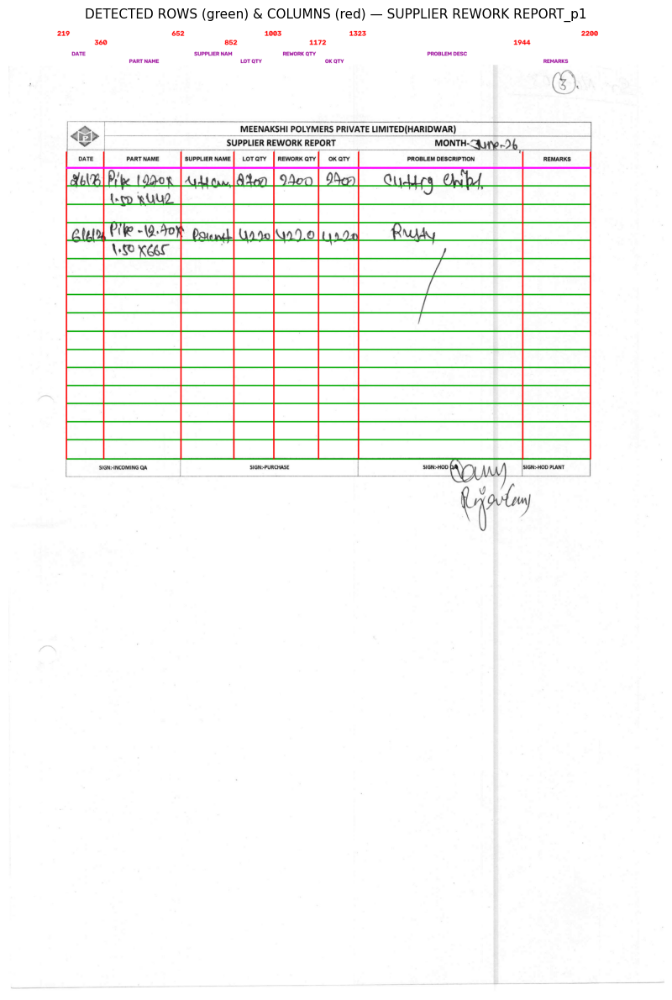

SUPPLIER SEGREGATION REPORT_p1: 8 columns (auto), 16 body rows (auto), median row pitch 68px, body y 390..1487
   col_x = [193, 333, 624, 824, 975, 1211, 1362, 1982, 2239]
   names = ['DATE', 'PART NAME', 'SUPPLIER NAME', 'LOT QTY', 'SEGREGATION QTY', 'OK QTY', 'PROBLEM DESCRIPTION', 'REMARKS']


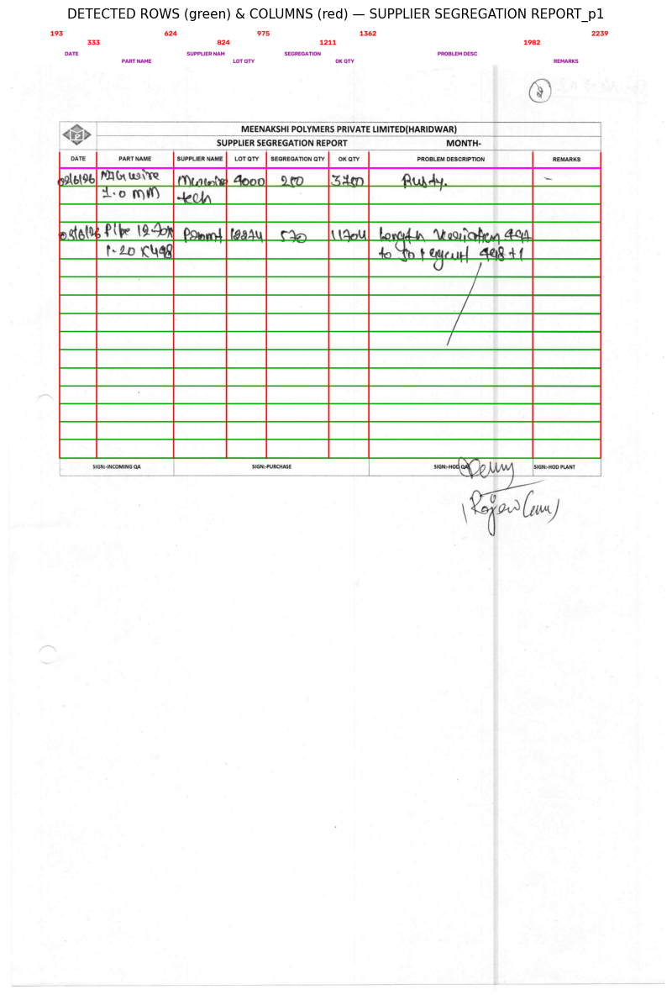

In [ ]:
# ============================================================================
# STAGE 9 — RESOLVE THE GRID  (auto-detection + template names + manual overrides)
# Produces page.grid = {col_x, col_names, row_y, table_right ...}. Anything in MANUAL_CONFIG (Stage 3) wins.
# If the number of vertical lines does not match the template, the page is flagged and skipped by later stages —
# fill MANUAL_CONFIG for it and re-run from this stage.
# ============================================================================
def resolve_grid(page):
    man = get_manual(page)
    d = page.detect
    names = list(man.get("header_names") or page.template["columns"])
    n = len(names)
    x1, y1, x2, y2 = page.table_bbox
    notes, src = [], {}

    # ---- columns -----------------------------------------------------------------------------------------
    if man.get("col_x"):
        col_x = [float(v) for v in man["col_x"]]
        if len(col_x) == n:
            col_x.append(float(x2))                          # left edges only -> table right edge closes the last column
        src["cols"] = "manual"
    else:
        col_x = list(d["cols"])
        if len(col_x) == n:                                  # right border line not detected -> use table bbox edge
            col_x.append(float(x2)); notes.append("right border not detected; using table bbox edge")
        src["cols"] = d.get("source", "auto")
    if len(col_x) != n + 1:
        raise ValueError(f"found {len(col_x)} vertical lines for {n} columns ({n + 1} needed). "
                         f"Detected x = {[int(v) for v in col_x]}. Set MANUAL_CONFIG col_x for '{os.path.splitext(page.pdf)[0]}'.")
    col_x = sorted(col_x)

    # ---- rows ---------------------------------------------------------------------------------------------
    body_top = man.get("body_top", d["body_top"])
    if body_top is None:
        raise ValueError("could not find the header/body boundary; set body_top in MANUAL_CONFIG")
    if man.get("row_y"):
        row_y = sorted(float(v) for v in man["row_y"]); src["rows"] = "manual"
    else:
        rows = list(d["body_rows"])
        if "body_bottom" in man or "body_top" in man:
            lo, hi = body_top - 6, man.get("body_bottom", rows[-1] if rows else body_top) + 6
            rows = [r for r in d["rows_all"] if lo <= r <= hi]
        if man.get("row_pitch"):                             # uniform grid between body_top and body_bottom
            bottom = man.get("body_bottom", rows[-1] if rows else body_top)
            k = max(1, round((bottom - body_top) / man["row_pitch"]))
            rows = list(np.linspace(body_top, bottom, k + 1)); src["rows"] = "manual pitch"
        else:
            src["rows"] = "manual range" if ("body_bottom" in man or "body_top" in man) else d.get("source", "auto")
        row_y = fill_missing_rows(rows)
    if len(row_y) < 2:
        raise ValueError("fewer than 2 row lines in the body; set row_y / body_top / body_bottom in MANUAL_CONFIG")

    page.grid = dict(col_x=col_x, col_names=names, row_y=[float(r) for r in row_y], body_top=float(row_y[0]),
                     body_bottom=float(row_y[-1]), table_bbox=list(page.table_bbox),
                     table_right=float(max(col_x[-1], x2)), source=src, notes=notes)
    return page.grid


def draw_grid(page):
    """Aligned page + white strip on top carrying the column names and the x of every column line."""
    g = page.grid
    strip = 150
    vis = cv2.copyMakeBorder(page.aligned, strip, 0, 0, 0, cv2.BORDER_CONSTANT, value=(255, 255, 255))
    top, bot = int(g["body_top"]) + strip, int(g["body_bottom"]) + strip
    for y in g["row_y"]:
        cv2.line(vis, (int(g["col_x"][0]), int(y) + strip), (int(g["col_x"][-1]), int(y) + strip), (0, 170, 0), 3)   # rows = green
    for i, x in enumerate(g["col_x"]):
        cv2.line(vis, (int(x), top - 60), (int(x), bot), (0, 0, 255), 4)                                               # columns = red
        cv2.putText(vis, str(int(x)), (int(x) - 35, 40 + (i % 2) * 34), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
    for i, name in enumerate(g["col_names"]):
        cx = int((g["col_x"][i] + g["col_x"][i + 1]) / 2)
        cv2.putText(vis, name[:12], (max(cx - 50, 0), 115 + (i % 2) * 28), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (150, 0, 150), 2)
    cv2.line(vis, (int(g["col_x"][0]), int(g["body_top"]) + strip), (int(g["col_x"][-1]), int(g["body_top"]) + strip), (255, 0, 255), 6)  # header|body
    return vis


for pg in PAGES:
    if pg.table_bbox is None or not pg.detect:          # skipped by Stage 7b / 8 (unidentified or non-ledger form)
        continue
    try:
        g = resolve_grid(pg)
    except Exception as e:
        pg.grid = {}
        pg.warnings.append(str(e))
        print(f"{pg.uid}: GRID FAILED — {e}")
        continue
    pitch = float(np.median(np.diff(g["row_y"])))
    print(f"{pg.uid}: {len(g['col_names'])} columns ({g['source']['cols']}), {len(g['row_y']) - 1} body rows ({g['source']['rows']}), "
          f"median row pitch {pitch:.0f}px, body y {g['body_top']:.0f}..{g['body_bottom']:.0f}")
    print("   col_x =", [int(v) for v in g["col_x"]])
    print("   names =", g["col_names"])
    for note in g["notes"]:
        print("   note:", note)
    vis = draw_grid(pg)
    save_debug(pg, "04_rows_columns.png", vis)
    if viewed(pg):
        show(vis, f"DETECTED ROWS (green) & COLUMNS (red) — {pg.uid}", figsize=(9, 12))

In [ ]:
# ============================================================================
# STAGE 10 — COLUMN CROPS  (one crop per column, spanning the whole data area)
# This is where this notebook parts company with the cell-wise one: instead of a crop per (record, column) the
# page is cut into as many images as the form has columns, each one running from the first data row to the last.
#
#     left  = x1 - padding          right = x2 + padding
#     top   = body_top - headroom   bottom = body_bottom + V_PADDING
#
# The horizontal rules are the same as in the cell-wise notebook, and for the same reasons:
#   * a crop grows past the printed line for as long as the ink continues, stopping at a white gutter, because the
#     narrow QTY columns are too tight for a 4-digit number and the writing spills over the line;
#   * the top of the strip reaches above the header/body line only as far as there is room, so that handwriting
#     rising above it is not chopped while the printed column name is left out.
# The whole data area acts as one tall "record" for the purpose of those measurements.
# ============================================================================
def record_ink_profile(page, rec):
    """(ink pixels per x inside this record's rows, mask of the printed column lines).

    The printed HORIZONTAL lines run the full width of the page, so their rows are dropped first — otherwise every
    column would look inked. The printed VERTICAL lines are not dropped but flagged: when the scan walks outwards
    they must be stepped over, since the line itself says nothing about where the handwriting ends.
    """
    g = page.grid
    H, W = page.gray.shape
    y1, y2 = max(int(rec["y1"]), 0), min(int(rec["y2"]), H)
    band = (page.gray[y1:y2] < INK_GRAY_THRESH).astype(np.uint8)
    for y in g["row_y"]:                                    # the rows where a printed line is expected
        yy = int(round(y)) - y1
        lo, hi = max(yy - LINE_HALF_PX, 0), yy + LINE_HALF_PX + 1
        if hi > 0 and lo < band.shape[0]:
            band[lo:hi] = 0
    # a scan is never perfectly straight, so a curved line can dodge the rows above. Anything still running
    # horizontally for a quarter of an inch is a printed line too, and one surviving line would ink every
    # column and hide every gutter.
    k = max(30, int(0.25 * DPI))
    band = cv2.subtract(band, cv2.morphologyEx(band, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (k, 1))))
    prof = band.sum(axis=0)

    is_line = np.zeros(W, bool)
    for x in g["col_x"]:
        xx = int(round(x))
        is_line[max(xx - LINE_HALF_PX, 0): xx + LINE_HALF_PX + 1] = True
    return prof, is_line


def column_overflow(prof, is_line, start, direction):
    """How far (px) the handwriting runs past a printed column line; 0 when it stops at the line.

    Walks outwards, skipping the printed line's own columns, until CROP_GUTTER_PX consecutive white columns are
    found: that white gap is the PROOF of where this entry ends and the neighbouring one begins.

    If no such gap appears within CROP_MAX_OVERFLOW the answer is 0, NOT the maximum. When the columns are packed
    edge to edge there is no way to tell this entry's ink from the neighbour's, and extending blindly pulls the
    neighbour's digits into the crop - on a real REJ QTY cell that produced a crop holding three columns at once
    ('400', '0', '2A'), which is worse than the clipping it was meant to fix. Without proof, stay conservative
    and keep the plain PADDING crop.
    """
    gap = reach = 0
    proved = False
    for step in range(1, CROP_MAX_OVERFLOW + 1):
        x = start + direction * step
        if not (0 <= x < len(prof)):
            break
        if is_line[x]:
            continue                                        # the printed line proves nothing either way
        if prof[x] > CROP_INK_EPS:
            reach, gap = step, 0
        else:
            gap += 1
            if gap >= CROP_GUTTER_PX:
                proved = True
                break
    return reach + CROP_EDGE_MARGIN if (proved and reach) else 0


def first_row_headroom(page, y1, left, right):
    """How far the FIRST data row's crop may reach above the header/body line, in px.

    A fixed 2 px used to chop the tops off letters written high on the first line. Now the gap above the line is
    inspected inside this column's own x-range: if it is blank, the full V_PADDING_FIRST is taken; if the printed
    header name is in the way, the crop stops 2 px below it. Never returns less than V_PADDING_TOP.
    """
    H, W = page.gray.shape
    y1 = int(round(y1))
    lo = max(y1 - V_PADDING_FIRST, 0)
    band = page.gray[lo:y1, max(int(left), 0): min(int(right), W)]
    if band.size == 0:
        return V_PADDING_TOP
    ink = (band < INK_GRAY_THRESH).astype(np.uint8)
    # the header/body line itself is ink too, so drop the long horizontal runs first: what is left is header TEXT
    k = max(15, min(int(LINE_KERNEL_FRAC * band.shape[1]), LINE_RUN_CAP_PX))
    runs = cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (k, 1)))
    thick = cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, LINE_HALF_PX + 2)))
    text = cv2.subtract(ink, cv2.subtract(runs, thick))      # a line is LONG and THIN; a shaded/bold header is not
    rows = np.flatnonzero(text.sum(axis=1) > 3)
    if rows.size == 0:
        return V_PADDING_FIRST                              # nothing but the line above -> take the whole buffer
    return int(np.clip(y1 - (lo + int(rows.max()) + 2), V_PADDING_TOP, V_PADDING_FIRST))


def crop_bounds(page, rec, c, prof=None, is_line=None):
    g = page.grid
    H, W = page.gray.shape
    x1, x2 = g["col_x"][c], g["col_x"][c + 1]
    if prof is None:
        prof, is_line = record_ink_profile(page, rec)
    left = x1 - max(PADDING, column_overflow(prof, is_line, int(round(x1)), -1))
    right = x2 + max(PADDING, column_overflow(prof, is_line, int(round(x2)), +1))
    if c == len(g["col_names"]) - 1:                                   # last column
        right = W if LAST_COL_MODE == "page" else g["table_right"] + PADDING
    top = rec["y1"] - (first_row_headroom(page, rec["y1"], left, right) if rec["first_row"] == 0 else V_PADDING)
    bottom = rec["y2"] + V_PADDING
    box = [max(int(round(left)), 0), max(int(round(top)), 0), min(int(round(right)), W), min(int(round(bottom)), H)]
    cell = [int(round(x1)), int(round(rec["y1"])), int(round(right if c == len(g["col_names"]) - 1 else x2)), int(round(rec["y2"]))]
    return box, cell


def column_crops(page):
    """page.columns = {header name: dict(crop_box, crop, ...)} - one tall image per column."""
    g = page.grid
    H, W = page.gray.shape
    body = dict(y1=g["body_top"], y2=g["body_bottom"], first_row=0)     # the data area as one tall record
    prof, is_line = record_ink_profile(page, body)
    page.columns = {}
    for c, name in enumerate(g["col_names"]):
        box, cell_box = crop_bounds(page, body, c, prof, is_line)
        l, t, r, b = box
        page.columns[name] = dict(col_index=c, crop_box=box, cell_box=cell_box,
                                  crop=page.gray[t:b, l:r].copy())
    return page.columns


def draw_column_boxes(page):
    """The aligned page with every column strip outlined (colours alternate)."""
    vis = page.aligned.copy()
    palette = [(255, 0, 0), (0, 140, 255), (0, 170, 0), (200, 0, 200)]
    for name, col in page.columns.items():
        l, t, r, b = col["crop_box"]
        cv2.rectangle(vis, (l, t), (r, b), palette[col["col_index"] % len(palette)], 4)
    return vis


for pg in PAGES:
    if not pg.grid:
        continue
    column_crops(pg)
    print(f"{pg.uid}: {len(pg.columns)} column strips")
    for name, col in list(pg.columns.items())[:3]:
        l, t, r, b = col["crop_box"]
        print(f"   {name:24s} x {l}..{r} ({r - l}px wide), y {t}..{b} ({b - t}px tall)")


HandwrittenReport_p1: 7 column strips
   S.NO                     x 50..220 (170px wide), y 591..3207 (2616px tall)
   ITEM CODE                x 200..547 (347px wide), y 583..3207 (2624px tall)
   ITEM NAME                x 527..1095 (568px wide), y 591..3207 (2616px tall)
SUPPLIER LOT REJECTION SUMMARY_p1: 12 column strips
   DATE                     x 193..320 (127px wide), y 480..2782 (2302px tall)
   PART NAME                x 300..538 (238px wide), y 480..2782 (2302px tall)
   SUPPLIER NAME            x 518..715 (197px wide), y 480..2782 (2302px tall)
SUPPLIER REWORK REPORT_p1: 8 column strips
   DATE                     x 209..370 (161px wide), y 388..1500 (1112px tall)
   PART NAME                x 350..662 (312px wide), y 388..1500 (1112px tall)
   SUPPLIER NAME            x 642..862 (220px wide), y 388..1500 (1112px tall)
SUPPLIER SEGREGATION REPORT_p1: 8 column strips
   DATE                     x 183..343 (160px wide), y 388..1497 (1109px tall)
   PART NAME                x

In [ ]:
# ============================================================================
# STAGE 11 — REMOVE THE PRINTED GRID FROM EVERY COLUMN STRIP
# Identical treatment to the cell-wise notebook, applied to the taller image: only pixels that really belong to a
# printed line are erased, and a stroke that CROSSES a line (ink above and below it) is kept, so the row rules
# running across the strip do not cut through the handwriting.
# ============================================================================
def _snap(profile, pos):
    """Position of the darkest ridge within +-LINE_GUIDE_TOL of `pos` (falls back to pos if the region is blank)."""
    lo, hi = max(int(round(pos)) - LINE_GUIDE_TOL, 0), min(int(round(pos)) + LINE_GUIDE_TOL + 1, len(profile))
    if hi - lo < 3 or profile[lo:hi].max() < 8:
        return pos
    return lo + int(np.argmax(profile[lo:hi]))


def _line_runs(ink, w, h):
    """Masks of the horizontal / vertical runs that are long enough to be a printed grid line, never a pen stroke."""
    kh = max(15, min(int(LINE_KERNEL_FRAC * w), LINE_RUN_CAP_PX))
    kv = max(15, min(int(LINE_KERNEL_FRAC * h), LINE_RUN_CAP_PX))
    hl = cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (kh, 1)))
    vl = cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, kv)))
    return hl, vl


def crossings(hand):
    """Mask of the places where a pen stroke passes THROUGH a printed line.

    A stroke crossing a horizontal line has ink above it and below it; one crossing a vertical line has ink to its
    left and to its right. Ink on one side only (a word resting on the line) is not a crossing. `hand` is the ink
    that is not part of a long run, i.e. the handwriting.
    """
    n = LINE_CROSS_PX
    kv, kh = np.ones((n + 1, 1), np.uint8), np.ones((1, n + 1), np.uint8)
    above = cv2.dilate(hand, kv, anchor=(0, n))        # ink at or above this pixel
    below = cv2.dilate(hand, kv, anchor=(0, 0))        # ink at or below
    left = cv2.dilate(hand, kh, anchor=(n, 0))
    right = cv2.dilate(hand, kh, anchor=(0, 0))
    return cv2.bitwise_or(cv2.bitwise_and(above, below), cv2.bitwise_and(left, right))


def remove_grid_lines(gray, box, page):
    """Return (line-removed gray crop, erased mask). `box` = crop position on the page."""
    l, t, r, b = box
    h, w = gray.shape
    ink = cv2.morphologyEx(
        cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 31, 10),
        cv2.MORPH_OPEN, np.ones((2, 2), np.uint8))                 # ink = 255, single-pixel dust dropped
    hl, vl = _line_runs(ink, w, h)
    lines = cv2.bitwise_or(hl, vl)

    if LINE_REMOVAL_MODE == "morph":
        mask = lines
    else:
        dark = 255.0 - gray.astype(np.float32)
        row_prof, col_prof = dark.mean(axis=1), dark.mean(axis=0)
        band = np.zeros_like(gray)                                 # where a printed line is ALLOWED to be
        for y in page.grid["row_y"]:
            yy = y - t
            if -LINE_HALF_PX <= yy < h + LINE_HALF_PX:
                yy = _snap(row_prof, yy)
                band[max(int(yy) - LINE_HALF_PX, 0): int(yy) + LINE_HALF_PX + 1, :] = 255
        for x in page.grid["col_x"]:
            xx = x - l
            if -LINE_HALF_PX <= xx < w + LINE_HALF_PX:
                xx = _snap(col_prof, xx)
                band[:, max(int(xx) - LINE_HALF_PX, 0): int(xx) + LINE_HALF_PX + 1] = 255
        mask = cv2.bitwise_and(lines, band)                        # real line pixels, at a known line position

    mask = cv2.dilate(mask, np.ones((3, 3), np.uint8))             # catch the soft edge of the printed line
    mask = cv2.subtract(mask, crossings(cv2.subtract(ink, lines)))  # keep where a stroke passes through
    clean = cv2.inpaint(gray, mask, LINE_INPAINT_RAD, cv2.INPAINT_TELEA)
    return clean, mask


def clear_margins(clean, crop_box, cell_box, sides=("left", "right")):
    """Blank the ink that has come in from the NEIGHBOURING column.

    The padding deliberately reaches past the printed cell, which drags in the tail of the neighbour's entry: on a
    real page the PROBLEM DESCRIPTION crop opened with '00', the end of the next column's 2400, and the cell was
    read as 'CHI b'. Three things have to be true together before a blob is treated as the neighbour's, because
    each one alone gets it wrong:
      * it RUNS OFF the outer edge of the crop  - an entry of our own is whole inside the crop;
      * it is separated from every other blob by a white gutter - in a narrow QTY column our own digits touch both
        crop edges, and on the edge test alone they were wiped (LOT QTY lost 98.7% of its ink);
      * it stays within the outer eighth of the cell - our own first digit can be cut off by the crop and stand
        apart from the rest of the number, but it does not sit right against the border.
    """
    l, t, r, b = crop_box
    x1, _, x2, _ = cell_box
    h, w = clean.shape
    ink = (clean < INK_GRAY_THRESH).astype(np.uint8)
    k = max(15, min(int(LINE_KERNEL_FRAC * w), LINE_RUN_CAP_PX))       # printed lines would connect everything
    ink = cv2.subtract(ink, cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (k, 1))))
    ink = cv2.subtract(ink, cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, k))))
    ink = cv2.dilate(ink, np.ones((3, 3), np.uint8))                   # rejoin strokes broken by the line removal
    n, lab, stats, _ = cv2.connectedComponentsWithStats(ink)
    if n < 2:
        return clean

    cx1, cx2 = int(np.clip(x1 - l, 0, w)), int(np.clip(x2 - l, 0, w))
    keep_out = max(int((cx2 - cx1) / 8), CROP_GUTTER_PX)               # the outer eighth of the printed cell
    out = clean.copy()
    for side in sides:
        for i in set(np.unique(lab[:, 0 if side == "left" else w - 1])) - {0}:
            x, y, cw, ch, area = stats[i]
            if area > 0.4 * h * w:                                     # never wipe the whole crop
                continue
            other = ((lab > 0) & (lab != i)).sum(axis=0)
            if side == "left":
                if x >= cx1 - CROP_EDGE_MARGIN or x + cw > cx1 + keep_out:
                    continue
                gutter = other[x + cw: x + cw + CROP_GUTTER_PX]
            else:
                if x + cw <= cx2 + CROP_EDGE_MARGIN or x < cx2 - keep_out:
                    continue
                gutter = other[max(x - CROP_GUTTER_PX, 0): x]
            if len(gutter) == CROP_GUTTER_PX and (gutter <= CROP_INK_EPS).all():
                out[lab == i] = 255
    return out


def clean_column_crops(page):
    last = len(page.grid["col_names"]) - 1
    for name, col in page.columns.items():
        col["clean"], col["line_mask"] = remove_grid_lines(col["crop"], col["crop_box"], page)
        sides = ("left",) if (col["col_index"] == last and LAST_COL_MODE == "page") else ("left", "right")
        col["clean"] = clear_margins(col["clean"], col["crop_box"], col["cell_box"], sides)


for pg in PAGES:
    if not pg.grid:
        continue
    clean_column_crops(pg)
    print(f"{pg.uid}: line-removed {len(pg.columns)} column strips")


HandwrittenReport_p1: line-removed 7 column strips
SUPPLIER LOT REJECTION SUMMARY_p1: line-removed 12 column strips
SUPPLIER REWORK REPORT_p1: line-removed 8 column strips
SUPPLIER SEGREGATION REPORT_p1: line-removed 8 column strips


In [ ]:
# ============================================================================
# STAGE 11b — REMOVE CANCEL STROKES  (new in v5)
# The unused rows of a form are often struck through with ONE long diagonal pen line ("nothing below this").
# It is handwriting, but not data: read cell by cell it came out as 'I', 'L', '/' in rows that were really empty,
# and Stage 16 would have merged those rows into the last record. It is found on the whole data area, because it
# crosses row lines AND column lines, and then whited out of every column strip.
#
# A stroke counts as a cancel stroke when it is
#   * TALL   - spans at least CANCEL_MIN_ROWS printed rows (handwriting straddles at most ~1.5 rows),
#   * THIN   - no more ink than a pen line of CANCEL_MAX_WIDTH px along its length (a word is far denser),
#   * STRAIGHT - its pixels stay within CANCEL_MAX_RESIDUAL of the best-fit line.
# A dashed printed line the grid detector missed (e.g. down the ACTION column of the lot-rejection form) passes the
# same tests and is removed with it - which is also what we want.
# ============================================================================
CANCEL_MIN_ROWS     = 2.5     # printed rows the stroke must span
CANCEL_MAX_WIDTH    = 10      # px: ink pixels per px of stroke length
CANCEL_MAX_RESIDUAL = 0.06    # mean distance from the fitted line, as a fraction of the stroke length


def cancel_strokes(page):
    """(mask of cancel-stroke pixels in page coordinates, list of dicts describing each stroke)."""
    g = page.grid
    H, W = page.gray.shape
    x0 = max(int(g["col_x"][0]) - PADDING, 0)
    x1 = W if LAST_COL_MODE == "page" else min(int(g["table_right"]) + PADDING, W)
    y0, y1 = max(int(g["body_top"]) - V_PADDING, 0), min(int(g["body_bottom"]) + V_PADDING, H)
    gray = page.gray[y0:y1, x0:x1]
    ink = cv2.morphologyEx(
        cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 31, 10),
        cv2.MORPH_OPEN, np.ones((2, 2), np.uint8))
    lines = cv2.dilate(cv2.bitwise_or(page.hmask, page.vmask)[y0:y1, x0:x1], np.ones((5, 5), np.uint8))
    hand = cv2.bitwise_and(ink, cv2.bitwise_not(lines))
    strokes = cv2.bitwise_or(hand, cv2.bitwise_and(crossings(hand), lines))   # rejoin a stroke across the lines
    n, lab, stats, _ = cv2.connectedComponentsWithStats(strokes, connectivity=8)

    pitch = float(np.median(np.diff(g["row_y"])))
    mask = np.zeros((H, W), np.uint8)
    found = []
    for k in range(1, n):
        x, y, w, h, area = (int(v) for v in stats[k])
        if h < CANCEL_MIN_ROWS * pitch:
            continue
        length = math.hypot(w, h)
        if area > CANCEL_MAX_WIDTH * length:
            continue
        ys, xs = np.nonzero(lab[y: y + h, x: x + w] == k)
        pts = np.column_stack([xs, ys]).astype(np.float32)
        vx, vy, cx, cy = cv2.fitLine(pts, cv2.DIST_L2, 0, 0.01, 0.01).ravel()
        residual = float(np.abs((pts[:, 0] - cx) * vy - (pts[:, 1] - cy) * vx).mean())
        if residual > CANCEL_MAX_RESIDUAL * length:
            continue
        mask[y0 + y + ys, x0 + x + xs] = 255
        found.append(dict(bbox=[x0 + x, y0 + y, x0 + x + w, y0 + y + h], rows=round(h / pitch, 1),
                          angle=round(math.degrees(math.atan2(vy, vx)), 1), pixels=area))
    return cv2.dilate(mask, np.ones((3, 3), np.uint8)), found


for pg in PAGES:
    if not pg.grid:
        continue
    mask, pg.cancel = cancel_strokes(pg)
    for col in pg.columns.values():
        l, t, r, b = col["crop_box"]
        col["clean"][mask[t:b, l:r] > 0] = 255
    desc = ", ".join(f"{c['rows']} rows @ {c['angle']:+.0f} deg" for c in pg.cancel) or "none"
    print(f"{pg.uid}: {len(pg.cancel)} cancel stroke(s) removed ({desc})")
    if pg.cancel and SAVE_DEBUG:
        vis = pg.aligned.copy()
        vis[mask > 0] = (0, 0, 255)
        save_debug(pg, "11_cancel_strokes.png", vis)

HandwrittenReport_p1: 0 cancel stroke(s) removed (none)
SUPPLIER LOT REJECTION SUMMARY_p1: 1 cancel stroke(s) removed (5.0 rows @ -76 deg)
SUPPLIER REWORK REPORT_p1: 1 cancel stroke(s) removed (4.2 rows @ -70 deg)
SUPPLIER SEGREGATION REPORT_p1: 1 cancel stroke(s) removed (4.6 rows @ -67 deg)


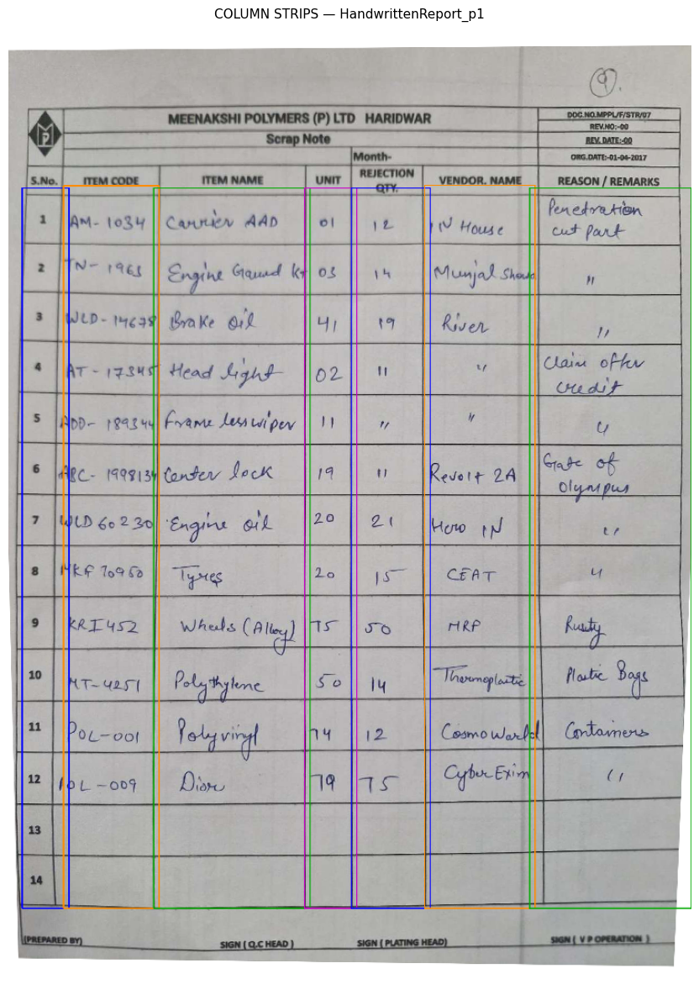

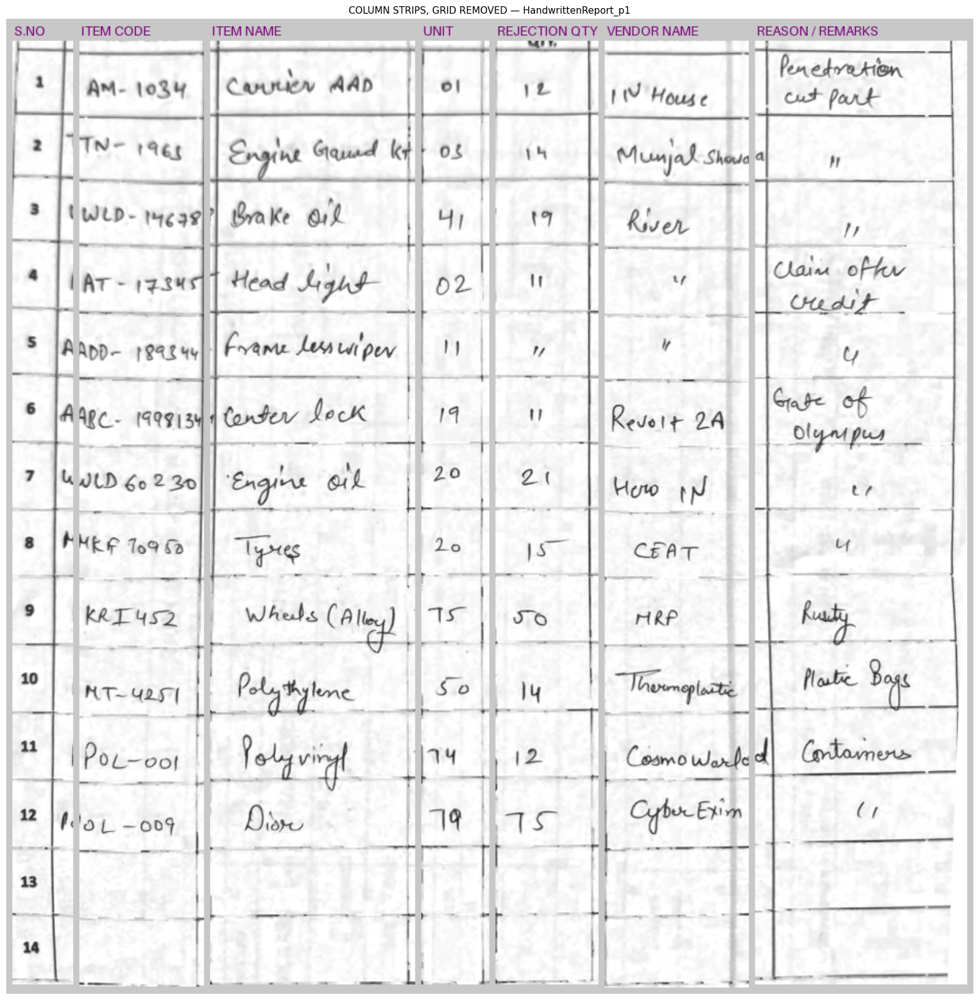

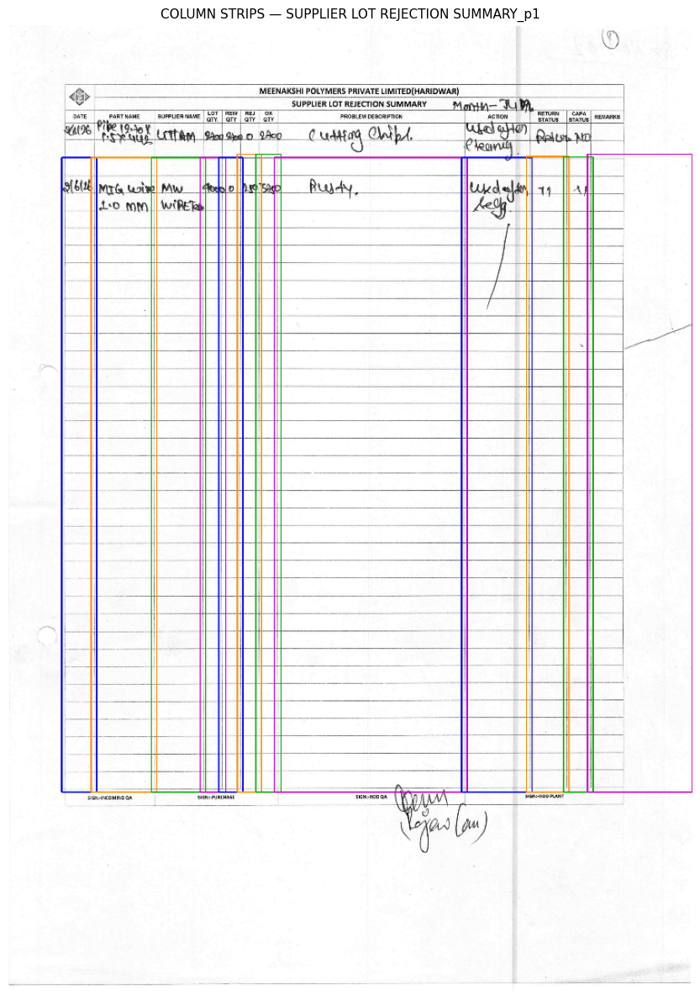

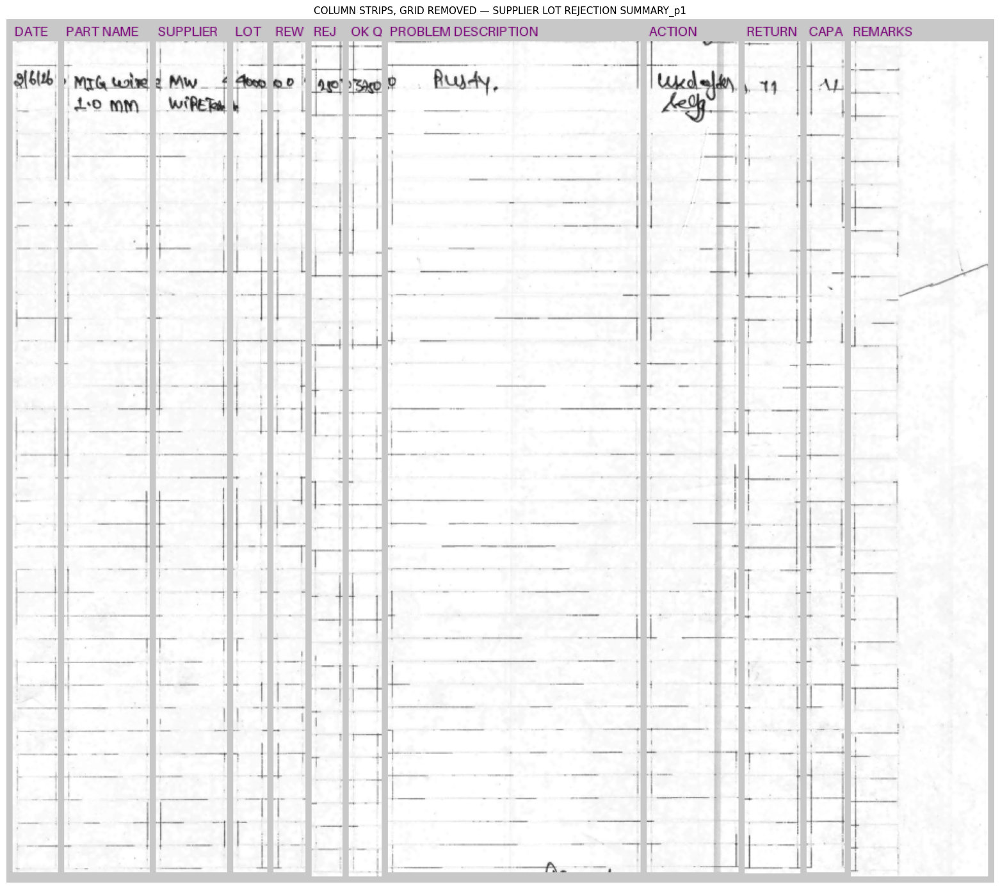

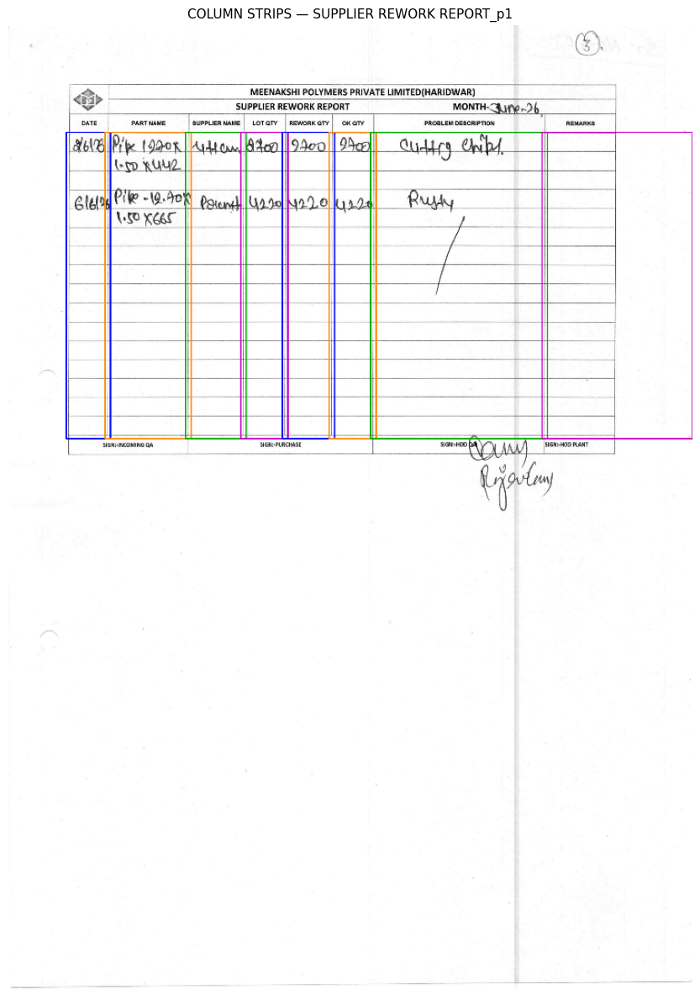

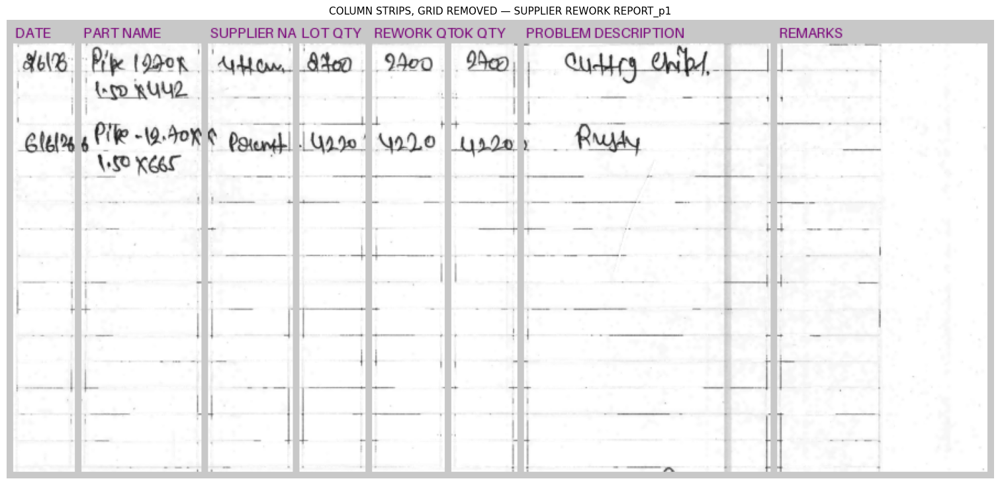

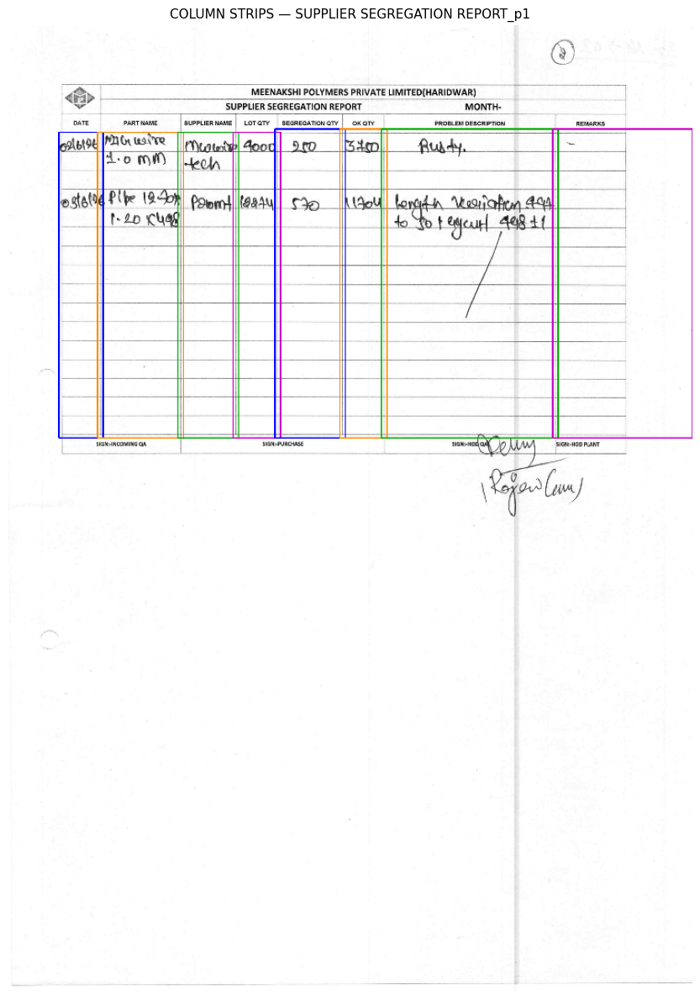

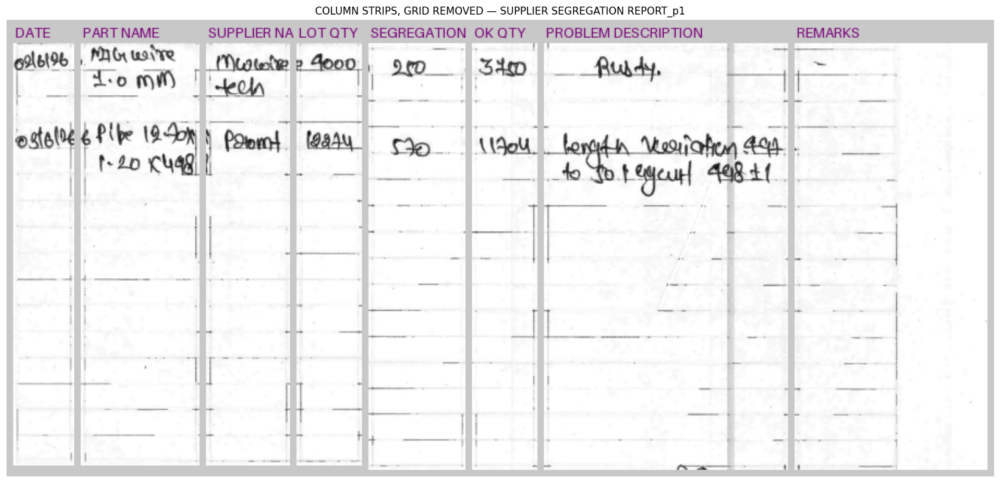

In [ ]:
# ============================================================================
# STAGE 12 — DEBUG VIEWS + SAVING THE COLUMN STRIPS
# Writes OUTPUT_DIR/columns/<page>/<COLUMN NAME>.png and _clean.png, and shows the strips side by side.
# ============================================================================
def save_column_crops(page):
    if not SAVE_DEBUG:
        return
    base = os.path.join(OUTPUT_DIR, "columns", page.uid)
    os.makedirs(base, exist_ok=True)
    for name, col in page.columns.items():
        cv2.imwrite(os.path.join(base, safe_name(name) + ".png"), col["crop"])
        cv2.imwrite(os.path.join(base, safe_name(name) + "_clean.png"), col["clean"])


def column_sheet(page, kind="clean", scale=0.35, gap=6):
    """All the column strips laid out left to right, each under its header name."""
    names = list(page.columns)
    tiles = [cv2.resize(page.columns[n][kind], None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
             for n in names]
    head = 22
    height = head + max(t.shape[0] for t in tiles) + gap
    width = sum(t.shape[1] + gap for t in tiles) + gap
    canvas = np.full((height, width, 3), 200, np.uint8)
    xs, x = [], gap
    for t in tiles:
        canvas[head: head + t.shape[0], x: x + t.shape[1]] = to_bgr(t)
        xs.append(x)
        x += t.shape[1] + gap
    pil = Image.fromarray(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    d = ImageDraw.Draw(pil)
    try:
        font = ImageFont.load_default(size=13)
    except TypeError:
        font = ImageFont.load_default()
    for x0, n, t in zip(xs, names, tiles):
        d.text((x0 + 2, 4), n[:max(3, t.shape[1] // 7)], fill=(120, 0, 120), font=font)
    return cv2.cvtColor(np.array(pil), cv2.COLOR_RGB2BGR)


for pg in PAGES:
    if not pg.grid:
        continue
    save_column_crops(pg)
    boxes = draw_column_boxes(pg)
    raw_sheet, clean_sheet = column_sheet(pg, "crop"), column_sheet(pg, "clean")
    save_debug(pg, "08_column_boxes.png", boxes)
    save_debug(pg, "09_columns_raw.png", raw_sheet)
    save_debug(pg, "10_columns_clean.png", clean_sheet)
    if viewed(pg):
        show(cv2.resize(boxes, None, fx=0.3, fy=0.3), f"COLUMN STRIPS — {pg.uid}", figsize=(9, 12))
        show_h = max(3.0, 16 * clean_sheet.shape[0] / clean_sheet.shape[1])
        show(clean_sheet, f"COLUMN STRIPS, GRID REMOVED — {pg.uid}", figsize=(16, show_h))


In [ ]:
# ============================================================================
# STAGE 13 — LOAD GOT-OCR-2.0 + BATCHED READING  (v5: GOT only, cells read in batches)
# ensure_got() / got_generate() come from Stage 7b (the heading read may already have loaded the model).
# got_generate_batch() reads many cell images in ONE generate() call. Every cell is resized to the same 1024x1024
# input with the same prompt, so the batch needs no padding and each cell is decoded exactly as it would be alone;
# only the GPU does the work in parallel instead of one cell after another.
# ============================================================================
import torch

COLUMN_SPLIT     = "rows"       # "rows"  : cut the strip at the printed row lines and read every entry (default;
                                #           keeps the columns aligned so Stage 16 can rebuild the table)
                                # "whole" : send the whole strip in one call - fewer calls, but the entries come back
                                #           as one string with no row positions, so Stage 16 cannot rebuild a table
OCR_CROP_KIND    = "clean"      # "clean" = grid + cancel strokes removed (Stage 11/11b) | "crop" = raw padded strip
OCR_SKIP_EMPTY   = True         # do not send row bands that hold no ink
SAVE_OCR_INPUT   = True         # write the EXACT image each cell was read from to OUTPUT_DIR/ocr_input/ and
                                # record its path on the entry. Without it the last saved artifact is the whole
                                # column strip (Stage 12), which is FIVE transformations away from what the model
                                # sees: the row band, the whiteout of ink owned by a neighbouring row, the photo
                                # rule whiteout, trim_to_ink() and pad_for_got(). A cell the ownership step wrongly
                                # blanked and a cell the model simply could not read look identical in the output;
                                # only this tells them apart. One small PNG per non-empty cell - it is included in
                                # the Stage 17 zip, so turn it off if that matters more than being able to audit.
PAD_ASPECT_MAX   = 6.0          # GOT resizes every input to a fixed square, so a 500x60 REMARKS cell is squashed
                                # ~8x vertically. A crop wider (or taller) than this ratio is white-padded until it
                                # reaches it: the strokes keep their proportions and are only scaled, which is what
                                # the model saw in training. 0 turns the padding off.
MIN_ENTRY_INK    = 120          # ink pixels (owned by the row, Stage 14) below which a band counts as empty
OCR_BATCH_MAX    = 16           # ceiling on cells per generate() call; the real batch is sized to the GPU below
OCR_BATCH_SIZE   = 1            # replaced by auto_batch_size() once the model is loaded (end of this cell)


def auto_batch_size():
    """Cells per generate() call, sized to the GPU that is actually present and to the attention backend.

    A fixed 16 was wrong: GPU memory scales LINEARLY with the batch, and the VISION encoder dominates it, not
    the text decoder. One 1024x1024 cell image costs ~0.9 GB of activations under eager attention (a 384 MiB
    global-attention matrix, the ViT MLP, and ~78 MiB of `output_scores` logits over a 151k vocabulary), but
    well under 0.2 GB under SDPA. On a 15 GB T4 that is the difference between a batch of 16 working and it
    exhausting the card before the first cell is read.

    CPU reads singly: it is compute-bound, so a batch buys no parallelism, and every cell in one decodes until
    the LONGEST finishes - a batch of 8 was measured 8x SLOWER than 8 single reads of the same text.
    """
    if not torch.cuda.is_available():
        return 1
    free_gb = torch.cuda.mem_get_info()[0] / 2 ** 30                 # free AFTER the model is resident
    per_image = 0.20 if globals().get("GOT_ATTN") == "sdpa" else 0.90
    return int(np.clip((free_gb * 0.5) / per_image, 1, OCR_BATCH_MAX))   # half the free memory, never more

OCR_JSON_PATH    = os.path.join(OUTPUT_DIR, "columns_ocr_results_GOT.json")

GOT_MAX_NEW_TOKENS  = 128       # ceiling; the budget per image is scaled to its size (token_budget)
GOT_MIN_NEW_TOKENS  = 12
GOT_NO_REPEAT_NGRAM = 6         # a verbatim 6-token repeat is always a degenerate loop, never handwriting
GOT_WHOLE_TOKENS    = 512       # budget for "whole" mode, where one image holds the entire column

ensure_got()                                     # sets GOT_ATTN, which auto_batch_size() reads
OCR_BATCH_SIZE = auto_batch_size()
_free = torch.cuda.mem_get_info()[0] / 2 ** 30 if torch.cuda.is_available() else 0
print(f"GOT-OCR-2.0 ready on {device} ({GOT_MODEL_ID}) | attention {globals().get('GOT_ATTN', 'n/a')}"
      + (f" | {_free:.1f} GB free" if torch.cuda.is_available() else "")
      + f" | batch size {OCR_BATCH_SIZE}"
      + ("  (raise OCR_BATCH_MAX if the GPU stays idle)" if OCR_BATCH_SIZE == OCR_BATCH_MAX else ""))


def got_generate_batch(imgs, budgets, no_repeat_ngram=0):
    """Run GOT on several grayscale images in one call -> [(text, mean per-token probability)].

    The batch generates up to the LARGEST budget, then each cell is cut back to its own budget. Decoding is greedy
    and every cell has the same input length, so that is token-for-token what reading the cell alone would give.
    """
    ensure_got()
    images = [Image.fromarray(im).convert("RGB") for im in imgs]
    inputs = got_processor(images, return_tensors="pt")
    inputs = {k: v.to(got_model.device) if hasattr(v, "to") else v for k, v in inputs.items()}
    with torch.inference_mode():
        out = got_model.generate(**inputs, do_sample=False, tokenizer=got_processor.tokenizer,
                                 stop_strings="<|im_end|>", max_new_tokens=int(max(budgets)),
                                 no_repeat_ngram_size=no_repeat_ngram or 0,
                                 output_scores=True, return_dict_in_generate=True)
    start = inputs["input_ids"].shape[1]
    special = set(got_processor.tokenizer.all_special_ids)
    results = []
    for b, budget in enumerate(budgets):
        new_ids = out.sequences[b][start: start + int(budget)]
        stop = next((i for i, t in enumerate(new_ids.tolist()) if t in special), len(new_ids))
        new_ids = new_ids[: stop + 1]                    # nothing after this cell's own end-of-text (batch padding)
        text = got_processor.decode(new_ids, skip_special_tokens=True).strip()
        probs = [torch.softmax(step[b].float(), dim=-1)[t].item() for step, t in zip(out.scores, new_ids)
                 if t.item() not in special]
        results.append((text, float(np.mean(probs)) if probs else None))
    # `results` holds only Python objects by now. Dropping these frees the batch's activations and, above all,
    # out.scores - one [batch x 151936] tensor PER GENERATED TOKEN - before the next batch asks for memory.
    del inputs, out, new_ids
    return results


print(f"split: {COLUMN_SPLIT!r} | strips: {OCR_CROP_KIND!r}\noutput: {OCR_JSON_PATH}")

GOT-OCR-2.0 ready on cuda (stepfun-ai/GOT-OCR-2.0-hf) | attention eager | 11.3 GB free | batch size 6
split: 'rows' | strips: 'clean'
output: /content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column/columns_ocr_results_GOT.json


In [ ]:
# ============================================================================
# STAGE 14 — COLUMN READER  (v5: overlapping row bands with ink ownership; batched GOT reads)
# A column strip is still read one printed row at a time, so every reading keeps its (row, column) - but the band
# handed to GOT is no longer cut hard at the printed row lines.
#
# WHY: measured on the 7 ledger forms, ~35% of filled cells have handwriting crossing into the row above/below
# (descenders like the 'g' of "Bending" loop under the line; on the weld-shop form whole words straddle it). A hard
# cut chopped those strokes off, and the chopped piece turned up as noise ('I', '111') in the next row.
#
# HOW: every connected ink shape in the strip is OWNED by exactly one printed row - the row whose interior (the
# row minus ROW_OWNER_MARGIN of its height at the top and bottom) holds most of the shape. That keeps a descender
# with the word it hangs from, and an ascender with the word it rises from. The band for row i then reaches
# ROW_OVERLAP of the row height above and below the printed lines, and every shape owned by ANOTHER row is
# whited out of it. Result: whole strokes, and no neighbouring entry. No extra model calls.
# Two exceptions: leftovers of the printed grid (ink that never leaves the lines' GRID_ZONE_PX) belong to no row, and
# a shape with real ink in the interior of two rows - entries that touch, like big circled S.NOs drawn into each
# other - is split at the printed line instead of being given whole to one row.
#
# The empty test counts only the ink the row owns; the other guards are unchanged:
#   * the generation budget is scaled to the image, so a narrow QTY band cannot ramble on for the full ceiling;
#   * a repetition loop is detected and suppressed (it scores HIGH confidence, so confidence cannot catch it).
# All the non-empty bands of a page are read together in batches of OCR_BATCH_SIZE (Stage 13).
# ============================================================================
ROW_OVERLAP      = 0.30         # fraction of the row height a band reaches beyond each printed row line
ROW_OWNER_MARGIN = 0.20         # fraction of the row height at its top/bottom that does not count as its interior
GRID_ZONE_PX     = 8            # px either side of a printed row / column line where grid leftovers are expected
GRID_RESIDUE_PX  = 25           # an ink shape with fewer pixels than this OUTSIDE that zone is grid residue, not writing
PHOTO_LINE_FRAC  = 0.60         # photos only (Stage 8b grid): ink running straight for this share of a row height
                                # is printed line, not handwriting
PHOTO_LINE_GROW  = 7            # px width of the band removed around each such line (covers a slanted line's edges)
SPLIT_MIN_INK    = 120          # a shape with at least this much ink in the interior of a SECOND row ...
SPLIT_FRAC       = 0.50         # ... and at least HALF its main row's, is touching entries: split at the line (a deep descender
                                # loop - the "g" of "lelg" hangs ~40% into the next row - carries far less than half)


def _num(x):
    """JSON-safe number: NaN / inf / None -> None."""
    return None if x is None or not math.isfinite(x) else round(float(x), 4)


def ink_mask(gray):
    _, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    return mask


def trim_to_ink(gray, margin_ratio=0.15, min_ink_pixels=10):
    """Trim to the bounding box of the ink, then add a white margin. None if (almost) no ink."""
    if gray.size == 0:
        return None
    mask = cv2.morphologyEx(ink_mask(gray), cv2.MORPH_OPEN, np.ones((2, 2), np.uint8))
    if np.count_nonzero(mask) < min_ink_pixels:
        return None
    ys, xs = np.nonzero(mask)
    trimmed = gray[ys.min(): ys.max() + 1, xs.min(): xs.max() + 1]
    m = int(min(trimmed.shape) * margin_ratio) + 4
    return cv2.copyMakeBorder(trimmed, m, m, m, m, cv2.BORDER_CONSTANT, value=255)


def save_ocr_input(page, column, row, img):
    """Write the image that is about to be sent to GOT; return its path relative to OUTPUT_DIR (or None).

    Relative, like the `crop_file` Stage 15 already stores, so the JSON/CSV stay valid wherever the output folder
    is later copied or unzipped to.
    """
    if not SAVE_OCR_INPUT:
        return None
    leaf = f"{safe_name(column)}_r{row:02d}.png" if row is not None else f"{safe_name(column)}_whole.png"
    rel = f"ocr_input/{page.uid}/{leaf}"
    path = os.path.join(OUTPUT_DIR, *rel.split("/"))
    os.makedirs(os.path.dirname(path), exist_ok=True)
    cv2.imwrite(path, img)
    return rel


def pad_for_got(gray, max_aspect=None):
    """White-pad an extreme crop until its aspect ratio is at most `max_aspect`.

    Not pad_square(): squaring a 10:1 cell would leave the writing tiny once GOT scales that square down to its
    encoder input. Capping the ratio limits the stretch while keeping the text as large as it can be.
    """
    max_aspect = PAD_ASPECT_MAX if max_aspect is None else max_aspect
    h, w = gray.shape[:2]
    if not max_aspect or h < 1 or w < 1:
        return gray
    if w / h > max_aspect:
        need = int(round(w / max_aspect)) - h
        top = need // 2
        return cv2.copyMakeBorder(gray, top, need - top, 0, 0, cv2.BORDER_CONSTANT, value=255)
    if h / w > max_aspect:
        need = int(round(h / max_aspect)) - w
        left = need // 2
        return cv2.copyMakeBorder(gray, 0, 0, left, need - left, cv2.BORDER_CONSTANT, value=255)
    return gray


def token_budget(img):
    """About one token per 6 px of width, per line of text, clamped - room to ramble is what starts a loop."""
    h, w = img.shape[:2]
    lines = max(1, int(round(h / 70.0)))
    return int(np.clip(w // 6 * lines, GOT_MIN_NEW_TOKENS, GOT_MAX_NEW_TOKENS))


def is_degenerate(text):
    """The repetition loop a model falls into on an unreadable image. Confidence cannot catch it - it scores HIGH."""
    toks = text.split()
    if len(toks) >= 8 and len(set(toks[-8:])) <= 2:
        return True
    squashed = re.sub(r"\s+", "", text)
    if len(squashed) >= 12:
        if max(squashed.count(ch) for ch in set(squashed)) / len(squashed) > 0.6:
            return True
    return False


def read_images(imgs, budgets=None):
    """Images -> [dict(text, confidence [, error, raw])], read by GOT in batches of OCR_BATCH_SIZE.
    Cells with similar budgets are batched together, so a short QTY cell never waits on a long description."""
    budgets = list(budgets) if budgets is not None else [token_budget(im) for im in imgs]
    out = [None] * len(imgs)

    def record(idx, res):
        for i, (text, conf) in zip(idx, res):
            out[i] = (dict(text="", confidence=None, error="degenerate repetition suppressed", raw=text[:80])
                      if is_degenerate(text) else dict(text=text, confidence=_num(conf)))

    def run(idx):
        """Read `idx` in one call; on an out-of-memory error, halve it and retry.

        THE RETRY HAPPENS AFTER THE HANDLER HAS ENDED, and that is the whole point. While Python is inside an
        `except` block it keeps the exception alive, the exception keeps its traceback, and the traceback keeps
        every frame's locals - here, the CUDA activations of the batch that just failed. Retrying in there runs
        the smaller batch with the failed one STILL RESIDENT, so it fails too, and so does the next halving, all
        the way down to a single cell; empty_cache() frees nothing, because that memory is live rather than
        cached. Only discarding the exception releases it - hence the flag, and the real work done outside.
        """
        try:
            record(idx, got_generate_batch([imgs[i] for i in idx], [budgets[i] for i in idx], GOT_NO_REPEAT_NGRAM))
            return
        except torch.cuda.OutOfMemoryError as e:
            oom = f"{type(e).__name__}: {str(e).splitlines()[0]}"   # keep the text; the traceback dies with `e`
        gc.collect()                                               # <- outside the handler: the failed batch is
        torch.cuda.empty_cache()                                   #    unreachable, so this really does free it
        if len(idx) == 1:                                          # one cell alone will not fit: flag it, carry on
            out[idx[0]] = dict(text="", confidence=None, error=oom)
            print(f"    cell skipped - no GPU memory even for a single image: {oom}")
            return
        print(f"    out of GPU memory at batch {len(idx)}; retrying in halves")
        half = max(len(idx) // 2, 1)
        run(idx[:half]); run(idx[half:])

    order = sorted(range(len(imgs)), key=lambda i: budgets[i])
    for s in range(0, len(order), OCR_BATCH_SIZE):
        run(order[s: s + OCR_BATCH_SIZE])
    return out


def strip_owners(page, col):
    """(label image of the strip's ink shapes, owner row per label, grid-zone mask, printed row of every strip y,
    mask of printed lines removed here - photos only, else None).
    Owner rows are 1-based like Stage 16's; 0 = owned by no data row (header remnants above the first row,
    printed-grid leftovers, specks); -2 = touching entries, split at the printed line; -1 = background."""
    if "owners" in col:
        return col["owners"]
    strip = col[OCR_CROP_KIND]
    t = col["crop_box"][1]
    h, w = strip.shape
    ys_rows = np.array(page.grid["row_y"], float) - t
    n_rows = len(ys_rows) - 1
    pitch = float(np.median(np.diff(ys_rows)))
    ink = (strip < INK_GRAY_THRESH).astype(np.uint8)
    ruled = None
    if page.grid.get("source", {}).get("cols") == "table-transformer":
        # A photo (Stage 8b grid): its printed lines are slanted and converge, so Stage 11 could not erase them and
        # their pieces - long straight runs, and '+' / 'L' crossings of two of them - wander out of GRID_ZONE_PX.
        # Ink running straight for PHOTO_LINE_FRAC of a row is taken as printed line and removed BEFORE the shapes
        # are formed, which also splits the crossings. (Only here: on a scan the grid is already gone by Stage 11.)
        k = max(int(PHOTO_LINE_FRAC * pitch), 25)
        ruled = cv2.bitwise_or(cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (k, 1))),
                               cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, k))))
        ruled = cv2.dilate(ruled, np.ones((PHOTO_LINE_GROW, PHOTO_LINE_GROW), np.uint8)) > 0   # a slanted line's
        #                                                           edges survive the opening as thin slivers
        ink[ruled] = 0
    n, lab, stats, _ = cv2.connectedComponentsWithStats(ink, connectivity=8)
    margin = ROW_OWNER_MARGIN * pitch

    py, px = np.nonzero(lab)
    labels = lab[py, px]
    row = np.searchsorted(ys_rows, py, side="right")                 # 1..n_rows inside the grid, 0 / n_rows+1 outside
    row[(row < 1) | (row > n_rows)] = 0
    top = ys_rows[np.clip(row - 1, 0, n_rows)]
    bottom = ys_rows[np.clip(row, 0, n_rows)]
    interior = (row > 0) & (py - top >= margin) & (bottom - py >= margin)

    width = n_rows + 1
    total = np.bincount(labels * width + row, minlength=n * width).reshape(n, width)
    inner = np.bincount(labels * width + row, weights=interior, minlength=n * width).reshape(n, width)
    inner[:, 0] = 0                                                  # outside the grid has no interior
    owner = np.where(inner.max(axis=1) > 0, inner.argmax(axis=1), total.argmax(axis=1))
    # Entries in neighbouring rows that TOUCH form one shape (big circled S.NOs drawn into each other). A shape with
    # real ink in the interior of two rows is therefore several entries, not one: it is split at the printed line
    # (-2 = "each pixel belongs to the row it sits in"). A descender puts far less ink there, so it stays whole.
    top2 = np.sort(inner, axis=1)[:, -2:]
    owner[top2[:, 0] >= np.maximum(SPLIT_MIN_INK, SPLIT_FRAC * top2[:, 1])] = -2

    # Not handwriting: specks, and what line removal left of the printed grid - faint lines and the L-shaped corners
    # where a row line meets a column line. Both lie (almost) entirely inside GRID_ZONE_PX of a printed line; a pen
    # stroke that crosses a line has most of its ink away from it and is kept.
    zone = np.zeros((h, w), bool)
    for yl in ys_rows:
        zone[max(int(round(yl)) - GRID_ZONE_PX, 0): max(int(round(yl)) + GRID_ZONE_PX + 1, 0)] = True
    for xl in np.array(page.grid["col_x"], float) - col["crop_box"][0]:
        zone[:, max(int(round(xl)) - GRID_ZONE_PX, 0): max(int(round(xl)) + GRID_ZONE_PX + 1, 0)] = True
    off_grid = np.bincount(labels, weights=~zone[py, px], minlength=n)
    owner[(stats[:, cv2.CC_STAT_AREA] < 6) | (off_grid < GRID_RESIDUE_PX)] = 0
    owner[0] = -1                                                    # background
    rowmap = np.searchsorted(ys_rows, np.arange(h), side="right")    # printed row of every strip y (for split shapes)
    col["owners"] = (lab, owner, zone, rowmap, ruled)
    return col["owners"]


def row_bands(page, col):
    """(row number, band image, owned ink pixels) for every printed row of this column strip. Each band reaches
    ROW_OVERLAP of the row height past its printed lines, with every ink shape owned by another row whited out."""
    strip = col[OCR_CROP_KIND]
    t = col["crop_box"][1]
    lab, owner, zone, rowmap, ruled = strip_owners(page, col)
    ys = [float(y) - t for y in page.grid["row_y"]]
    over = int(round(ROW_OVERLAP * float(np.median(np.diff(ys)))))
    out = []
    for i, (y0, y1) in enumerate(zip(ys, ys[1:]), start=1):
        a, z = max(int(round(y0)) - over, 0), min(int(round(y1)) + over, strip.shape[0])
        if z - a < 12:
            continue
        band = strip[a:z].copy()
        own = owner[lab[a:z]]
        mine = (own == i) | ((own == -2) & (rowmap[a:z, None] == i))
        foreign = cv2.dilate(((own != -1) & ~mine).astype(np.uint8), np.ones((3, 3), np.uint8)) > 0
        band[foreign & ~mine] = 255                                  # the neighbours' writing, and their soft edges
        if ruled is not None:
            band[ruled[a:z]] = 255                                   # photo: the printed lines Stage 11 could not erase
        out.append((i, band, int((mine & ~zone[a:z]).sum())))      # only ink away from the printed lines counts
    return out


def read_page(page):
    """{column name: dict(entries=[...], text=...)} for one page. One entry per printed row in "rows" mode; every
    non-empty band of every column goes to GOT in batches."""
    jobs, cols = [], {}
    for name in page.grid["col_names"]:
        col = page.columns[name]
        if COLUMN_SPLIT == "whole":
            trimmed = trim_to_ink(col[OCR_CROP_KIND])
            cols[name] = [] if trimmed is None else [dict(row=None)]
            if trimmed is not None:
                cols[name][0]["ocr_input_file"] = save_ocr_input(page, name, None, trimmed)
                jobs.append((name, 0, trimmed, GOT_WHOLE_TOKENS))
            continue
        entries = []
        for row_no, band, ink in row_bands(page, col):
            entry = dict(row=row_no, ink_pixels=ink)
            trimmed = None if (ink < MIN_ENTRY_INK and OCR_SKIP_EMPTY) else trim_to_ink(band)
            if trimmed is None:
                entry.update(text="", confidence=None, empty=True)
            else:
                entry["empty"] = False
                # the budget is measured on the TRIMMED crop (how much writing there is); the model is handed the
                # padded one (how that writing should be shaped)
                sent = pad_for_got(trimmed)
                entry["ocr_input_file"] = save_ocr_input(page, name, row_no, sent)   # exactly what GOT receives
                jobs.append((name, len(entries), sent, token_budget(trimmed)))
            entries.append(entry)
        cols[name] = entries
    for (name, k, _, _), read in zip(jobs, read_images([j[2] for j in jobs], [j[3] for j in jobs])):
        cols[name][k].update(read)
    return {name: dict(entries=es, text=" | ".join(e["text"] for e in es if e.get("text"))) for name, es in cols.items()}

In [ ]:
# ============================================================================
# STAGE 15 — READ EVERY COLUMN WITH GOT-OCR-2.0  ->  columns_ocr_results_GOT.json + columns_ocr_entries_GOT.csv
# The PHYSICAL layer: one entry per printed cell, filed under the column's header name, before any grouping.
#
#   meta   : engine, model, split mode, strip kind, batch size, seconds taken, timestamp
#   pages  : { "<page uid>": { pdf, page, template, rows, cancel_strokes,
#              (each entry also carries `ocr_input_file`: the exact image GOT read, relative to OUTPUT_DIR)
#              columns: { "<COLUMN NAME>": { crop_file, crop_box,
#                                            text    : the whole column as one string, entries joined by " | ",
#                                            entries : [ {row, text, confidence, ink_pixels, empty [, error]} ] } } } }
# ============================================================================
def run_columns(pages):
    out = {}
    for pg in pages:
        if not pg.grid or not getattr(pg, "columns", None):
            continue
        page_out = dict(pdf=pg.pdf, page=pg.page_no, template=pg.template_key,
                        rows=max(len(pg.grid["row_y"]) - 1, 0), cancel_strokes=getattr(pg, "cancel", []), columns={})
        try:
            reads = read_page(pg)
        except Exception as e:                          # one bad page must not stop the run
            reads = {n: dict(entries=[], text="", error=f"{type(e).__name__}: {str(e).splitlines()[0]}")
                     for n in pg.grid["col_names"]}     # first line only: a CUDA OOM message is 6 lines of prose
        if torch.cuda.is_available():                   # hand the next page a clean GPU, whatever this one did
            gc.collect(); torch.cuda.empty_cache()
        suffix = "_clean" if OCR_CROP_KIND == "clean" else ""
        for name in pg.grid["col_names"]:
            col, read = pg.columns[name], reads[name]
            page_out["columns"][name] = dict(crop_file=f"columns/{pg.uid}/{safe_name(name)}{suffix}.png",
                                             crop_box=col["crop_box"], **read)
            filled = sum(1 for e in read["entries"] if e.get("text"))
            print(f"{pg.uid}: {name:24s} {len(read['entries']):3d} rows, {filled:3d} with text"
                  + (f"  ERROR {read['error']}" if read.get("error") else ""))
        out[pg.uid] = page_out
    return out


def flatten_results(results):
    return pd.DataFrame([dict(page=uid, column=name, row=e["row"], text=e.get("text", ""), confidence=e.get("confidence"),
                              ink_pixels=e.get("ink_pixels"), sent_to_ocr=not e.get("empty", False),
                              ocr_input_file=e.get("ocr_input_file"))
                         for uid, p in results.items() for name, c in p["columns"].items() for e in c["entries"]])


t0 = time.time()
COLUMN_RESULTS = run_columns(PAGES)
OCR_SECONDS = time.time() - t0

payload = dict(meta=dict(engine="got", model=GOT_MODEL_ID, split=COLUMN_SPLIT, crop_kind=OCR_CROP_KIND,
                         skip_empty=OCR_SKIP_EMPTY, batch_size=OCR_BATCH_SIZE, row_overlap=ROW_OVERLAP,
                         seconds=round(OCR_SECONDS, 1), created=datetime.now().isoformat(timespec="seconds")),
               pages=COLUMN_RESULTS)
with open(OCR_JSON_PATH, "w", encoding="utf-8") as f:
    json.dump(payload, f, ensure_ascii=False, indent=2)

OCR_DF = flatten_results(COLUMN_RESULTS)
entries_csv = os.path.join(OUTPUT_DIR, "columns_ocr_entries_GOT.csv")
OCR_DF.to_csv(entries_csv, index=False, encoding="utf-8-sig")

has_text = OCR_DF["text"].astype(str).str.strip() != "" if len(OCR_DF) else pd.Series(dtype=bool)
mean_conf = OCR_DF.loc[has_text, "confidence"].mean() if has_text.any() else float("nan")
print(f"\nsaved {OCR_JSON_PATH}\nsaved {entries_csv}")
sent = int(OCR_DF["sent_to_ocr"].sum()) if len(OCR_DF) else 0
print(f"{len(OCR_DF)} cells | {sent} sent to GOT | {int(has_text.sum())} with text | mean confidence {mean_conf:.3f} | "
      f"{OCR_SECONDS:.0f}s ({sent / max(OCR_SECONDS, 1e-9):.2f} cells read per second)")
OCR_DF.head(30)

HandwrittenReport_p1: S.NO                      14 rows,  14 with text
HandwrittenReport_p1: ITEM CODE                 14 rows,  13 with text
HandwrittenReport_p1: ITEM NAME                 14 rows,  13 with text
HandwrittenReport_p1: UNIT                      14 rows,  13 with text
HandwrittenReport_p1: REJECTION QTY             14 rows,  13 with text
HandwrittenReport_p1: VENDOR NAME               14 rows,  12 with text
HandwrittenReport_p1: REASON / REMARKS          14 rows,  14 with text
SUPPLIER LOT REJECTION SUMMARY_p1: DATE                      36 rows,   1 with text
SUPPLIER LOT REJECTION SUMMARY_p1: PART NAME                 36 rows,   2 with text
SUPPLIER LOT REJECTION SUMMARY_p1: SUPPLIER NAME             36 rows,   2 with text
SUPPLIER LOT REJECTION SUMMARY_p1: LOT QTY                   36 rows,   1 with text
SUPPLIER LOT REJECTION SUMMARY_p1: REW QTY                   36 rows,   1 with text
SUPPLIER LOT REJECTION SUMMARY_p1: REJ QTY                   36 rows,   1 with text

,page,column,row,text,confidence,ink_pixels,sent_to_ocr,ocr_input_file
0,HandwrittenReport_p1,S.NO,1,1.,0.6747,1654,True,ocr_input/HandwrittenReport_p1/S_NO_r01.png
1,HandwrittenReport_p1,S.NO,2,2.,0.7705,1794,True,ocr_input/HandwrittenReport_p1/S_NO_r02.png
2,HandwrittenReport_p1,S.NO,3,3 C,0.8943,1246,True,ocr_input/HandwrittenReport_p1/S_NO_r03.png
3,HandwrittenReport_p1,S.NO,4,41,0.6115,1272,True,ocr_input/HandwrittenReport_p1/S_NO_r04.png
4,HandwrittenReport_p1,S.NO,5,5 A,0.9033,1627,True,ocr_input/HandwrittenReport_p1/S_NO_r05.png
5,HandwrittenReport_p1,S.NO,6,6 A6,0.9368,1733,True,ocr_input/HandwrittenReport_p1/S_NO_r06.png
6,HandwrittenReport_p1,S.NO,7,7 u1,0.8128,1514,True,ocr_input/HandwrittenReport_p1/S_NO_r07.png
7,HandwrittenReport_p1,S.NO,8,8 H,0.7578,1857,True,ocr_input/HandwrittenReport_p1/S_NO_r08.png
8,HandwrittenReport_p1,S.NO,9,9.,0.8297,1429,True,ocr_input/HandwrittenReport_p1/S_NO_r09.png
9,HandwrittenReport_p1,S.NO,10,100,0.7401,1716,True,ocr_input/HandwrittenReport_p1/S_NO_r10.png


In [ ]:
# ============================================================================
# STAGE 16 — GROUP PRINTED ROWS INTO RECORDS  ->  records_GOT.json + structured_GOT/<pdf>.csv
# The LOGICAL layer. On the supplier forms every record is written over TWO printed rows ("Pedeel length" under
# "Rubber chug", "1.0 MM" under "MIG wire"), and only the first carries the DATE. v4 put each printed row in its own
# CSV row; v5 groups them:
#   * a row whose ANCHOR cell (template `anchor`: DATE / S.NO) has ink starts a new record;
#   * a row without it continues the record above, up to `max_rows_per_record` printed rows;
#   * a row that cannot continue anything (no record yet, too many rows, or a gap) becomes its own record, flagged
#     "no_anchor" so it is easy to review;
#   * templates with anchor=None (e.g. the scrap note, whose S.No is PRE-PRINTED) keep one record per printed row;
#   * a template's `printed_columns` (pre-printed values such as that S.No) are read, but never make a row count as
#     written on - otherwise every blank printed row of the scrap note would become a record.
# Ditto marks (" or its look-alikes '11' / 'll' in a text column, drawn small) take the value of the same column in
# the record above, flagged "ditto".
# Every value keeps its `source_cells` - the (printed row, column number) cells it was read from - so the physical
# grid is never lost, even when a value spans two printed rows.
# ("whole" mode has no rows to group, so nothing is written.)
# ============================================================================
STRUCTURED_DIR   = os.path.join(OUTPUT_DIR, "structured_GOT")
RECORDS_JSON     = os.path.join(OUTPUT_DIR, "records_GOT.json")
INCLUDE_CONF     = True
DITTO_MAX_INK    = 600          # a ditto mark is small; a real "11" written as a value usually has more ink
DITTO_MARKS_RE   = re.compile(r"^[\"'`´“”„″〃,]+$")
DITTO_LOOKALIKES = {"11", "ll", "||", "II", "1l", "l1", "ıı", "\"\""}


def clean_text(t):
    return re.sub(r"\s+", " ", str(t or "")).strip().strip("`").strip()


def is_numeric_column(name):
    n = _norm_words(name)
    return "QTY" in n.split() or n in ("S NO", "SNO", "SR NO")


def is_ditto(text, entry, column):
    squashed = re.sub(r"\s+", "", text)
    if not squashed:
        return False
    if DITTO_MARKS_RE.match(squashed):
        return True
    return (squashed in DITTO_LOOKALIKES and not is_numeric_column(column)
            and (entry.get("ink_pixels") or 0) <= DITTO_MAX_INK)


def grouping_rules(page):
    """(anchor column or None, max printed rows per record) - MANUAL_CONFIG (Stage 3) overrides the template."""
    stem = os.path.splitext(page["pdf"])[0]
    man = MANUAL_CONFIG.get(stem) or MANUAL_CONFIG.get(page["template"]) or {}
    tpl = TEMPLATES.get(page["template"], {})
    anchor = man.get("anchor", tpl.get("anchor"))
    return (anchor if anchor in page["columns"] else None), int(man.get("max_rows_per_record", tpl.get("max_rows_per_record", 1)))


def group_records(page):
    """[record dict] for one page of the Stage 15 payload."""
    names = list(page["columns"])
    anchor, max_rows = grouping_rules(page)
    printed = set(TEMPLATES.get(page["template"], {}).get("printed_columns", []))
    cell = {(e["row"], n): e for n in names for e in page["columns"][n]["entries"]}
    rows = sorted({r for r, _ in cell})
    records, cur = [], None
    for r in rows:
        texts = {n: clean_text((cell.get((r, n)) or {}).get("text")) for n in names}
        if not any(t for n, t in texts.items() if n not in printed):
            continue                                            # nobody wrote on this printed row
        anchored = anchor is None or not (cell.get((r, anchor)) or {}).get("empty", True)
        continues = (not anchored and cur is not None and r == cur["printed_rows"][-1] + 1
                     and len(cur["printed_rows"]) < max_rows)
        if not continues:
            cur = dict(record=len(records) + 1, printed_rows=[], flags=[] if anchored else ["no_anchor"], parts={})
            records.append(cur)
        cur["printed_rows"].append(r)
        for c, n in enumerate(names, start=1):
            if texts[n]:
                cur["parts"].setdefault(n, []).append((r, c, texts[n], cell[(r, n)]))

    for i, rec in enumerate(records):
        cells = {}
        for c, n in enumerate(names, start=1):
            parts = rec["parts"].get(n, [])
            confs = [p[3].get("confidence") for p in parts if p[3].get("confidence") is not None]
            value = dict(text=" ".join(p[2] for p in parts),
                         confidence=round(float(np.mean(confs)), 4) if confs else None,
                         source_cells=[[p[0], p[1]] for p in parts], ditto=False)
            if len(parts) == 1 and i > 0 and is_ditto(parts[0][2], parts[0][3], n):
                above = records[i - 1]["cells"][n]
                value.update(text=above["text"], ditto=True, read_as=parts[0][2])
                if "ditto" not in rec["flags"]:
                    rec["flags"].append("ditto")
            cells[n] = value
        rec["cells"] = cells
        del rec["parts"]
    return records


def records_table(uid, page, records):
    """One CSV row per record."""
    rows = []
    for rec in records:
        pr = rec["printed_rows"]
        row = dict(source_pdf=page["pdf"], template=page["template"], page=page["page"], record=rec["record"],
                   printed_rows=str(pr[0]) if len(pr) == 1 else f"{pr[0]}-{pr[-1]}", flags=",".join(rec["flags"]))
        for n, v in rec["cells"].items():
            row[n] = v["text"]
        if INCLUDE_CONF:
            for n, v in rec["cells"].items():
                row[f"{n} (conf)"] = v["confidence"]
        rows.append(row)
    return pd.DataFrame(rows)


RECORDS, TABLES = {}, {}
for uid, page in COLUMN_RESULTS.items():
    if any(e.get("row") is None for c in page["columns"].values() for e in c["entries"]):
        continue                                                # "whole" mode: nothing to group
    RECORDS[uid] = dict(pdf=page["pdf"], page=page["page"], template=page["template"], records=group_records(page))
    stem = os.path.splitext(page["pdf"])[0]
    TABLES.setdefault(stem, []).append(records_table(uid, page, RECORDS[uid]["records"]))

with open(RECORDS_JSON, "w", encoding="utf-8") as f:
    json.dump(dict(meta=payload["meta"], pages=RECORDS), f, ensure_ascii=False, indent=2)
print("saved", RECORDS_JSON)

os.makedirs(STRUCTURED_DIR, exist_ok=True)
for stem, parts in TABLES.items():
    df = pd.concat(parts, ignore_index=True)
    TABLES[stem] = df
    path = os.path.join(STRUCTURED_DIR, f"{safe_name(stem)}.csv")
    df.to_csv(path, index=False, encoding="utf-8-sig")
    multi = int(df["printed_rows"].astype(str).str.contains("-").sum()) if len(df) else 0
    flagged = int((df["flags"] != "").sum()) if len(df) else 0
    print(f"{path}\n    {len(df)} records ({multi} spanning several printed rows, {flagged} flagged)")

if not TABLES:
    print("no table written (COLUMN_SPLIT == 'whole' produces one entry per column, which cannot be grouped)")
else:
    first = next(iter(TABLES))
    print(f"\npreview - {first}")
    display(TABLES[first][[c for c in TABLES[first].columns if not c.endswith("(conf)")]].head(20))

saved /content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column/records_GOT.json
/content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column/structured_GOT/HandwrittenReport.csv
    14 records (0 spanning several printed rows, 0 flagged)
/content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column/structured_GOT/SUPPLIER_LOT_REJECTION_SUMMARY.csv
    2 records (2 spanning several printed rows, 1 flagged)
/content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column/structured_GOT/SUPPLIER_REWORK_REPORT.csv
    2 records (2 spanning several printed rows, 0 flagged)
/content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column/structured_GOT/SUPPLIER_SEGREGATION_REPORT.csv
    2 records (2 spanning several printed rows, 0 flagged)

preview - HandwrittenReport


,source_pdf,template,page,record,printed_rows,flags,S.NO,ITEM CODE,ITEM NAME,UNIT,REJECTION QTY,VENDOR NAME,REASON / REMARKS
0,HandwrittenReport.pdf,scrap_note,1,1,1,,1.,AM- 1034,C au ien AAD1,o 11,12.,IN House-,Penetration cut part
1,HandwrittenReport.pdf,scrap_note,1,2,2,,2.,TN- 1965,Engi he Gau ud kt1,OS,14.,Munjal Show,a 7
2,HandwrittenReport.pdf,scrap_note,1,3,3,,3 C,WLD-14678,Brake1,41.,192,River,W.
3,HandwrittenReport.pdf,scrap_note,1,4,4,,41,AT- 17345,HeadHg h1,02 T,111,NUCLE,C la in of h
4,HandwrittenReport.pdf,scrap_note,1,5,5,,5 A,ADD- 189344,Fy a me les wp ev,11 1,111,EARTH,Chu44
5,HandwrittenReport.pdf,scrap_note,1,6,6,,6 A6,ABC-1998134,Center Jock,19-,11/,RevoIt2A,Gafeool
6,HandwrittenReport.pdf,scrap_note,1,7,7,,7 u1,WLD602301,Engine1,2.0,21 D,HeroIN,10191
7,HandwrittenReport.pdf,scrap_note,1,8,8,,8 H,MKF709501,Tyvesy,2.0,SIS,CEAT,444
8,HandwrittenReport.pdf,scrap_note,1,9,9,,9.,KR I 452,WHeLs( Alloy),75,50.,H RF,Rut y
9,HandwrittenReport.pdf,scrap_note,1,10,10,,100,MT-42511,Poly thylene,S 0,14.,The u mop la it,Pla tie Bag


In [ ]:
# ============================================================================
# STAGE 16b — RUN REPORT  ->  OUTPUT_DIR/report/
# v5 reads with GOT-OCR-2.0 only, so this is a scorecard of the run rather than a two-model comparison:
#
#   page_summary.csv    - one row per page: form, records, multi-row records, flagged records, cancel strokes,
#                         cells sent to GOT, cells with text, mean confidence
#   column_summary.csv  - one row per column: cells with text, mean confidence, share of low-confidence cells
#   review_cells.csv    - every cell worth a human look: low confidence, suppressed repetition, ditto, no-anchor
#   report.md           - the same, as a narrative
# Confidence is the mean per-token probability - a hint, not accuracy: GOT has scored clearly wrong dates at 0.97.
# ============================================================================
REPORT_DIR = os.path.join(OUTPUT_DIR, "report")
os.makedirs(REPORT_DIR, exist_ok=True)
LOW_CONF = 0.5                  # cells below this mean token probability go to review_cells.csv

page_rows = []
for uid, page in COLUMN_RESULTS.items():
    ents = [e for c in page["columns"].values() for e in c["entries"]]
    recs = RECORDS.get(uid, {}).get("records", [])
    confs = [e["confidence"] for e in ents if e.get("text") and e.get("confidence") is not None]
    page_rows.append(dict(page=uid, template=page["template"], records=len(recs),
                          multi_row_records=sum(len(r["printed_rows"]) > 1 for r in recs),
                          flagged_records=sum(bool(r["flags"]) for r in recs),
                          cancel_strokes=len(page.get("cancel_strokes", [])),
                          cells_sent=sum(not e.get("empty", False) for e in ents),
                          cells_with_text=sum(bool(e.get("text")) for e in ents),
                          suppressed=sum(bool(e.get("error")) for e in ents),
                          mean_confidence=round(float(np.mean(confs)), 3) if confs else None))
page_df = pd.DataFrame(page_rows)
page_df.to_csv(os.path.join(REPORT_DIR, "page_summary.csv"), index=False)

written = OCR_DF[OCR_DF["text"].astype(str).str.strip() != ""] if len(OCR_DF) else OCR_DF
col_df = (written.groupby("column")
          .agg(cells_with_text=("text", "size"),
               mean_confidence=("confidence", lambda s: round(s.mean(), 3)),
               low_conf_pct=("confidence", lambda s: round(100 * (s < LOW_CONF).mean(), 1)))
          .reset_index().sort_values("mean_confidence")) if len(written) else pd.DataFrame()
col_df.to_csv(os.path.join(REPORT_DIR, "column_summary.csv"), index=False)

# the image each cell was actually read from (Stage 14), so a reviewer can open what the model saw
ocr_input_of = {(uid, name, e["row"]): e.get("ocr_input_file")
                for uid, page in COLUMN_RESULTS.items()
                for name, c in page["columns"].items() for e in c["entries"]}

review = []
for uid, page in COLUMN_RESULTS.items():
    for name, c in page["columns"].items():
        for e in c["entries"]:
            if e.get("error"):
                review.append(dict(page=uid, column=name, row=e["row"], text=e.get("raw", ""), confidence=None,
                                   reason="repetition loop suppressed",
                                   ocr_input=ocr_input_of.get((uid, name, e["row"]))))
            elif e.get("text") and e.get("confidence") is not None and e["confidence"] < LOW_CONF:
                review.append(dict(page=uid, column=name, row=e["row"], text=e["text"], confidence=e["confidence"],
                                   reason=f"confidence < {LOW_CONF}",
                                   ocr_input=ocr_input_of.get((uid, name, e["row"]))))
for uid, p in RECORDS.items():
    for rec in p["records"]:
        if "no_anchor" in rec["flags"]:
            review.append(dict(page=uid, column="(record)", row=rec["printed_rows"][0], text="", confidence=None,
                               reason="row without an anchor value that continues no record", ocr_input=None))
        for name, v in rec["cells"].items():
            if v["ditto"]:
                review.append(dict(page=uid, column=name, row=v["source_cells"][0][0], text=v["read_as"],
                                   confidence=v["confidence"], reason=f"ditto -> {v['text']!r}",
                                   ocr_input=ocr_input_of.get((uid, name, v["source_cells"][0][0]))))
review_df = pd.DataFrame(review, columns=["page", "column", "row", "text", "confidence", "reason", "ocr_input"])
review_df.to_csv(os.path.join(REPORT_DIR, "review_cells.csv"), index=False, encoding="utf-8-sig")


def to_md_table(df):
    try:
        return df.to_markdown(index=False)
    except ImportError:                                 # tabulate missing - fall back to a plain table
        return df.to_string(index=False)


sent = int(page_df["cells_sent"].sum()) if len(page_df) else 0
lines = ["# GOT-OCR-2.0 run report", "",
         f"Generated {datetime.now().isoformat(timespec='seconds')}  |  model `{GOT_MODEL_ID}`  |  "
         f"{len(COLUMN_RESULTS)} page(s)  |  {sent} cells read in {OCR_SECONDS:.0f}s "
         f"(batch size {OCR_BATCH_SIZE}, {sent / max(OCR_SECONDS, 1e-9):.2f} cells/s)", "",
         "## Pages", "", to_md_table(page_df), "",
         "## Columns (weakest first)", "", to_md_table(col_df) if len(col_df) else "(no text read)", "",
         f"## Needs review: {len(review_df)} item(s)", "",
         "See `review_cells.csv`: low-confidence cells, suppressed repetition loops, ditto marks that were filled in, "
         "and rows that could not be attached to a record.", "",
         "Confidence is GOT's mean token probability - a hint, not accuracy. Measuring accuracy needs a hand-labelled "
         "sample of cells."]
with open(os.path.join(REPORT_DIR, "report.md"), "w", encoding="utf-8") as f:
    f.write("\n".join(lines) + "\n")

print(f"Report written to {REPORT_DIR}")
print(page_df.to_string(index=False))
print(f"\n{len(review_df)} cell(s) / record(s) flagged for review -> review_cells.csv")

Report written to /content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column/report
                             page                       template  records  multi_row_records  flagged_records  cancel_strokes  cells_sent  cells_with_text  suppressed  mean_confidence
             HandwrittenReport_p1                     scrap_note       14                  0                0               0          92               92           0            0.723
SUPPLIER LOT REJECTION SUMMARY_p1 supplier_lot_rejection_summary        2                  2                1               1          16               16           0            0.706
        SUPPLIER REWORK REPORT_p1         supplier_rework_report        2                  2                0               1          16               16           0            0.779
   SUPPLIER SEGREGATION REPORT_p1    supplier_segregation_report        2                  2                0               1          18               18           0           

In [ ]:
# ============================================================================
# STAGE 17 — ZIP THE OUTPUT + DOWNLOAD IT
# The results are already permanent (OUTPUT_DIR is on Drive under Colab); the zip is a convenience copy, built on
# the fast local disk. It contains columns_ocr_results_GOT.json, columns_ocr_entries_GOT.csv, records_GOT.json,
# structured_GOT/, report/, columns/ and debug/.
# ============================================================================
ZIP_DIR = "/content" if IN_COLAB else os.path.dirname(os.path.abspath(OUTPUT_DIR))
zip_path = shutil.make_archive(os.path.join(ZIP_DIR, "column_output_v5"), "zip", OUTPUT_DIR)
print(f"zipped {OUTPUT_DIR} -> {zip_path} ({os.path.getsize(zip_path) / 1e6:.1f} MB)")

if IN_COLAB:
    from google.colab import files
    files.download(zip_path)
    print("Results also kept permanently in:", OUTPUT_DIR)
else:
    print("Not running in Colab - zip is here:", os.path.abspath(zip_path))

zipped /content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column -> /content/column_output_v5.zip (78.8 MB)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Results also kept permanently in: /content/drive/MyDrive/MeenakshiPublic/ocr_output_v5.1_column
